In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from scipy.signal import stft
import os
import pandas as pd
import sys
import glob
import torch
from torch import nn, Tensor
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import math
from sklearn.preprocessing import MinMaxScaler
import nbimporter
from transformer_model import WordPiece, Evaluator, BlandAltman2, Objective, BestModelLoader, normalize_data1, normalize_data2, denormalize_data,scatter,find_ids
from sklearn.metrics import mean_squared_error, mean_absolute_error,mean_absolute_percentage_error,r2_score
from torch.nn.utils.rnn import pad_sequence
from tokenizers import Tokenizer, models, pre_tokenizers, trainers, decoders
import optuna
import json
from dataprocess import OutputDataProcessor, DataProcessor, pad_truncate_sequences
import pickle

In [2]:
import logging
import random
def set_seed(seed):
    """ Set all seeds to make results reproducible (deterministic mode).
        When seed is a false-y value or not supplied, disables deterministic mode. """

    if seed:
        logging.info(f"Running in deterministic mode with seed {seed}")
        torch.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
        np.random.seed(seed)
        random.seed(seed)
        os.environ['PYTHONHASHSEED'] = str(seed)
    else:
        logging.info(f"Running in non-deterministic mode")

set_seed(0)

In [3]:
processor = OutputDataProcessor('F:\junwei\dataset\_MASTER_modified.xlsx')
output_data,min_resistance, max_resistance,min_compliance, max_compliance = processor.process()

In [4]:
data = np.load(r'F:\junwei\transformer_fABBA\transformed_symbols.npy',allow_pickle=True)

In [29]:
#sequence_tokenizer = WordPiece(vocab_size=260,max_seq_len=60)
#sequence_tokenizer.train_tokenizer(data)
#directory  = r'F:\junwei\transformer_fABBA\wordpiece'

#file_path = os.path.join(directory, 'sequence_tokenizer.pkl')
#with open(file_path, 'wb') as f:
 #  pickle.dump(sequence_tokenizer, f)

directory = r'F:\junwei\transformer_fABBA\wordpiece'
file_path = os.path.join(directory, 'sequence_tokenizer(less).pkl')

with open(file_path, 'rb') as f:
    loaded_sequence_tokenizer = pickle.load(f)

padded_data = loaded_sequence_tokenizer.tokenize_and_pad(data)
vocab = loaded_sequence_tokenizer.tokenizer.get_vocab()
print(f"Vocabulary size: {len(vocab)}")

Vocabulary size: 260


In [30]:
processor = DataProcessor(padded_data, output_data, seed1=42, seed2 = 17)#padded_data
processor.prepare_data()
train_loader, valid_loader, test_loader, train_data, val_data, test_data, train_indices, val_indices, test_indices = processor.get_loaders()

[I 2023-07-05 15:33:57,093] A new study created in memory with name: no-name-82e9e3eb-79e0-4f86-b2e0-5ac608e34b85
transformer_model.ipynb:47: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  "\n",
transformer_model.ipynb:50: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  "        trainer = trainers.WordPieceTrainer(vocab_size=self.vocab_size, special_tokens=[\"[PAD]\", \"[UNK]\"])\n",


Epoch [1/1000], Train Loss: 0.7712, Validation Loss: 0.1097
Epoch [2/1000], Train Loss: 0.1145, Validation Loss: 0.1285
Epoch [3/1000], Train Loss: 0.1138, Validation Loss: 0.1089
Epoch [4/1000], Train Loss: 0.1082, Validation Loss: 0.0973
Epoch [5/1000], Train Loss: 0.1058, Validation Loss: 0.0964
Epoch [6/1000], Train Loss: 0.1024, Validation Loss: 0.0956
Epoch [7/1000], Train Loss: 0.1011, Validation Loss: 0.1171
Epoch [8/1000], Train Loss: 0.1022, Validation Loss: 0.1083
Epoch [9/1000], Train Loss: 0.1022, Validation Loss: 0.0967
Epoch [10/1000], Train Loss: 0.1004, Validation Loss: 0.0950
Epoch [11/1000], Train Loss: 0.1007, Validation Loss: 0.0947
Epoch [12/1000], Train Loss: 0.1374, Validation Loss: 0.0953
Epoch [13/1000], Train Loss: 0.1002, Validation Loss: 0.0944
Epoch [14/1000], Train Loss: 0.0992, Validation Loss: 0.0943
Epoch [15/1000], Train Loss: 0.0980, Validation Loss: 0.0944
Epoch [16/1000], Train Loss: 0.0995, Validation Loss: 0.0945
Epoch [17/1000], Train Loss: 0.09

[I 2023-07-05 15:34:49,825] Trial 0 finished with value: 0.09432036305467288 and parameters: {'d_model': 16, 'nhead': 16, 'weight_decay': 0.00032329752889251106, 'num_layers': 9, 'dropout': 0.4820980226796582, 'lr': 0.004911336164589854, 'num_hidden_layers': 1, 'hidden_dim_0': 512}. Best is trial 0 with value: 0.09432036305467288.


Epoch [40/1000], Train Loss: 0.0995, Validation Loss: 0.0943
Early stopping after 40 epochs
Epoch [1/1000], Train Loss: 8.3148, Validation Loss: 0.1000
Epoch [2/1000], Train Loss: 0.1125, Validation Loss: 0.1066
Epoch [3/1000], Train Loss: 0.1040, Validation Loss: 0.1031
Epoch [4/1000], Train Loss: 0.1071, Validation Loss: 0.0985
Epoch [5/1000], Train Loss: 0.1054, Validation Loss: 0.0981
Epoch [6/1000], Train Loss: 0.1017, Validation Loss: 0.0987
Epoch [7/1000], Train Loss: 0.1028, Validation Loss: 0.1009
Epoch [8/1000], Train Loss: 0.1032, Validation Loss: 0.1070
Epoch [9/1000], Train Loss: 0.1018, Validation Loss: 0.0963
Epoch [10/1000], Train Loss: 0.1018, Validation Loss: 0.0990
Epoch [11/1000], Train Loss: 0.1010, Validation Loss: 0.0952
Epoch [12/1000], Train Loss: 0.1009, Validation Loss: 0.0949
Epoch [13/1000], Train Loss: 0.0999, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.1000, Validation Loss: 0.0990
Epoch [15/1000], Train Loss: 0.0998, Validation Loss: 0.0945
Ep

[I 2023-07-05 15:36:13,841] Trial 1 finished with value: 0.09444666612479422 and parameters: {'d_model': 256, 'nhead': 4, 'weight_decay': 2.902315835947196e-05, 'num_layers': 12, 'dropout': 0.0296461911177575, 'lr': 0.002977720628034492, 'num_hidden_layers': 4, 'hidden_dim_0': 128, 'hidden_dim_1': 256, 'hidden_dim_2': 128, 'hidden_dim_3': 256}. Best is trial 0 with value: 0.09432036305467288.


Epoch [46/1000], Train Loss: 0.0974, Validation Loss: 0.0944
Early stopping after 46 epochs
Epoch [1/1000], Train Loss: 357860.9918, Validation Loss: 41.8203
Epoch [2/1000], Train Loss: 251.7289, Validation Loss: 27.9677
Epoch [3/1000], Train Loss: 144.9619, Validation Loss: 21.2808
Epoch [4/1000], Train Loss: 98.2659, Validation Loss: 26.0492
Epoch [5/1000], Train Loss: 116.5639, Validation Loss: 14.8814
Epoch [6/1000], Train Loss: 58.7533, Validation Loss: 27.4371
Epoch [7/1000], Train Loss: 57.3285, Validation Loss: 15.7901
Epoch [8/1000], Train Loss: 39.1591, Validation Loss: 9.9497
Epoch [9/1000], Train Loss: 49.7801, Validation Loss: 20.1135
Validation loss is NaN. Stopping training for this trial.


[I 2023-07-05 15:36:58,512] Trial 2 finished with value: inf and parameters: {'d_model': 1024, 'nhead': 4, 'weight_decay': 1.4405803690302557e-06, 'num_layers': 12, 'dropout': 0.47059054115544463, 'lr': 0.00787957005412309, 'num_hidden_layers': 5, 'hidden_dim_0': 512, 'hidden_dim_1': 256, 'hidden_dim_2': 256, 'hidden_dim_3': 256, 'hidden_dim_4': 512}. Best is trial 0 with value: 0.09432036305467288.


Epoch [1/1000], Train Loss: 0.1747, Validation Loss: 0.1107
Epoch [2/1000], Train Loss: 0.1159, Validation Loss: 0.0964
Epoch [3/1000], Train Loss: 0.1090, Validation Loss: 0.0994
Epoch [4/1000], Train Loss: 0.1111, Validation Loss: 0.0950
Epoch [5/1000], Train Loss: 0.1109, Validation Loss: 0.0980
Epoch [6/1000], Train Loss: 0.1105, Validation Loss: 0.0966
Epoch [7/1000], Train Loss: 0.1097, Validation Loss: 0.1198
Epoch [8/1000], Train Loss: 0.1103, Validation Loss: 0.0946
Epoch [9/1000], Train Loss: 0.1078, Validation Loss: 0.0998
Epoch [10/1000], Train Loss: 0.1055, Validation Loss: 0.0942
Epoch [11/1000], Train Loss: 0.1101, Validation Loss: 0.1170
Epoch [12/1000], Train Loss: 0.1082, Validation Loss: 0.0990
Epoch [13/1000], Train Loss: 0.1042, Validation Loss: 0.0950
Epoch [14/1000], Train Loss: 0.1047, Validation Loss: 0.0977
Epoch [15/1000], Train Loss: 0.1032, Validation Loss: 0.0962
Epoch [16/1000], Train Loss: 0.1036, Validation Loss: 0.0940
Epoch [17/1000], Train Loss: 0.11

[I 2023-07-05 15:38:04,083] Trial 3 finished with value: 0.093488490415944 and parameters: {'d_model': 1024, 'nhead': 16, 'weight_decay': 0.0004993641459198118, 'num_layers': 4, 'dropout': 0.24162218975372943, 'lr': 0.000332914612649015, 'num_hidden_layers': 4, 'hidden_dim_0': 256, 'hidden_dim_1': 512, 'hidden_dim_2': 256, 'hidden_dim_3': 128}. Best is trial 3 with value: 0.093488490415944.


Epoch [43/1000], Train Loss: 0.0981, Validation Loss: 0.0935
Early stopping after 43 epochs
Epoch [1/1000], Train Loss: 0.3403, Validation Loss: 0.1504
Epoch [2/1000], Train Loss: 0.1146, Validation Loss: 0.1052
Epoch [3/1000], Train Loss: 0.1113, Validation Loss: 0.0950
Epoch [4/1000], Train Loss: 0.1091, Validation Loss: 0.1134
Epoch [5/1000], Train Loss: 0.1059, Validation Loss: 0.1367
Epoch [6/1000], Train Loss: 0.1090, Validation Loss: 0.1007
Epoch [7/1000], Train Loss: 0.1096, Validation Loss: 0.0960
Epoch [8/1000], Train Loss: 0.1052, Validation Loss: 0.1133
Epoch [9/1000], Train Loss: 0.1043, Validation Loss: 0.1474
Epoch [10/1000], Train Loss: 0.1037, Validation Loss: 0.0970
Epoch [11/1000], Train Loss: 0.1004, Validation Loss: 0.1382
Epoch [12/1000], Train Loss: 0.1045, Validation Loss: 0.1249
Epoch [13/1000], Train Loss: 0.1022, Validation Loss: 0.1197
Epoch [14/1000], Train Loss: 0.1021, Validation Loss: 0.0984
Epoch [15/1000], Train Loss: 0.0974, Validation Loss: 0.1059
Ep

[I 2023-07-05 15:38:19,546] Trial 4 finished with value: 0.11498166620731354 and parameters: {'d_model': 256, 'nhead': 4, 'weight_decay': 0.0019357793041287915, 'num_layers': 4, 'dropout': 0.2492543893903155, 'lr': 0.0009135903840003551, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 3 with value: 0.093488490415944.


Epoch [23/1000], Train Loss: 0.0978, Validation Loss: 0.1150
Early stopping after 23 epochs
Epoch [1/1000], Train Loss: 0.1257, Validation Loss: 0.0943
Epoch [2/1000], Train Loss: 0.1011, Validation Loss: 0.0973
Epoch [3/1000], Train Loss: 0.1009, Validation Loss: 0.0961
Epoch [4/1000], Train Loss: 0.1001, Validation Loss: 0.0973
Epoch [5/1000], Train Loss: 0.1000, Validation Loss: 0.0984
Epoch [6/1000], Train Loss: 0.0992, Validation Loss: 0.0991
Epoch [7/1000], Train Loss: 0.0995, Validation Loss: 0.0966
Epoch [8/1000], Train Loss: 0.0994, Validation Loss: 0.0959
Epoch [9/1000], Train Loss: 0.0991, Validation Loss: 0.0967
Epoch [10/1000], Train Loss: 0.0991, Validation Loss: 0.0978
Epoch [11/1000], Train Loss: 0.0984, Validation Loss: 0.0958
Epoch [12/1000], Train Loss: 0.0985, Validation Loss: 0.0954
Epoch [13/1000], Train Loss: 0.0974, Validation Loss: 0.0952
Epoch [14/1000], Train Loss: 0.0970, Validation Loss: 0.0953
Epoch [15/1000], Train Loss: 0.0987, Validation Loss: 0.1003
Ep

[I 2023-07-05 15:39:07,235] Trial 5 finished with value: 0.09480717902382214 and parameters: {'d_model': 64, 'nhead': 8, 'weight_decay': 0.0007760635202914402, 'num_layers': 15, 'dropout': 0.03309753760225264, 'lr': 0.0008976996242592994, 'num_hidden_layers': 4, 'hidden_dim_0': 256, 'hidden_dim_1': 64, 'hidden_dim_2': 64, 'hidden_dim_3': 1024}. Best is trial 3 with value: 0.093488490415944.


Epoch [21/1000], Train Loss: 0.0973, Validation Loss: 0.0948
Early stopping after 21 epochs
Epoch [1/1000], Train Loss: 0.1079, Validation Loss: 0.0966
Epoch [2/1000], Train Loss: 0.1046, Validation Loss: 0.0961
Epoch [3/1000], Train Loss: 0.1015, Validation Loss: 0.0929
Epoch [4/1000], Train Loss: 0.1006, Validation Loss: 0.0940
Epoch [5/1000], Train Loss: 0.0946, Validation Loss: 0.0967
Epoch [6/1000], Train Loss: 0.0971, Validation Loss: 0.0923
Epoch [7/1000], Train Loss: 0.0959, Validation Loss: 0.0938
Epoch [8/1000], Train Loss: 0.0966, Validation Loss: 0.0913
Epoch [9/1000], Train Loss: 0.0972, Validation Loss: 0.0941
Epoch [10/1000], Train Loss: 0.0967, Validation Loss: 0.0917
Epoch [11/1000], Train Loss: 0.0965, Validation Loss: 0.0959
Epoch [12/1000], Train Loss: 0.0952, Validation Loss: 0.0926
Epoch [13/1000], Train Loss: 0.0959, Validation Loss: 0.0920
Epoch [14/1000], Train Loss: 0.0946, Validation Loss: 0.0904
Epoch [15/1000], Train Loss: 0.0934, Validation Loss: 0.0936
Ep

[I 2023-07-05 15:39:22,555] Trial 6 finished with value: 0.09438829993208249 and parameters: {'d_model': 64, 'nhead': 8, 'weight_decay': 1.4109824494721865e-05, 'num_layers': 1, 'dropout': 0.1997839935003342, 'lr': 8.392615357620768e-05, 'num_hidden_layers': 4, 'hidden_dim_0': 1024, 'hidden_dim_1': 256, 'hidden_dim_2': 64, 'hidden_dim_3': 1024}. Best is trial 3 with value: 0.093488490415944.


Epoch [34/1000], Train Loss: 0.0924, Validation Loss: 0.0944
Early stopping after 34 epochs
Epoch [1/1000], Train Loss: 13.5478, Validation Loss: 0.1829
Epoch [2/1000], Train Loss: 0.1222, Validation Loss: 0.1398
Epoch [3/1000], Train Loss: 0.1094, Validation Loss: 0.1269
Epoch [4/1000], Train Loss: 0.1088, Validation Loss: 0.1229
Epoch [5/1000], Train Loss: 0.1072, Validation Loss: 0.1053
Epoch [6/1000], Train Loss: 0.1093, Validation Loss: 0.1034
Epoch [7/1000], Train Loss: 0.1229, Validation Loss: 0.1496
Epoch [8/1000], Train Loss: 0.1123, Validation Loss: 0.0963
Epoch [9/1000], Train Loss: 0.1089, Validation Loss: 0.1375
Epoch [10/1000], Train Loss: 0.1121, Validation Loss: 0.1353
Epoch [11/1000], Train Loss: 0.1204, Validation Loss: 0.1233
Epoch [12/1000], Train Loss: 0.1171, Validation Loss: 0.0986
Epoch [13/1000], Train Loss: 0.1180, Validation Loss: 0.0969
Epoch [14/1000], Train Loss: 0.1083, Validation Loss: 0.0972
Epoch [15/1000], Train Loss: 0.1050, Validation Loss: 0.1047
E

[I 2023-07-05 15:39:52,378] Trial 7 finished with value: 0.09601781227522427 and parameters: {'d_model': 64, 'nhead': 4, 'weight_decay': 5.938581068999385e-06, 'num_layers': 2, 'dropout': 0.20177139718233822, 'lr': 0.009946688871123138, 'num_hidden_layers': 1, 'hidden_dim_0': 1024}. Best is trial 3 with value: 0.093488490415944.


Epoch [60/1000], Train Loss: 0.5367, Validation Loss: 0.0960
Early stopping after 60 epochs
Epoch [1/1000], Train Loss: 0.4783, Validation Loss: 0.1277
Epoch [2/1000], Train Loss: 0.1192, Validation Loss: 0.1066
Epoch [3/1000], Train Loss: 0.1207, Validation Loss: 0.1056
Epoch [4/1000], Train Loss: 0.1144, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.1084, Validation Loss: 0.1103
Epoch [6/1000], Train Loss: 0.1155, Validation Loss: 0.0971
Epoch [7/1000], Train Loss: 0.1098, Validation Loss: 0.1014
Epoch [8/1000], Train Loss: 0.1113, Validation Loss: 0.0946
Epoch [9/1000], Train Loss: 0.1083, Validation Loss: 0.1226
Epoch [10/1000], Train Loss: 0.1114, Validation Loss: 0.0987
Epoch [11/1000], Train Loss: 0.1078, Validation Loss: 0.0990
Epoch [12/1000], Train Loss: 0.1066, Validation Loss: 0.0950
Epoch [13/1000], Train Loss: 0.1078, Validation Loss: 0.0974
Epoch [14/1000], Train Loss: 0.1062, Validation Loss: 0.0969
Epoch [15/1000], Train Loss: 0.1042, Validation Loss: 0.0983
Ep

[I 2023-07-05 15:40:10,854] Trial 8 finished with value: 0.1004036958846781 and parameters: {'d_model': 512, 'nhead': 4, 'weight_decay': 2.8899522673046617e-05, 'num_layers': 4, 'dropout': 0.4050231938013219, 'lr': 0.00045466026540435996, 'num_hidden_layers': 2, 'hidden_dim_0': 512, 'hidden_dim_1': 512}. Best is trial 3 with value: 0.093488490415944.


Epoch [24/1000], Train Loss: 0.1013, Validation Loss: 0.1004
Early stopping after 24 epochs
Epoch [1/1000], Train Loss: 0.1057, Validation Loss: 0.0938
Epoch [2/1000], Train Loss: 0.0997, Validation Loss: 0.0947
Epoch [3/1000], Train Loss: 0.0961, Validation Loss: 0.0901
Epoch [4/1000], Train Loss: 0.0953, Validation Loss: 0.0916
Epoch [5/1000], Train Loss: 0.0964, Validation Loss: 0.0917
Epoch [6/1000], Train Loss: 0.0956, Validation Loss: 0.0901
Epoch [7/1000], Train Loss: 0.0933, Validation Loss: 0.0883
Epoch [8/1000], Train Loss: 0.0967, Validation Loss: 0.0889
Epoch [9/1000], Train Loss: 0.0946, Validation Loss: 0.0902
Epoch [10/1000], Train Loss: 0.0943, Validation Loss: 0.0897
Epoch [11/1000], Train Loss: 0.0946, Validation Loss: 0.0891
Epoch [12/1000], Train Loss: 0.0942, Validation Loss: 0.0889
Epoch [13/1000], Train Loss: 0.0967, Validation Loss: 0.0885
Epoch [14/1000], Train Loss: 0.0934, Validation Loss: 0.0886
Epoch [15/1000], Train Loss: 0.0923, Validation Loss: 0.0894
Ep

[I 2023-07-05 15:40:37,941] Trial 9 finished with value: 0.08891468867659569 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 0.00011291276502083395, 'num_layers': 5, 'dropout': 0.04052500891738709, 'lr': 1.4002725175637515e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 64}. Best is trial 9 with value: 0.08891468867659569.


Epoch [36/1000], Train Loss: 0.0930, Validation Loss: 0.0889
Early stopping after 36 epochs
Epoch [1/1000], Train Loss: 0.1358, Validation Loss: 0.0951
Epoch [2/1000], Train Loss: 0.1110, Validation Loss: 0.0939
Epoch [3/1000], Train Loss: 0.1107, Validation Loss: 0.0940
Epoch [4/1000], Train Loss: 0.1091, Validation Loss: 0.0939
Epoch [5/1000], Train Loss: 0.1113, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.1075, Validation Loss: 0.0939
Epoch [7/1000], Train Loss: 0.1081, Validation Loss: 0.0942
Epoch [8/1000], Train Loss: 0.1040, Validation Loss: 0.0938
Epoch [9/1000], Train Loss: 0.1047, Validation Loss: 0.0943
Epoch [10/1000], Train Loss: 0.1079, Validation Loss: 0.0954
Epoch [11/1000], Train Loss: 0.1084, Validation Loss: 0.0939
Epoch [12/1000], Train Loss: 0.1066, Validation Loss: 0.0942
Epoch [13/1000], Train Loss: 0.1052, Validation Loss: 0.0940
Epoch [14/1000], Train Loss: 0.1042, Validation Loss: 0.0943
Epoch [15/1000], Train Loss: 0.1084, Validation Loss: 0.0943
Ep

[I 2023-07-05 15:42:43,588] Trial 10 finished with value: 0.09368837748964627 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 0.006521387763994021, 'num_layers': 20, 'dropout': 0.10866095962540842, 'lr': 1.2923102470387124e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 9 with value: 0.08891468867659569.


Epoch [45/1000], Train Loss: 0.1043, Validation Loss: 0.0937
Early stopping after 45 epochs
Epoch [1/1000], Train Loss: 0.1496, Validation Loss: 0.1061
Epoch [2/1000], Train Loss: 0.1217, Validation Loss: 0.0945
Epoch [3/1000], Train Loss: 0.1150, Validation Loss: 0.0950
Epoch [4/1000], Train Loss: 0.1082, Validation Loss: 0.0952
Epoch [5/1000], Train Loss: 0.1029, Validation Loss: 0.0945
Epoch [6/1000], Train Loss: 0.0986, Validation Loss: 0.0942
Epoch [7/1000], Train Loss: 0.1010, Validation Loss: 0.0945
Epoch [8/1000], Train Loss: 0.1009, Validation Loss: 0.0944
Epoch [9/1000], Train Loss: 0.1016, Validation Loss: 0.0943
Epoch [10/1000], Train Loss: 0.0995, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.1066, Validation Loss: 0.0951
Epoch [12/1000], Train Loss: 0.0988, Validation Loss: 0.0942
Epoch [13/1000], Train Loss: 0.0995, Validation Loss: 0.0942
Epoch [14/1000], Train Loss: 0.1020, Validation Loss: 0.0947
Epoch [15/1000], Train Loss: 0.0995, Validation Loss: 0.0943
Ep

[I 2023-07-05 15:43:56,663] Trial 11 finished with value: inf and parameters: {'d_model': 1024, 'nhead': 2, 'weight_decay': 0.00016162601954927957, 'num_layers': 7, 'dropout': 0.35744287751923565, 'lr': 9.061989836479498e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 512, 'hidden_dim_2': 256}. Best is trial 9 with value: 0.08891468867659569.


Epoch [1/1000], Train Loss: 0.1096, Validation Loss: 0.0946
Epoch [2/1000], Train Loss: 0.1012, Validation Loss: 0.0958
Epoch [3/1000], Train Loss: 0.0991, Validation Loss: 0.0937
Epoch [4/1000], Train Loss: 0.1006, Validation Loss: 0.0942
Epoch [5/1000], Train Loss: 0.0995, Validation Loss: 0.0945
Epoch [6/1000], Train Loss: 0.1001, Validation Loss: 0.0948
Epoch [7/1000], Train Loss: 0.0998, Validation Loss: 0.0934
Epoch [8/1000], Train Loss: 0.0986, Validation Loss: 0.0939
Epoch [9/1000], Train Loss: 0.0989, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.0998, Validation Loss: 0.0944
Epoch [11/1000], Train Loss: 0.0953, Validation Loss: 0.0940
Epoch [12/1000], Train Loss: 0.0981, Validation Loss: 0.0936
Epoch [13/1000], Train Loss: 0.0961, Validation Loss: 0.0937
Epoch [14/1000], Train Loss: 0.0979, Validation Loss: 0.0933
Epoch [15/1000], Train Loss: 0.0976, Validation Loss: 0.0933
Epoch [16/1000], Train Loss: 0.0965, Validation Loss: 0.0924
Epoch [17/1000], Train Loss: 0.09

[I 2023-07-05 15:44:36,261] Trial 12 finished with value: 0.093056567841106 and parameters: {'d_model': 32, 'nhead': 16, 'weight_decay': 0.00010238799563738324, 'num_layers': 6, 'dropout': 0.13247999506423566, 'lr': 1.138203684936231e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 1024, 'hidden_dim_2': 1024}. Best is trial 9 with value: 0.08891468867659569.


Epoch [43/1000], Train Loss: 0.0921, Validation Loss: 0.0931
Early stopping after 43 epochs
Epoch [1/1000], Train Loss: 0.1196, Validation Loss: 0.0946
Epoch [2/1000], Train Loss: 0.1044, Validation Loss: 0.0945
Epoch [3/1000], Train Loss: 0.1043, Validation Loss: 0.0941
Epoch [4/1000], Train Loss: 0.1033, Validation Loss: 0.0926
Epoch [5/1000], Train Loss: 0.1030, Validation Loss: 0.0925
Epoch [6/1000], Train Loss: 0.1031, Validation Loss: 0.0931
Epoch [7/1000], Train Loss: 0.1002, Validation Loss: 0.0934
Epoch [8/1000], Train Loss: 0.0999, Validation Loss: 0.0919
Epoch [9/1000], Train Loss: 0.1013, Validation Loss: 0.0936
Epoch [10/1000], Train Loss: 0.0994, Validation Loss: 0.0921
Epoch [11/1000], Train Loss: 0.1011, Validation Loss: 0.0924
Epoch [12/1000], Train Loss: 0.1024, Validation Loss: 0.0935
Epoch [13/1000], Train Loss: 0.0991, Validation Loss: 0.0927
Epoch [14/1000], Train Loss: 0.0995, Validation Loss: 0.0929
Epoch [15/1000], Train Loss: 0.0992, Validation Loss: 0.0930
Ep

[I 2023-07-05 15:45:18,519] Trial 13 finished with value: 0.09298458529843225 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 8.251080968876162e-05, 'num_layers': 7, 'dropout': 0.11876838434227265, 'lr': 1.057653582591851e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 9 with value: 0.08891468867659569.


Epoch [40/1000], Train Loss: 0.0951, Validation Loss: 0.0930
Early stopping after 40 epochs
Epoch [1/1000], Train Loss: 0.1200, Validation Loss: 0.1038
Epoch [2/1000], Train Loss: 0.1102, Validation Loss: 0.0940
Epoch [3/1000], Train Loss: 0.1041, Validation Loss: 0.0945
Epoch [4/1000], Train Loss: 0.1039, Validation Loss: 0.0957
Epoch [5/1000], Train Loss: 0.1040, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.1029, Validation Loss: 0.0945
Epoch [7/1000], Train Loss: 0.1042, Validation Loss: 0.0954
Epoch [8/1000], Train Loss: 0.1024, Validation Loss: 0.0946
Epoch [9/1000], Train Loss: 0.1034, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.1006, Validation Loss: 0.0940
Epoch [11/1000], Train Loss: 0.1008, Validation Loss: 0.0961
Epoch [12/1000], Train Loss: 0.1005, Validation Loss: 0.0949
Epoch [13/1000], Train Loss: 0.1004, Validation Loss: 0.0941
Epoch [14/1000], Train Loss: 0.1026, Validation Loss: 0.0947
Epoch [15/1000], Train Loss: 0.1005, Validation Loss: 0.0940
Ep

[I 2023-07-05 15:47:54,800] Trial 14 finished with value: 0.08869605263074239 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 6.823442037661943e-05, 'num_layers': 9, 'dropout': 0.09960514069143443, 'lr': 2.760894371322191e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 14 with value: 0.08869605263074239.


Epoch [118/1000], Train Loss: 0.0802, Validation Loss: 0.0887
Early stopping after 118 epochs
Epoch [1/1000], Train Loss: 0.1146, Validation Loss: 0.0988
Epoch [2/1000], Train Loss: 0.1023, Validation Loss: 0.0957
Epoch [3/1000], Train Loss: 0.1018, Validation Loss: 0.0959
Epoch [4/1000], Train Loss: 0.0993, Validation Loss: 0.0964
Epoch [5/1000], Train Loss: 0.1004, Validation Loss: 0.0942
Epoch [6/1000], Train Loss: 0.1010, Validation Loss: 0.0945
Epoch [7/1000], Train Loss: 0.0988, Validation Loss: 0.0968
Epoch [8/1000], Train Loss: 0.1005, Validation Loss: 0.0944
Epoch [9/1000], Train Loss: 0.1002, Validation Loss: 0.0966
Epoch [10/1000], Train Loss: 0.0983, Validation Loss: 0.0943
Epoch [11/1000], Train Loss: 0.0987, Validation Loss: 0.0965
Epoch [12/1000], Train Loss: 0.0989, Validation Loss: 0.0954
Epoch [13/1000], Train Loss: 0.0988, Validation Loss: 0.0963
Epoch [14/1000], Train Loss: 0.0994, Validation Loss: 0.0965
Epoch [15/1000], Train Loss: 0.1003, Validation Loss: 0.0962


[I 2023-07-05 15:49:42,671] Trial 15 finished with value: 0.08761805751257473 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 6.648741167628313e-05, 'num_layers': 10, 'dropout': 0.022340407200094267, 'lr': 3.862618823824122e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 15 with value: 0.08761805751257473.


Epoch [71/1000], Train Loss: 0.0815, Validation Loss: 0.0876
Early stopping after 71 epochs
Epoch [1/1000], Train Loss: 0.1199, Validation Loss: 0.1065
Epoch [2/1000], Train Loss: 0.1034, Validation Loss: 0.1003
Epoch [3/1000], Train Loss: 0.1037, Validation Loss: 0.0993
Epoch [4/1000], Train Loss: 0.1032, Validation Loss: 0.0964
Epoch [5/1000], Train Loss: 0.1002, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1009, Validation Loss: 0.0994
Epoch [7/1000], Train Loss: 0.1011, Validation Loss: 0.0949
Epoch [8/1000], Train Loss: 0.1022, Validation Loss: 0.0949
Epoch [9/1000], Train Loss: 0.0990, Validation Loss: 0.0955
Epoch [10/1000], Train Loss: 0.0987, Validation Loss: 0.0944
Epoch [11/1000], Train Loss: 0.1006, Validation Loss: 0.1022
Epoch [12/1000], Train Loss: 0.1002, Validation Loss: 0.0944
Epoch [13/1000], Train Loss: 0.0999, Validation Loss: 0.0949
Epoch [14/1000], Train Loss: 0.1008, Validation Loss: 0.0945
Epoch [15/1000], Train Loss: 0.0985, Validation Loss: 0.0959
Ep

[I 2023-07-05 15:50:39,383] Trial 16 finished with value: 0.09570159225000276 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 3.98124832595137e-05, 'num_layers': 15, 'dropout': 0.08073889860139777, 'lr': 4.0548471308984765e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 128, 'hidden_dim_1': 1024}. Best is trial 15 with value: 0.08761805751257473.


Epoch [25/1000], Train Loss: 0.1001, Validation Loss: 0.0957
Early stopping after 25 epochs
Epoch [1/1000], Train Loss: 0.1134, Validation Loss: 0.1182
Epoch [2/1000], Train Loss: 0.1048, Validation Loss: 0.0976
Epoch [3/1000], Train Loss: 0.1016, Validation Loss: 0.0999
Epoch [4/1000], Train Loss: 0.1025, Validation Loss: 0.0969
Epoch [5/1000], Train Loss: 0.1022, Validation Loss: 0.0942
Epoch [6/1000], Train Loss: 0.1008, Validation Loss: 0.0967
Epoch [7/1000], Train Loss: 0.1008, Validation Loss: 0.0954
Epoch [8/1000], Train Loss: 0.1008, Validation Loss: 0.0957
Epoch [9/1000], Train Loss: 0.1004, Validation Loss: 0.0943
Epoch [10/1000], Train Loss: 0.0994, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.1005, Validation Loss: 0.0953
Epoch [12/1000], Train Loss: 0.1016, Validation Loss: 0.0946
Epoch [13/1000], Train Loss: 0.1001, Validation Loss: 0.0965
Epoch [14/1000], Train Loss: 0.0997, Validation Loss: 0.0951
Epoch [15/1000], Train Loss: 0.1010, Validation Loss: 0.0970
Ep

[I 2023-07-05 15:51:18,267] Trial 17 finished with value: 0.09544134760896365 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 7.95313543622835e-06, 'num_layers': 10, 'dropout': 0.15448174363377748, 'lr': 3.595252156520932e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 1024, 'hidden_dim_2': 512}. Best is trial 15 with value: 0.08761805751257473.


Epoch [25/1000], Train Loss: 0.0985, Validation Loss: 0.0954
Early stopping after 25 epochs
Epoch [1/1000], Train Loss: 0.1298, Validation Loss: 0.1220
Epoch [2/1000], Train Loss: 0.1010, Validation Loss: 0.0948
Epoch [3/1000], Train Loss: 0.1020, Validation Loss: 0.1025
Epoch [4/1000], Train Loss: 0.1005, Validation Loss: 0.0976
Epoch [5/1000], Train Loss: 0.1000, Validation Loss: 0.0973
Epoch [6/1000], Train Loss: 0.1008, Validation Loss: 0.0948
Epoch [7/1000], Train Loss: 0.1001, Validation Loss: 0.0972
Epoch [8/1000], Train Loss: 0.0995, Validation Loss: 0.0991
Epoch [9/1000], Train Loss: 0.1010, Validation Loss: 0.0969
Epoch [10/1000], Train Loss: 0.0999, Validation Loss: 0.1007
Epoch [11/1000], Train Loss: 0.0992, Validation Loss: 0.0968
Epoch [12/1000], Train Loss: 0.0995, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.0993, Validation Loss: 0.0944
Epoch [14/1000], Train Loss: 0.1001, Validation Loss: 0.0946
Epoch [15/1000], Train Loss: 0.0998, Validation Loss: 0.0947
Ep

[I 2023-07-05 15:53:49,671] Trial 18 finished with value: 0.09158902491132419 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.00020763804470966612, 'num_layers': 16, 'dropout': 0.014410406811982487, 'lr': 0.00011617852526967053, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 15 with value: 0.08761805751257473.


Epoch [63/1000], Train Loss: 0.0836, Validation Loss: 0.0916
Early stopping after 63 epochs
Epoch [1/1000], Train Loss: 0.1199, Validation Loss: 0.0950
Epoch [2/1000], Train Loss: 0.1078, Validation Loss: 0.0945
Epoch [3/1000], Train Loss: 0.1026, Validation Loss: 0.0952
Epoch [4/1000], Train Loss: 0.1049, Validation Loss: 0.0949
Epoch [5/1000], Train Loss: 0.1013, Validation Loss: 0.0944
Epoch [6/1000], Train Loss: 0.1062, Validation Loss: 0.0942
Epoch [7/1000], Train Loss: 0.1027, Validation Loss: 0.0961
Epoch [8/1000], Train Loss: 0.1051, Validation Loss: 0.0945
Epoch [9/1000], Train Loss: 0.1048, Validation Loss: 0.0943
Epoch [10/1000], Train Loss: 0.1040, Validation Loss: 0.0943
Epoch [11/1000], Train Loss: 0.1055, Validation Loss: 0.0948
Epoch [12/1000], Train Loss: 0.1036, Validation Loss: 0.0943
Epoch [13/1000], Train Loss: 0.1052, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.1011, Validation Loss: 0.0945
Epoch [15/1000], Train Loss: 0.1023, Validation Loss: 0.0944
Ep

[I 2023-07-05 15:56:09,151] Trial 19 finished with value: 0.08821167424321175 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 4.337575529421104e-05, 'num_layers': 12, 'dropout': 0.0672216577041339, 'lr': 2.9186098547556977e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 15 with value: 0.08761805751257473.


Epoch [80/1000], Train Loss: 0.0886, Validation Loss: 0.0882
Early stopping after 80 epochs
Epoch [1/1000], Train Loss: 0.1134, Validation Loss: 0.0964
Epoch [2/1000], Train Loss: 0.1040, Validation Loss: 0.0970
Epoch [3/1000], Train Loss: 0.1026, Validation Loss: 0.0995
Epoch [4/1000], Train Loss: 0.1051, Validation Loss: 0.0982
Epoch [5/1000], Train Loss: 0.1012, Validation Loss: 0.0946
Epoch [6/1000], Train Loss: 0.1026, Validation Loss: 0.0940
Epoch [7/1000], Train Loss: 0.1016, Validation Loss: 0.0956
Epoch [8/1000], Train Loss: 0.1002, Validation Loss: 0.0964
Epoch [9/1000], Train Loss: 0.0999, Validation Loss: 0.0991
Epoch [10/1000], Train Loss: 0.1001, Validation Loss: 0.0941
Epoch [11/1000], Train Loss: 0.0977, Validation Loss: 0.1028
Epoch [12/1000], Train Loss: 0.0970, Validation Loss: 0.0942
Epoch [13/1000], Train Loss: 0.0986, Validation Loss: 0.0976
Epoch [14/1000], Train Loss: 0.0991, Validation Loss: 0.1002
Epoch [15/1000], Train Loss: 0.0972, Validation Loss: 0.0955
Ep

[I 2023-07-05 15:57:37,236] Trial 20 finished with value: 0.09546582773327827 and parameters: {'d_model': 512, 'nhead': 8, 'weight_decay': 0.001039606033752805, 'num_layers': 13, 'dropout': 0.06518898147471584, 'lr': 0.0001349319141083517, 'num_hidden_layers': 3, 'hidden_dim_0': 128, 'hidden_dim_1': 128, 'hidden_dim_2': 128}. Best is trial 15 with value: 0.08761805751257473.


Epoch [39/1000], Train Loss: 0.0937, Validation Loss: 0.0955
Early stopping after 39 epochs
Epoch [1/1000], Train Loss: 0.1184, Validation Loss: 0.0960
Epoch [2/1000], Train Loss: 0.1080, Validation Loss: 0.0945
Epoch [3/1000], Train Loss: 0.1057, Validation Loss: 0.0948
Epoch [4/1000], Train Loss: 0.1069, Validation Loss: 0.0951
Epoch [5/1000], Train Loss: 0.1067, Validation Loss: 0.0954
Epoch [6/1000], Train Loss: 0.1043, Validation Loss: 0.0940
Epoch [7/1000], Train Loss: 0.1025, Validation Loss: 0.0944
Epoch [8/1000], Train Loss: 0.1028, Validation Loss: 0.0944
Epoch [9/1000], Train Loss: 0.1003, Validation Loss: 0.0932
Epoch [10/1000], Train Loss: 0.0984, Validation Loss: 0.0935
Epoch [11/1000], Train Loss: 0.1022, Validation Loss: 0.0936
Epoch [12/1000], Train Loss: 0.0993, Validation Loss: 0.0916
Epoch [13/1000], Train Loss: 0.0991, Validation Loss: 0.0925
Epoch [14/1000], Train Loss: 0.0979, Validation Loss: 0.0919
Epoch [15/1000], Train Loss: 0.0968, Validation Loss: 0.0918
Ep

[I 2023-07-05 15:59:03,026] Trial 21 finished with value: 0.08999336510896683 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 4.738218611272174e-05, 'num_layers': 9, 'dropout': 0.08542590213117966, 'lr': 2.6121260240030076e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 15 with value: 0.08761805751257473.


Epoch [64/1000], Train Loss: 0.0882, Validation Loss: 0.0900
Early stopping after 64 epochs
Epoch [1/1000], Train Loss: 0.1074, Validation Loss: 0.0967
Epoch [2/1000], Train Loss: 0.1037, Validation Loss: 0.0943
Epoch [3/1000], Train Loss: 0.1040, Validation Loss: 0.0948
Epoch [4/1000], Train Loss: 0.1072, Validation Loss: 0.0942
Epoch [5/1000], Train Loss: 0.1055, Validation Loss: 0.0940
Epoch [6/1000], Train Loss: 0.1028, Validation Loss: 0.0944
Epoch [7/1000], Train Loss: 0.1029, Validation Loss: 0.0945
Epoch [8/1000], Train Loss: 0.1031, Validation Loss: 0.0954
Epoch [9/1000], Train Loss: 0.1003, Validation Loss: 0.0946
Epoch [10/1000], Train Loss: 0.1007, Validation Loss: 0.0944
Epoch [11/1000], Train Loss: 0.1034, Validation Loss: 0.0941
Epoch [12/1000], Train Loss: 0.1009, Validation Loss: 0.0944
Epoch [13/1000], Train Loss: 0.1012, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.1027, Validation Loss: 0.0943
Epoch [15/1000], Train Loss: 0.1004, Validation Loss: 0.0948
Ep

[I 2023-07-05 16:00:42,593] Trial 22 finished with value: 0.09123933108316527 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 7.046869478545821e-05, 'num_layers': 10, 'dropout': 0.06690517887522227, 'lr': 2.5888946660117626e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 64}. Best is trial 15 with value: 0.08761805751257473.


Epoch [68/1000], Train Loss: 0.0896, Validation Loss: 0.0912
Early stopping after 68 epochs
Epoch [1/1000], Train Loss: 0.1402, Validation Loss: 0.1217
Epoch [2/1000], Train Loss: 0.1134, Validation Loss: 0.0966
Epoch [3/1000], Train Loss: 0.1114, Validation Loss: 0.0955
Epoch [4/1000], Train Loss: 0.1067, Validation Loss: 0.0958
Epoch [5/1000], Train Loss: 0.1061, Validation Loss: 0.0997
Epoch [6/1000], Train Loss: 0.1081, Validation Loss: 0.0946
Epoch [7/1000], Train Loss: 0.1056, Validation Loss: 0.0965
Epoch [8/1000], Train Loss: 0.1076, Validation Loss: 0.0974
Epoch [9/1000], Train Loss: 0.1070, Validation Loss: 0.0949
Epoch [10/1000], Train Loss: 0.1046, Validation Loss: 0.1040
Epoch [11/1000], Train Loss: 0.1082, Validation Loss: 0.0960
Epoch [12/1000], Train Loss: 0.1033, Validation Loss: 0.0944
Epoch [13/1000], Train Loss: 0.1049, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.1044, Validation Loss: 0.0984
Epoch [15/1000], Train Loss: 0.1047, Validation Loss: 0.0994
Ep

[I 2023-07-05 16:03:12,341] Trial 23 finished with value: 0.08981290418240759 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 0.00021548599689707687, 'num_layers': 13, 'dropout': 0.15705049309773225, 'lr': 5.7906879547442214e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 64}. Best is trial 15 with value: 0.08761805751257473.


Epoch [80/1000], Train Loss: 0.0888, Validation Loss: 0.0898
Early stopping after 80 epochs
Epoch [1/1000], Train Loss: 0.1196, Validation Loss: 0.1042
Epoch [2/1000], Train Loss: 0.1102, Validation Loss: 0.0969
Epoch [3/1000], Train Loss: 0.1087, Validation Loss: 0.0950
Epoch [4/1000], Train Loss: 0.1069, Validation Loss: 0.0939
Epoch [5/1000], Train Loss: 0.1086, Validation Loss: 0.0959
Epoch [6/1000], Train Loss: 0.1072, Validation Loss: 0.0994
Epoch [7/1000], Train Loss: 0.1062, Validation Loss: 0.0947
Epoch [8/1000], Train Loss: 0.1056, Validation Loss: 0.0947
Epoch [9/1000], Train Loss: 0.1045, Validation Loss: 0.0949
Epoch [10/1000], Train Loss: 0.1099, Validation Loss: 0.0940
Epoch [11/1000], Train Loss: 0.1060, Validation Loss: 0.0944
Epoch [12/1000], Train Loss: 0.1040, Validation Loss: 0.0941
Epoch [13/1000], Train Loss: 0.1040, Validation Loss: 0.0982
Epoch [14/1000], Train Loss: 0.1068, Validation Loss: 0.0945
Epoch [15/1000], Train Loss: 0.1064, Validation Loss: 0.0955
Ep

[I 2023-07-05 16:04:56,692] Trial 24 finished with value: 0.08872189207209481 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 1.5805883675323686e-05, 'num_layers': 8, 'dropout': 0.09806609609865843, 'lr': 2.384653730907812e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 15 with value: 0.08761805751257473.


Epoch [84/1000], Train Loss: 0.0854, Validation Loss: 0.0887
Early stopping after 84 epochs
Epoch [1/1000], Train Loss: 0.1200, Validation Loss: 0.0983
Epoch [2/1000], Train Loss: 0.1013, Validation Loss: 0.0972
Epoch [3/1000], Train Loss: 0.0998, Validation Loss: 0.0957
Epoch [4/1000], Train Loss: 0.1006, Validation Loss: 0.1003
Epoch [5/1000], Train Loss: 0.1000, Validation Loss: 0.1009
Epoch [6/1000], Train Loss: 0.0996, Validation Loss: 0.0972
Epoch [7/1000], Train Loss: 0.0991, Validation Loss: 0.0967
Epoch [8/1000], Train Loss: 0.0997, Validation Loss: 0.0975
Epoch [9/1000], Train Loss: 0.0995, Validation Loss: 0.0948
Epoch [10/1000], Train Loss: 0.0990, Validation Loss: 0.0959
Epoch [11/1000], Train Loss: 0.0990, Validation Loss: 0.0991
Epoch [12/1000], Train Loss: 0.0988, Validation Loss: 0.0962
Epoch [13/1000], Train Loss: 0.0990, Validation Loss: 0.0998
Epoch [14/1000], Train Loss: 0.0999, Validation Loss: 0.0963
Epoch [15/1000], Train Loss: 0.0993, Validation Loss: 0.0960
Ep

[I 2023-07-05 16:06:40,013] Trial 25 finished with value: 0.09657654455966419 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 6.136273967574252e-05, 'num_layers': 19, 'dropout': 0.012489826248125904, 'lr': 5.716505979551387e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 1024, 'hidden_dim_1': 1024, 'hidden_dim_2': 512}. Best is trial 15 with value: 0.08761805751257473.


Epoch [37/1000], Train Loss: 0.0979, Validation Loss: 0.0966
Early stopping after 37 epochs
Epoch [1/1000], Train Loss: 0.1174, Validation Loss: 0.1113
Epoch [2/1000], Train Loss: 0.1034, Validation Loss: 0.0995
Epoch [3/1000], Train Loss: 0.1011, Validation Loss: 0.0989
Epoch [4/1000], Train Loss: 0.1016, Validation Loss: 0.0953
Epoch [5/1000], Train Loss: 0.1003, Validation Loss: 0.0961
Epoch [6/1000], Train Loss: 0.1005, Validation Loss: 0.0956
Epoch [7/1000], Train Loss: 0.1005, Validation Loss: 0.0976
Epoch [8/1000], Train Loss: 0.0994, Validation Loss: 0.0953
Epoch [9/1000], Train Loss: 0.0998, Validation Loss: 0.0961
Epoch [10/1000], Train Loss: 0.0993, Validation Loss: 0.0952
Epoch [11/1000], Train Loss: 0.0998, Validation Loss: 0.0945
Epoch [12/1000], Train Loss: 0.0994, Validation Loss: 0.0951
Epoch [13/1000], Train Loss: 0.0988, Validation Loss: 0.0942
Epoch [14/1000], Train Loss: 0.0986, Validation Loss: 0.0946
Epoch [15/1000], Train Loss: 0.0997, Validation Loss: 0.0945
Ep

[I 2023-07-05 16:08:45,571] Trial 26 finished with value: 0.09035199963384205 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 0.0001608955195912863, 'num_layers': 11, 'dropout': 0.054214017655102746, 'lr': 0.00014820478397034953, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 15 with value: 0.08761805751257473.


Epoch [79/1000], Train Loss: 0.0846, Validation Loss: 0.0904
Early stopping after 79 epochs
Epoch [1/1000], Train Loss: 0.1320, Validation Loss: 0.0967
Epoch [2/1000], Train Loss: 0.1105, Validation Loss: 0.0954
Epoch [3/1000], Train Loss: 0.1080, Validation Loss: 0.0958
Epoch [4/1000], Train Loss: 0.1046, Validation Loss: 0.0962
Epoch [5/1000], Train Loss: 0.1076, Validation Loss: 0.0960
Epoch [6/1000], Train Loss: 0.1078, Validation Loss: 0.0999
Epoch [7/1000], Train Loss: 0.1047, Validation Loss: 0.0948
Epoch [8/1000], Train Loss: 0.1064, Validation Loss: 0.0968
Epoch [9/1000], Train Loss: 0.1095, Validation Loss: 0.1027
Epoch [10/1000], Train Loss: 0.1055, Validation Loss: 0.1021
Epoch [11/1000], Train Loss: 0.1035, Validation Loss: 0.0945
Epoch [12/1000], Train Loss: 0.1072, Validation Loss: 0.0970
Epoch [13/1000], Train Loss: 0.1028, Validation Loss: 0.0945
Epoch [14/1000], Train Loss: 0.1044, Validation Loss: 0.0970
Epoch [15/1000], Train Loss: 0.1025, Validation Loss: 0.0976
Ep

[I 2023-07-05 16:12:29,151] Trial 27 finished with value: 0.09230758663680819 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.0003365069445062416, 'num_layers': 14, 'dropout': 0.0683251138890405, 'lr': 1.951801825033302e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 64}. Best is trial 15 with value: 0.08761805751257473.


Epoch [107/1000], Train Loss: 0.0879, Validation Loss: 0.0923
Early stopping after 107 epochs
Epoch [1/1000], Train Loss: 0.1112, Validation Loss: 0.0977
Epoch [2/1000], Train Loss: 0.1003, Validation Loss: 0.0951
Epoch [3/1000], Train Loss: 0.0987, Validation Loss: 0.0969
Epoch [4/1000], Train Loss: 0.0988, Validation Loss: 0.0969
Epoch [5/1000], Train Loss: 0.0991, Validation Loss: 0.0947
Epoch [6/1000], Train Loss: 0.0982, Validation Loss: 0.0962
Epoch [7/1000], Train Loss: 0.0985, Validation Loss: 0.0944
Epoch [8/1000], Train Loss: 0.0984, Validation Loss: 0.0947
Epoch [9/1000], Train Loss: 0.0986, Validation Loss: 0.0953
Epoch [10/1000], Train Loss: 0.0985, Validation Loss: 0.0942
Epoch [11/1000], Train Loss: 0.0982, Validation Loss: 0.0959
Epoch [12/1000], Train Loss: 0.0993, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.0976, Validation Loss: 0.0947
Epoch [14/1000], Train Loss: 0.0956, Validation Loss: 0.0964
Epoch [15/1000], Train Loss: 0.0951, Validation Loss: 0.0965


[I 2023-07-05 16:15:06,029] Trial 28 finished with value: 0.09290319350030687 and parameters: {'d_model': 32, 'nhead': 8, 'weight_decay': 2.859804595879766e-05, 'num_layers': 11, 'dropout': 0.010922892945523798, 'lr': 4.2345513707502645e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 128, 'hidden_dim_2': 1024}. Best is trial 15 with value: 0.08761805751257473.


Epoch [98/1000], Train Loss: 0.0784, Validation Loss: 0.0929
Early stopping after 98 epochs
Epoch [1/1000], Train Loss: 0.1910, Validation Loss: 0.1812
Epoch [2/1000], Train Loss: 0.1220, Validation Loss: 0.1129
Epoch [3/1000], Train Loss: 0.1153, Validation Loss: 0.1027
Epoch [4/1000], Train Loss: 0.1092, Validation Loss: 0.1101
Epoch [5/1000], Train Loss: 0.1132, Validation Loss: 0.1182
Epoch [6/1000], Train Loss: 0.1131, Validation Loss: 0.1019
Epoch [7/1000], Train Loss: 0.1069, Validation Loss: 0.1080
Epoch [8/1000], Train Loss: 0.1053, Validation Loss: 0.0977
Epoch [9/1000], Train Loss: 0.1056, Validation Loss: 0.0997
Epoch [10/1000], Train Loss: 0.1046, Validation Loss: 0.1048
Epoch [11/1000], Train Loss: 0.1047, Validation Loss: 0.1097
Epoch [12/1000], Train Loss: 0.1045, Validation Loss: 0.1022
Epoch [13/1000], Train Loss: 0.1035, Validation Loss: 0.1055
Epoch [14/1000], Train Loss: 0.1027, Validation Loss: 0.0989
Epoch [15/1000], Train Loss: 0.1022, Validation Loss: 0.0966
Ep

[I 2023-07-05 16:17:19,535] Trial 29 finished with value: 0.10122267653544743 and parameters: {'d_model': 512, 'nhead': 16, 'weight_decay': 0.00010005874655933354, 'num_layers': 17, 'dropout': 0.12502535878193713, 'lr': 1.8299426063686826e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 512}. Best is trial 15 with value: 0.08761805751257473.


Epoch [1/1000], Train Loss: 0.1158, Validation Loss: 0.0943
Epoch [2/1000], Train Loss: 0.1019, Validation Loss: 0.0947
Epoch [3/1000], Train Loss: 0.1017, Validation Loss: 0.0980
Epoch [4/1000], Train Loss: 0.1007, Validation Loss: 0.0949
Epoch [5/1000], Train Loss: 0.1030, Validation Loss: 0.0947
Epoch [6/1000], Train Loss: 0.1005, Validation Loss: 0.0946
Epoch [7/1000], Train Loss: 0.1010, Validation Loss: 0.0943
Epoch [8/1000], Train Loss: 0.1005, Validation Loss: 0.1002
Epoch [9/1000], Train Loss: 0.1010, Validation Loss: 0.0996
Epoch [10/1000], Train Loss: 0.0997, Validation Loss: 0.0966
Epoch [11/1000], Train Loss: 0.1010, Validation Loss: 0.0960
Epoch [12/1000], Train Loss: 0.1028, Validation Loss: 0.0949
Epoch [13/1000], Train Loss: 0.1009, Validation Loss: 0.0971
Epoch [14/1000], Train Loss: 0.1004, Validation Loss: 0.0967
Epoch [15/1000], Train Loss: 0.1005, Validation Loss: 0.0983
Epoch [16/1000], Train Loss: 0.1000, Validation Loss: 0.0946
Epoch [17/1000], Train Loss: 0.10

[I 2023-07-05 16:18:48,997] Trial 30 finished with value: 0.08985362326105435 and parameters: {'d_model': 256, 'nhead': 16, 'weight_decay': 0.00035283878685140197, 'num_layers': 9, 'dropout': 0.05347353471577475, 'lr': 3.153425466139769e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 128, 'hidden_dim_1': 1024}. Best is trial 15 with value: 0.08761805751257473.


Epoch [64/1000], Train Loss: 0.0851, Validation Loss: 0.0899
Early stopping after 64 epochs
Epoch [1/1000], Train Loss: 0.1125, Validation Loss: 0.0963
Epoch [2/1000], Train Loss: 0.1050, Validation Loss: 0.0949
Epoch [3/1000], Train Loss: 0.1030, Validation Loss: 0.0949
Epoch [4/1000], Train Loss: 0.1025, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.1008, Validation Loss: 0.0951
Epoch [6/1000], Train Loss: 0.1002, Validation Loss: 0.0947
Epoch [7/1000], Train Loss: 0.1033, Validation Loss: 0.0941
Epoch [8/1000], Train Loss: 0.0993, Validation Loss: 0.0949
Epoch [9/1000], Train Loss: 0.1014, Validation Loss: 0.0951
Epoch [10/1000], Train Loss: 0.1009, Validation Loss: 0.0944
Epoch [11/1000], Train Loss: 0.1013, Validation Loss: 0.0950
Epoch [12/1000], Train Loss: 0.1012, Validation Loss: 0.0951
Epoch [13/1000], Train Loss: 0.0997, Validation Loss: 0.0947
Epoch [14/1000], Train Loss: 0.1007, Validation Loss: 0.0948
Epoch [15/1000], Train Loss: 0.1000, Validation Loss: 0.0932
Ep

[I 2023-07-05 16:20:29,395] Trial 31 finished with value: 0.08673539302415317 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 1.6569056532051447e-05, 'num_layers': 8, 'dropout': 0.0826775705645319, 'lr': 2.0802906257043125e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [81/1000], Train Loss: 0.0830, Validation Loss: 0.0867
Early stopping after 81 epochs
Epoch [1/1000], Train Loss: 0.1179, Validation Loss: 0.1041
Epoch [2/1000], Train Loss: 0.1108, Validation Loss: 0.0989
Epoch [3/1000], Train Loss: 0.1093, Validation Loss: 0.0962
Epoch [4/1000], Train Loss: 0.1078, Validation Loss: 0.0963
Epoch [5/1000], Train Loss: 0.1077, Validation Loss: 0.0962
Epoch [6/1000], Train Loss: 0.1080, Validation Loss: 0.0963
Epoch [7/1000], Train Loss: 0.1067, Validation Loss: 0.0951
Epoch [8/1000], Train Loss: 0.1021, Validation Loss: 0.0968
Epoch [9/1000], Train Loss: 0.1042, Validation Loss: 0.0959
Epoch [10/1000], Train Loss: 0.1053, Validation Loss: 0.0978
Epoch [11/1000], Train Loss: 0.1057, Validation Loss: 0.0972
Epoch [12/1000], Train Loss: 0.1067, Validation Loss: 0.0952
Epoch [13/1000], Train Loss: 0.1067, Validation Loss: 0.0944
Epoch [14/1000], Train Loss: 0.1029, Validation Loss: 0.0947
Epoch [15/1000], Train Loss: 0.1058, Validation Loss: 0.0950
Ep

[I 2023-07-05 16:22:20,701] Trial 32 finished with value: 0.08850987835062875 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 5.70371569194089e-05, 'num_layers': 8, 'dropout': 0.09480658422159086, 'lr': 1.8751508851498058e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [89/1000], Train Loss: 0.0871, Validation Loss: 0.0885
Early stopping after 89 epochs
Epoch [1/1000], Train Loss: 0.1275, Validation Loss: 0.0949
Epoch [2/1000], Train Loss: 0.0989, Validation Loss: 0.0943
Epoch [3/1000], Train Loss: 0.0986, Validation Loss: 0.0947
Epoch [4/1000], Train Loss: 0.0993, Validation Loss: 0.0945
Epoch [5/1000], Train Loss: 0.0988, Validation Loss: 0.0945
Epoch [6/1000], Train Loss: 0.0984, Validation Loss: 0.0942
Epoch [7/1000], Train Loss: 0.0981, Validation Loss: 0.0946
Epoch [8/1000], Train Loss: 0.0988, Validation Loss: 0.0944
Epoch [9/1000], Train Loss: 0.0991, Validation Loss: 0.0947
Epoch [10/1000], Train Loss: 0.0985, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.0998, Validation Loss: 0.0942
Epoch [12/1000], Train Loss: 0.0973, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.0979, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.0977, Validation Loss: 0.0947
Epoch [15/1000], Train Loss: 0.0991, Validation Loss: 0.0946
Ep

[I 2023-07-05 16:24:36,178] Trial 33 finished with value: 0.09006947403152783 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 1.6205671831707665e-05, 'num_layers': 8, 'dropout': 0.04201931074811792, 'lr': 1.8293641818561225e-05, 'num_hidden_layers': 5, 'hidden_dim_0': 64, 'hidden_dim_1': 128, 'hidden_dim_2': 128, 'hidden_dim_3': 512, 'hidden_dim_4': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [105/1000], Train Loss: 0.0799, Validation Loss: 0.0901
Early stopping after 105 epochs
Epoch [1/1000], Train Loss: 0.1153, Validation Loss: 0.0981
Epoch [2/1000], Train Loss: 0.1053, Validation Loss: 0.0973
Epoch [3/1000], Train Loss: 0.1032, Validation Loss: 0.0981
Epoch [4/1000], Train Loss: 0.1013, Validation Loss: 0.0967
Epoch [5/1000], Train Loss: 0.1012, Validation Loss: 0.0963
Epoch [6/1000], Train Loss: 0.1015, Validation Loss: 0.0958
Epoch [7/1000], Train Loss: 0.1025, Validation Loss: 0.0992
Epoch [8/1000], Train Loss: 0.1035, Validation Loss: 0.0994
Epoch [9/1000], Train Loss: 0.1011, Validation Loss: 0.0946
Epoch [10/1000], Train Loss: 0.1009, Validation Loss: 0.0981
Epoch [11/1000], Train Loss: 0.1011, Validation Loss: 0.0945
Epoch [12/1000], Train Loss: 0.1005, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.1009, Validation Loss: 0.0953
Epoch [14/1000], Train Loss: 0.1006, Validation Loss: 0.0966
Epoch [15/1000], Train Loss: 0.1008, Validation Loss: 0.0951


[I 2023-07-05 16:28:14,950] Trial 34 finished with value: 0.08935050500763787 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 3.53641468064727e-05, 'num_layers': 12, 'dropout': 0.07309907197679494, 'lr': 1.6698072696666322e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 512, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [122/1000], Train Loss: 0.0806, Validation Loss: 0.0894
Early stopping after 122 epochs
Epoch [1/1000], Train Loss: 0.1821, Validation Loss: 0.1474
Epoch [2/1000], Train Loss: 0.1309, Validation Loss: 0.1260
Epoch [3/1000], Train Loss: 0.1171, Validation Loss: 0.1021
Epoch [4/1000], Train Loss: 0.1124, Validation Loss: 0.0946
Epoch [5/1000], Train Loss: 0.1088, Validation Loss: 0.0976
Epoch [6/1000], Train Loss: 0.1092, Validation Loss: 0.0996
Epoch [7/1000], Train Loss: 0.1034, Validation Loss: 0.1005
Epoch [8/1000], Train Loss: 0.1036, Validation Loss: 0.0963
Epoch [9/1000], Train Loss: 0.1061, Validation Loss: 0.1057
Epoch [10/1000], Train Loss: 0.1046, Validation Loss: 0.1021
Epoch [11/1000], Train Loss: 0.1062, Validation Loss: 0.1032
Epoch [12/1000], Train Loss: 0.1031, Validation Loss: 0.0973
Epoch [13/1000], Train Loss: 0.1012, Validation Loss: 0.0992
Epoch [14/1000], Train Loss: 0.1027, Validation Loss: 0.0996
Epoch [15/1000], Train Loss: 0.0998, Validation Loss: 0.0989


[I 2023-07-05 16:28:52,912] Trial 35 finished with value: 0.09231851001580556 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 3.861686925750323e-06, 'num_layers': 6, 'dropout': 0.14539110222316515, 'lr': 6.558292217864032e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [41/1000], Train Loss: 0.0878, Validation Loss: 0.0923
Early stopping after 41 epochs
Epoch [1/1000], Train Loss: 0.1062, Validation Loss: 0.0946
Epoch [2/1000], Train Loss: 0.1013, Validation Loss: 0.0951
Epoch [3/1000], Train Loss: 0.1013, Validation Loss: 0.0943
Epoch [4/1000], Train Loss: 0.1006, Validation Loss: 0.0949
Epoch [5/1000], Train Loss: 0.1002, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.0998, Validation Loss: 0.0943
Epoch [7/1000], Train Loss: 0.0984, Validation Loss: 0.0947
Epoch [8/1000], Train Loss: 0.0977, Validation Loss: 0.0950
Epoch [9/1000], Train Loss: 0.1005, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.0984, Validation Loss: 0.0947
Epoch [11/1000], Train Loss: 0.1001, Validation Loss: 0.0953
Epoch [12/1000], Train Loss: 0.1008, Validation Loss: 0.0951
Epoch [13/1000], Train Loss: 0.0993, Validation Loss: 0.0951
Epoch [14/1000], Train Loss: 0.0993, Validation Loss: 0.0949
Epoch [15/1000], Train Loss: 0.0987, Validation Loss: 0.0941
Ep

[I 2023-07-05 16:30:15,001] Trial 36 finished with value: 0.08990123702420129 and parameters: {'d_model': 128, 'nhead': 4, 'weight_decay': 2.3342683169393853e-05, 'num_layers': 8, 'dropout': 0.03606077953956177, 'lr': 4.170507349597735e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 128, 'hidden_dim_2': 64}. Best is trial 31 with value: 0.08673539302415317.


Epoch [65/1000], Train Loss: 0.0841, Validation Loss: 0.0899
Early stopping after 65 epochs
Epoch [1/1000], Train Loss: 0.1156, Validation Loss: 0.1003
Epoch [2/1000], Train Loss: 0.1052, Validation Loss: 0.0983
Epoch [3/1000], Train Loss: 0.1060, Validation Loss: 0.0966
Epoch [4/1000], Train Loss: 0.1042, Validation Loss: 0.0951
Epoch [5/1000], Train Loss: 0.1036, Validation Loss: 0.0946
Epoch [6/1000], Train Loss: 0.1005, Validation Loss: 0.0950
Epoch [7/1000], Train Loss: 0.1046, Validation Loss: 0.0949
Epoch [8/1000], Train Loss: 0.1030, Validation Loss: 0.0976
Epoch [9/1000], Train Loss: 0.1045, Validation Loss: 0.0946
Epoch [10/1000], Train Loss: 0.1014, Validation Loss: 0.0950
Epoch [11/1000], Train Loss: 0.1017, Validation Loss: 0.0955
Epoch [12/1000], Train Loss: 0.1021, Validation Loss: 0.0980
Epoch [13/1000], Train Loss: 0.1021, Validation Loss: 0.0964
Epoch [14/1000], Train Loss: 0.1055, Validation Loss: 0.0944
Epoch [15/1000], Train Loss: 0.1026, Validation Loss: 0.0960
Ep

[I 2023-07-05 16:35:01,106] Trial 37 finished with value: 0.0880310365723239 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 4.107835130742068e-05, 'num_layers': 13, 'dropout': 0.09024582512085053, 'lr': 1.458939427927341e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [147/1000], Train Loss: 0.0853, Validation Loss: 0.0880
Early stopping after 147 epochs
Epoch [1/1000], Train Loss: 0.2522, Validation Loss: 0.1040
Epoch [2/1000], Train Loss: 0.1308, Validation Loss: 0.1060
Epoch [3/1000], Train Loss: 0.1160, Validation Loss: 0.1141
Epoch [4/1000], Train Loss: 0.1100, Validation Loss: 0.1187
Epoch [5/1000], Train Loss: 0.1100, Validation Loss: 0.1091
Epoch [6/1000], Train Loss: 0.1067, Validation Loss: 0.0980
Epoch [7/1000], Train Loss: 0.1064, Validation Loss: 0.0946
Epoch [8/1000], Train Loss: 0.1054, Validation Loss: 0.0977
Epoch [9/1000], Train Loss: 0.1082, Validation Loss: 0.0950
Epoch [10/1000], Train Loss: 0.1036, Validation Loss: 0.0983
Epoch [11/1000], Train Loss: 0.1063, Validation Loss: 0.1067
Epoch [12/1000], Train Loss: 0.1058, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.1053, Validation Loss: 0.0949
Epoch [14/1000], Train Loss: 0.1055, Validation Loss: 0.0965
Epoch [15/1000], Train Loss: 0.1070, Validation Loss: 0.0956


[I 2023-07-05 16:38:05,685] Trial 38 finished with value: 0.09732265894611676 and parameters: {'d_model': 1024, 'nhead': 8, 'weight_decay': 9.571083559035473e-06, 'num_layers': 13, 'dropout': 0.1702236789711652, 'lr': 1.3040989929989154e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [1/1000], Train Loss: 0.2080, Validation Loss: 0.1333
Epoch [2/1000], Train Loss: 0.1170, Validation Loss: 0.0965
Epoch [3/1000], Train Loss: 0.1064, Validation Loss: 0.0945
Epoch [4/1000], Train Loss: 0.1033, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.1051, Validation Loss: 0.0946
Epoch [6/1000], Train Loss: 0.1036, Validation Loss: 0.0947
Epoch [7/1000], Train Loss: 0.1027, Validation Loss: 0.0944
Epoch [8/1000], Train Loss: 0.1065, Validation Loss: 0.0947
Epoch [9/1000], Train Loss: 0.1043, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.1013, Validation Loss: 0.0942
Epoch [11/1000], Train Loss: 0.1021, Validation Loss: 0.0945
Epoch [12/1000], Train Loss: 0.1066, Validation Loss: 0.0946
Epoch [13/1000], Train Loss: 0.1046, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.1006, Validation Loss: 0.0943
Epoch [15/1000], Train Loss: 0.1016, Validation Loss: 0.0946
Epoch [16/1000], Train Loss: 0.1046, Validation Loss: 0.0944
Epoch [17/1000], Train Loss: 0.10

[I 2023-07-05 16:39:12,390] Trial 39 finished with value: 0.09457335621118546 and parameters: {'d_model': 64, 'nhead': 16, 'weight_decay': 2.3067499480862244e-05, 'num_layers': 12, 'dropout': 0.1107941749440056, 'lr': 1.0080058968022023e-05, 'num_hidden_layers': 4, 'hidden_dim_0': 256, 'hidden_dim_1': 128, 'hidden_dim_2': 1024, 'hidden_dim_3': 64}. Best is trial 31 with value: 0.08673539302415317.


Epoch [37/1000], Train Loss: 0.1014, Validation Loss: 0.0946
Early stopping after 37 epochs
Epoch [1/1000], Train Loss: 0.1189, Validation Loss: 0.1108
Epoch [2/1000], Train Loss: 0.1058, Validation Loss: 0.0979
Epoch [3/1000], Train Loss: 0.1026, Validation Loss: 0.0945
Epoch [4/1000], Train Loss: 0.1020, Validation Loss: 0.0949
Epoch [5/1000], Train Loss: 0.1048, Validation Loss: 0.0948
Epoch [6/1000], Train Loss: 0.1054, Validation Loss: 0.0981
Epoch [7/1000], Train Loss: 0.1037, Validation Loss: 0.0954
Epoch [8/1000], Train Loss: 0.1034, Validation Loss: 0.0955
Epoch [9/1000], Train Loss: 0.1015, Validation Loss: 0.0947
Epoch [10/1000], Train Loss: 0.1036, Validation Loss: 0.0961
Epoch [11/1000], Train Loss: 0.1019, Validation Loss: 0.0951
Epoch [12/1000], Train Loss: 0.1041, Validation Loss: 0.0955
Epoch [13/1000], Train Loss: 0.1059, Validation Loss: 0.0946
Epoch [14/1000], Train Loss: 0.1020, Validation Loss: 0.0947
Epoch [15/1000], Train Loss: 0.1028, Validation Loss: 0.0971
Ep

[I 2023-07-05 16:40:11,240] Trial 40 finished with value: 0.09601336841781934 and parameters: {'d_model': 256, 'nhead': 4, 'weight_decay': 4.1655798685673404e-05, 'num_layers': 17, 'dropout': 0.18507201084047958, 'lr': 3.306902640666127e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 64}. Best is trial 31 with value: 0.08673539302415317.


Epoch [23/1000], Train Loss: 0.1034, Validation Loss: 0.0960
Early stopping after 23 epochs
Epoch [1/1000], Train Loss: 0.1161, Validation Loss: 0.0999
Epoch [2/1000], Train Loss: 0.1047, Validation Loss: 0.0996
Epoch [3/1000], Train Loss: 0.1007, Validation Loss: 0.1014
Epoch [4/1000], Train Loss: 0.1046, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.1018, Validation Loss: 0.0983
Epoch [6/1000], Train Loss: 0.1036, Validation Loss: 0.0946
Epoch [7/1000], Train Loss: 0.1053, Validation Loss: 0.0959
Epoch [8/1000], Train Loss: 0.1018, Validation Loss: 0.0941
Epoch [9/1000], Train Loss: 0.1046, Validation Loss: 0.0996
Epoch [10/1000], Train Loss: 0.1032, Validation Loss: 0.0969
Epoch [11/1000], Train Loss: 0.1034, Validation Loss: 0.0945
Epoch [12/1000], Train Loss: 0.0991, Validation Loss: 0.1007
Epoch [13/1000], Train Loss: 0.1026, Validation Loss: 0.0967
Epoch [14/1000], Train Loss: 0.1015, Validation Loss: 0.0946
Epoch [15/1000], Train Loss: 0.1012, Validation Loss: 0.0968
Ep

[I 2023-07-05 16:40:58,057] Trial 41 finished with value: 0.09443873539566994 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 5.909461742886059e-05, 'num_layers': 11, 'dropout': 0.09117403538894497, 'lr': 1.88367712699418e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 1024, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [28/1000], Train Loss: 0.0990, Validation Loss: 0.0944
Early stopping after 28 epochs
Epoch [1/1000], Train Loss: 0.1166, Validation Loss: 0.0961
Epoch [2/1000], Train Loss: 0.1017, Validation Loss: 0.0999
Epoch [3/1000], Train Loss: 0.1000, Validation Loss: 0.0953
Epoch [4/1000], Train Loss: 0.1022, Validation Loss: 0.0964
Epoch [5/1000], Train Loss: 0.1004, Validation Loss: 0.0968
Epoch [6/1000], Train Loss: 0.1011, Validation Loss: 0.0967
Epoch [7/1000], Train Loss: 0.1000, Validation Loss: 0.0946
Epoch [8/1000], Train Loss: 0.1015, Validation Loss: 0.0947
Epoch [9/1000], Train Loss: 0.1005, Validation Loss: 0.0958
Epoch [10/1000], Train Loss: 0.1008, Validation Loss: 0.0971
Epoch [11/1000], Train Loss: 0.1004, Validation Loss: 0.0964
Epoch [12/1000], Train Loss: 0.0993, Validation Loss: 0.0950
Epoch [13/1000], Train Loss: 0.1004, Validation Loss: 0.0954
Epoch [14/1000], Train Loss: 0.0994, Validation Loss: 0.0947
Epoch [15/1000], Train Loss: 0.1001, Validation Loss: 0.0955
Ep

[I 2023-07-05 16:42:57,967] Trial 42 finished with value: 0.09050147814883126 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 1.935952387861814e-05, 'num_layers': 10, 'dropout': 0.040578698547317896, 'lr': 1.591459350424184e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [78/1000], Train Loss: 0.0793, Validation Loss: 0.0905
Early stopping after 78 epochs
Epoch [1/1000], Train Loss: 0.1303, Validation Loss: 0.1011
Epoch [2/1000], Train Loss: 0.1240, Validation Loss: 0.0952
Epoch [3/1000], Train Loss: 0.1195, Validation Loss: 0.0985
Epoch [4/1000], Train Loss: 0.1211, Validation Loss: 0.0946
Epoch [5/1000], Train Loss: 0.1136, Validation Loss: 0.0995
Epoch [6/1000], Train Loss: 0.1183, Validation Loss: 0.0947
Epoch [7/1000], Train Loss: 0.1190, Validation Loss: 0.0950
Epoch [8/1000], Train Loss: 0.1167, Validation Loss: 0.1032
Epoch [9/1000], Train Loss: 0.1152, Validation Loss: 0.0962
Epoch [10/1000], Train Loss: 0.1227, Validation Loss: 0.0953
Epoch [11/1000], Train Loss: 0.1130, Validation Loss: 0.0963
Epoch [12/1000], Train Loss: 0.1128, Validation Loss: 0.0985
Epoch [13/1000], Train Loss: 0.1201, Validation Loss: 0.0970
Epoch [14/1000], Train Loss: 0.1133, Validation Loss: 0.0980
Epoch [15/1000], Train Loss: 0.1152, Validation Loss: 0.0953
Ep

[I 2023-07-05 16:46:43,583] Trial 43 finished with value: 0.0877559445798397 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 3.860991389946343e-05, 'num_layers': 14, 'dropout': 0.1257822496788551, 'lr': 2.345162165783614e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [118/1000], Train Loss: 0.0935, Validation Loss: 0.0878
Early stopping after 118 epochs
Epoch [1/1000], Train Loss: 0.1257, Validation Loss: 0.0951
Epoch [2/1000], Train Loss: 0.1070, Validation Loss: 0.0938
Epoch [3/1000], Train Loss: 0.1069, Validation Loss: 0.1028
Epoch [4/1000], Train Loss: 0.1073, Validation Loss: 0.0914
Epoch [5/1000], Train Loss: 0.1036, Validation Loss: 0.0918
Epoch [6/1000], Train Loss: 0.1038, Validation Loss: 0.0961
Epoch [7/1000], Train Loss: 0.1016, Validation Loss: 0.0905
Epoch [8/1000], Train Loss: 0.1018, Validation Loss: 0.0944
Epoch [9/1000], Train Loss: 0.1044, Validation Loss: 0.0912
Epoch [10/1000], Train Loss: 0.1011, Validation Loss: 0.0923
Epoch [11/1000], Train Loss: 0.1003, Validation Loss: 0.0939
Epoch [12/1000], Train Loss: 0.1036, Validation Loss: 0.0970
Epoch [13/1000], Train Loss: 0.0986, Validation Loss: 0.0909
Epoch [14/1000], Train Loss: 0.1004, Validation Loss: 0.0914
Epoch [15/1000], Train Loss: 0.1003, Validation Loss: 0.0905


[I 2023-07-05 16:48:41,247] Trial 44 finished with value: 0.09028662865360577 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 3.255824955610026e-05, 'num_layers': 14, 'dropout': 0.13070206025537434, 'lr': 2.3185840139928003e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [61/1000], Train Loss: 0.0961, Validation Loss: 0.0903
Early stopping after 61 epochs
Epoch [1/1000], Train Loss: 0.1422, Validation Loss: 0.1094
Epoch [2/1000], Train Loss: 0.1274, Validation Loss: 0.1092
Epoch [3/1000], Train Loss: 0.1145, Validation Loss: 0.1094
Epoch [4/1000], Train Loss: 0.1100, Validation Loss: 0.1013
Epoch [5/1000], Train Loss: 0.1149, Validation Loss: 0.1012
Epoch [6/1000], Train Loss: 0.1031, Validation Loss: 0.1078
Epoch [7/1000], Train Loss: 0.1175, Validation Loss: 0.1047
Epoch [8/1000], Train Loss: 0.1107, Validation Loss: 0.1034
Epoch [9/1000], Train Loss: 0.1096, Validation Loss: 0.0983
Epoch [10/1000], Train Loss: 0.1054, Validation Loss: 0.1035
Epoch [11/1000], Train Loss: 0.1093, Validation Loss: 0.1036
Epoch [12/1000], Train Loss: 0.1043, Validation Loss: 0.1002
Epoch [13/1000], Train Loss: 0.1076, Validation Loss: 0.0964
Epoch [14/1000], Train Loss: 0.1090, Validation Loss: 0.1058
Epoch [15/1000], Train Loss: 0.1042, Validation Loss: 0.1058
Ep

[I 2023-07-05 16:50:16,627] Trial 45 finished with value: 0.0961294492913617 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 1.1027432481354441e-05, 'num_layers': 15, 'dropout': 0.20774153650829974, 'lr': 1.356413054092217e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [46/1000], Train Loss: 0.1007, Validation Loss: 0.0961
Early stopping after 46 epochs
Epoch [1/1000], Train Loss: 0.1394, Validation Loss: 0.0977
Epoch [2/1000], Train Loss: 0.1000, Validation Loss: 0.0944
Epoch [3/1000], Train Loss: 0.0993, Validation Loss: 0.0949
Epoch [4/1000], Train Loss: 0.0998, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.0982, Validation Loss: 0.0942
Epoch [6/1000], Train Loss: 0.0992, Validation Loss: 0.0942
Epoch [7/1000], Train Loss: 0.0991, Validation Loss: 0.0944
Epoch [8/1000], Train Loss: 0.0987, Validation Loss: 0.0945
Epoch [9/1000], Train Loss: 0.0985, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.0994, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.0984, Validation Loss: 0.0941
Epoch [12/1000], Train Loss: 0.0968, Validation Loss: 0.0943
Epoch [13/1000], Train Loss: 0.0990, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.0987, Validation Loss: 0.0939
Epoch [15/1000], Train Loss: 0.0988, Validation Loss: 0.0942
Ep

[I 2023-07-05 16:51:42,956] Trial 46 finished with value: 0.09151281209455596 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 0.0001206937943686201, 'num_layers': 14, 'dropout': 0.05217823433805591, 'lr': 1.0045828385137055e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 256, 'hidden_dim_1': 256, 'hidden_dim_2': 512}. Best is trial 31 with value: 0.08673539302415317.


Epoch [43/1000], Train Loss: 0.0937, Validation Loss: 0.0915
Early stopping after 43 epochs
Epoch [1/1000], Train Loss: 0.1414, Validation Loss: 0.0994
Epoch [2/1000], Train Loss: 0.1265, Validation Loss: 0.0975
Epoch [3/1000], Train Loss: 0.1196, Validation Loss: 0.0964
Epoch [4/1000], Train Loss: 0.1231, Validation Loss: 0.1063
Epoch [5/1000], Train Loss: 0.1188, Validation Loss: 0.0955
Epoch [6/1000], Train Loss: 0.1194, Validation Loss: 0.0950
Epoch [7/1000], Train Loss: 0.1201, Validation Loss: 0.0971
Epoch [8/1000], Train Loss: 0.1208, Validation Loss: 0.1089
Epoch [9/1000], Train Loss: 0.1188, Validation Loss: 0.0977
Epoch [10/1000], Train Loss: 0.1170, Validation Loss: 0.0975
Epoch [11/1000], Train Loss: 0.1188, Validation Loss: 0.1011
Epoch [12/1000], Train Loss: 0.1159, Validation Loss: 0.0962
Epoch [13/1000], Train Loss: 0.1158, Validation Loss: 0.0942
Epoch [14/1000], Train Loss: 0.1151, Validation Loss: 0.0976
Epoch [15/1000], Train Loss: 0.1131, Validation Loss: 0.0981
Ep

[I 2023-07-05 16:52:37,602] Trial 47 finished with value: 0.09451231236259143 and parameters: {'d_model': 16, 'nhead': 4, 'weight_decay': 1.4467452290359811e-05, 'num_layers': 12, 'dropout': 0.13248455218896293, 'lr': 4.620964872171398e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [33/1000], Train Loss: 0.1123, Validation Loss: 0.0945
Early stopping after 33 epochs
Epoch [1/1000], Train Loss: 0.3871, Validation Loss: 0.1245
Epoch [2/1000], Train Loss: 0.1515, Validation Loss: 0.1843
Epoch [3/1000], Train Loss: 0.1323, Validation Loss: 0.2068
Epoch [4/1000], Train Loss: 0.1357, Validation Loss: 0.1272
Epoch [5/1000], Train Loss: 0.1269, Validation Loss: 0.1039
Epoch [6/1000], Train Loss: 0.1251, Validation Loss: 0.0988
Epoch [7/1000], Train Loss: 0.1164, Validation Loss: 0.1185
Epoch [8/1000], Train Loss: 0.1239, Validation Loss: 0.1441
Epoch [9/1000], Train Loss: 0.1207, Validation Loss: 0.1082
Epoch [10/1000], Train Loss: 0.1163, Validation Loss: 0.1216
Epoch [11/1000], Train Loss: 0.1135, Validation Loss: 0.1048
Epoch [12/1000], Train Loss: 0.1150, Validation Loss: 0.1185
Epoch [13/1000], Train Loss: 0.1121, Validation Loss: 0.1484
Epoch [14/1000], Train Loss: 0.1125, Validation Loss: 0.1115
Epoch [15/1000], Train Loss: 0.1098, Validation Loss: 0.1142
Ep

[I 2023-07-05 16:55:12,277] Trial 48 finished with value: 0.11003640128506555 and parameters: {'d_model': 1024, 'nhead': 2, 'weight_decay': 2.3404843573631746e-05, 'num_layers': 16, 'dropout': 0.10694227171283893, 'lr': 2.9755041701530882e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 1024}. Best is trial 31 with value: 0.08673539302415317.


Epoch [1/1000], Train Loss: 0.1213, Validation Loss: 0.1103
Epoch [2/1000], Train Loss: 0.1009, Validation Loss: 0.1027
Epoch [3/1000], Train Loss: 0.0985, Validation Loss: 0.0954
Epoch [4/1000], Train Loss: 0.0976, Validation Loss: 0.0998
Epoch [5/1000], Train Loss: 0.0950, Validation Loss: 0.0937
Epoch [6/1000], Train Loss: 0.0953, Validation Loss: 0.0890
Epoch [7/1000], Train Loss: 0.0936, Validation Loss: 0.1021
Epoch [8/1000], Train Loss: 0.0954, Validation Loss: 0.0918
Epoch [9/1000], Train Loss: 0.0941, Validation Loss: 0.0957
Epoch [10/1000], Train Loss: 0.0938, Validation Loss: 0.1021
Epoch [11/1000], Train Loss: 0.0933, Validation Loss: 0.0898
Epoch [12/1000], Train Loss: 0.0932, Validation Loss: 0.0930
Epoch [13/1000], Train Loss: 0.0927, Validation Loss: 0.0894
Epoch [14/1000], Train Loss: 0.0909, Validation Loss: 0.0939
Epoch [15/1000], Train Loss: 0.0916, Validation Loss: 0.0969
Epoch [16/1000], Train Loss: 0.0911, Validation Loss: 0.0920
Epoch [17/1000], Train Loss: 0.09

[I 2023-07-05 16:55:26,801] Trial 49 finished with value: 0.09269123234682614 and parameters: {'d_model': 64, 'nhead': 8, 'weight_decay': 4.070402671385014e-05, 'num_layers': 3, 'dropout': 0.032008022200830294, 'lr': 8.499103633744019e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 512, 'hidden_dim_1': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [26/1000], Train Loss: 0.0877, Validation Loss: 0.0927
Early stopping after 26 epochs
Epoch [1/1000], Train Loss: 0.1451, Validation Loss: 0.1021
Epoch [2/1000], Train Loss: 0.1029, Validation Loss: 0.0946
Epoch [3/1000], Train Loss: 0.0997, Validation Loss: 0.0942
Epoch [4/1000], Train Loss: 0.1015, Validation Loss: 0.0942
Epoch [5/1000], Train Loss: 0.1003, Validation Loss: 0.0944
Epoch [6/1000], Train Loss: 0.1001, Validation Loss: 0.0943
Epoch [7/1000], Train Loss: 0.0991, Validation Loss: 0.0951
Epoch [8/1000], Train Loss: 0.1032, Validation Loss: 0.0945
Epoch [9/1000], Train Loss: 0.0991, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.1011, Validation Loss: 0.0944
Epoch [11/1000], Train Loss: 0.0993, Validation Loss: 0.0944
Epoch [12/1000], Train Loss: 0.0998, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.1012, Validation Loss: 0.0944
Epoch [14/1000], Train Loss: 0.1001, Validation Loss: 0.0942
Epoch [15/1000], Train Loss: 0.0993, Validation Loss: 0.0946
Ep

[I 2023-07-05 16:56:35,060] Trial 50 finished with value: 0.09434809701310264 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 5.035094775047051e-06, 'num_layers': 12, 'dropout': 0.0800253450418842, 'lr': 1.3776751331749196e-05, 'num_hidden_layers': 4, 'hidden_dim_0': 128, 'hidden_dim_1': 512, 'hidden_dim_2': 64, 'hidden_dim_3': 512}. Best is trial 31 with value: 0.08673539302415317.


Epoch [40/1000], Train Loss: 0.0988, Validation Loss: 0.0943
Early stopping after 40 epochs
Epoch [1/1000], Train Loss: 0.1205, Validation Loss: 0.0990
Epoch [2/1000], Train Loss: 0.1090, Validation Loss: 0.0975
Epoch [3/1000], Train Loss: 0.1118, Validation Loss: 0.0941
Epoch [4/1000], Train Loss: 0.1054, Validation Loss: 0.0959
Epoch [5/1000], Train Loss: 0.1070, Validation Loss: 0.0924
Epoch [6/1000], Train Loss: 0.1060, Validation Loss: 0.0918
Epoch [7/1000], Train Loss: 0.1058, Validation Loss: 0.0977
Epoch [8/1000], Train Loss: 0.1039, Validation Loss: 0.0973
Epoch [9/1000], Train Loss: 0.1021, Validation Loss: 0.0952
Epoch [10/1000], Train Loss: 0.1037, Validation Loss: 0.0933
Epoch [11/1000], Train Loss: 0.1018, Validation Loss: 0.0942
Epoch [12/1000], Train Loss: 0.1014, Validation Loss: 0.0923
Epoch [13/1000], Train Loss: 0.1007, Validation Loss: 0.0902
Epoch [14/1000], Train Loss: 0.0992, Validation Loss: 0.0917
Epoch [15/1000], Train Loss: 0.1014, Validation Loss: 0.0928
Ep

[I 2023-07-05 16:57:40,467] Trial 51 finished with value: 0.0906448322865698 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 5.747963340766957e-05, 'num_layers': 6, 'dropout': 0.09472092015292717, 'lr': 2.093969763392401e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [68/1000], Train Loss: 0.0895, Validation Loss: 0.0906
Early stopping after 68 epochs
Epoch [1/1000], Train Loss: 0.1261, Validation Loss: 0.0942
Epoch [2/1000], Train Loss: 0.1087, Validation Loss: 0.1048
Epoch [3/1000], Train Loss: 0.1113, Validation Loss: 0.0960
Epoch [4/1000], Train Loss: 0.1068, Validation Loss: 0.0939
Epoch [5/1000], Train Loss: 0.1048, Validation Loss: 0.0958
Epoch [6/1000], Train Loss: 0.1109, Validation Loss: 0.0956
Epoch [7/1000], Train Loss: 0.1058, Validation Loss: 0.0948
Epoch [8/1000], Train Loss: 0.1070, Validation Loss: 0.0948
Epoch [9/1000], Train Loss: 0.1092, Validation Loss: 0.0936
Epoch [10/1000], Train Loss: 0.1027, Validation Loss: 0.0956
Epoch [11/1000], Train Loss: 0.1084, Validation Loss: 0.0953
Epoch [12/1000], Train Loss: 0.1038, Validation Loss: 0.0958
Epoch [13/1000], Train Loss: 0.1013, Validation Loss: 0.0949
Epoch [14/1000], Train Loss: 0.1056, Validation Loss: 0.0943
Epoch [15/1000], Train Loss: 0.1047, Validation Loss: 0.0927
Ep

[I 2023-07-05 16:59:08,648] Trial 52 finished with value: 0.08804471956359015 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 8.455997931007508e-05, 'num_layers': 7, 'dropout': 0.11865819892636649, 'lr': 2.8111645451174735e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [80/1000], Train Loss: 0.0839, Validation Loss: 0.0880
Early stopping after 80 epochs
Epoch [1/1000], Train Loss: 0.1223, Validation Loss: 0.0944
Epoch [2/1000], Train Loss: 0.1085, Validation Loss: 0.1040
Epoch [3/1000], Train Loss: 0.1062, Validation Loss: 0.0980
Epoch [4/1000], Train Loss: 0.1088, Validation Loss: 0.0941
Epoch [5/1000], Train Loss: 0.1044, Validation Loss: 0.0938
Epoch [6/1000], Train Loss: 0.1043, Validation Loss: 0.0933
Epoch [7/1000], Train Loss: 0.1015, Validation Loss: 0.0947
Epoch [8/1000], Train Loss: 0.1010, Validation Loss: 0.0957
Epoch [9/1000], Train Loss: 0.1028, Validation Loss: 0.0921
Epoch [10/1000], Train Loss: 0.1000, Validation Loss: 0.0932
Epoch [11/1000], Train Loss: 0.0991, Validation Loss: 0.0913
Epoch [12/1000], Train Loss: 0.1001, Validation Loss: 0.0921
Epoch [13/1000], Train Loss: 0.1004, Validation Loss: 0.0940
Epoch [14/1000], Train Loss: 0.0987, Validation Loss: 0.0938
Epoch [15/1000], Train Loss: 0.0972, Validation Loss: 0.0919
Ep

[I 2023-07-05 16:59:58,266] Trial 53 finished with value: 0.09256962107287513 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 8.512463470122805e-05, 'num_layers': 5, 'dropout': 0.06259068407495598, 'lr': 3.372430280286008e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [62/1000], Train Loss: 0.0833, Validation Loss: 0.0926
Early stopping after 62 epochs
Epoch [1/1000], Train Loss: 0.1084, Validation Loss: 0.0961
Epoch [2/1000], Train Loss: 0.1003, Validation Loss: 0.0959
Epoch [3/1000], Train Loss: 0.1002, Validation Loss: 0.0964
Epoch [4/1000], Train Loss: 0.0992, Validation Loss: 0.0952
Epoch [5/1000], Train Loss: 0.1003, Validation Loss: 0.0946
Epoch [6/1000], Train Loss: 0.0991, Validation Loss: 0.0949
Epoch [7/1000], Train Loss: 0.1001, Validation Loss: 0.0971
Epoch [8/1000], Train Loss: 0.0985, Validation Loss: 0.0968
Epoch [9/1000], Train Loss: 0.0995, Validation Loss: 0.0957
Epoch [10/1000], Train Loss: 0.0985, Validation Loss: 0.0949
Epoch [11/1000], Train Loss: 0.0985, Validation Loss: 0.0970
Epoch [12/1000], Train Loss: 0.0964, Validation Loss: 0.0941
Epoch [13/1000], Train Loss: 0.0962, Validation Loss: 0.0926
Epoch [14/1000], Train Loss: 0.0949, Validation Loss: 0.0909
Epoch [15/1000], Train Loss: 0.0942, Validation Loss: 0.0934
Ep

[I 2023-07-05 17:01:04,361] Trial 54 finished with value: 0.09159909933805466 and parameters: {'d_model': 512, 'nhead': 2, 'weight_decay': 2.784305303534786e-05, 'num_layers': 7, 'dropout': 0.024141704158581495, 'lr': 2.4264434639933433e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 256, 'hidden_dim_1': 128, 'hidden_dim_2': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [52/1000], Train Loss: 0.0779, Validation Loss: 0.0916
Early stopping after 52 epochs
Epoch [1/1000], Train Loss: 0.1137, Validation Loss: 0.0948
Epoch [2/1000], Train Loss: 0.1017, Validation Loss: 0.0968
Epoch [3/1000], Train Loss: 0.1018, Validation Loss: 0.0959
Epoch [4/1000], Train Loss: 0.1025, Validation Loss: 0.0944
Epoch [5/1000], Train Loss: 0.1029, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1012, Validation Loss: 0.0951
Epoch [7/1000], Train Loss: 0.1037, Validation Loss: 0.0943
Epoch [8/1000], Train Loss: 0.1022, Validation Loss: 0.0948
Epoch [9/1000], Train Loss: 0.1004, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.1020, Validation Loss: 0.0954
Epoch [11/1000], Train Loss: 0.1022, Validation Loss: 0.0984
Epoch [12/1000], Train Loss: 0.1003, Validation Loss: 0.0956
Epoch [13/1000], Train Loss: 0.1022, Validation Loss: 0.0944
Epoch [14/1000], Train Loss: 0.1009, Validation Loss: 0.0959
Epoch [15/1000], Train Loss: 0.1023, Validation Loss: 0.0955
Ep

[I 2023-07-05 17:03:35,359] Trial 55 finished with value: 0.08967780984110302 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.00013606585172347977, 'num_layers': 10, 'dropout': 0.12236070693505133, 'lr': 4.795316809614357e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 64}. Best is trial 31 with value: 0.08673539302415317.


Epoch [99/1000], Train Loss: 0.0858, Validation Loss: 0.0897
Early stopping after 99 epochs
Epoch [1/1000], Train Loss: 0.1168, Validation Loss: 0.0979
Epoch [2/1000], Train Loss: 0.1042, Validation Loss: 0.1015
Epoch [3/1000], Train Loss: 0.1024, Validation Loss: 0.0974
Epoch [4/1000], Train Loss: 0.1039, Validation Loss: 0.1013
Epoch [5/1000], Train Loss: 0.1031, Validation Loss: 0.0955
Epoch [6/1000], Train Loss: 0.1028, Validation Loss: 0.0972
Epoch [7/1000], Train Loss: 0.1016, Validation Loss: 0.0971
Epoch [8/1000], Train Loss: 0.1017, Validation Loss: 0.0953
Epoch [9/1000], Train Loss: 0.1004, Validation Loss: 0.0952
Epoch [10/1000], Train Loss: 0.1003, Validation Loss: 0.0953
Epoch [11/1000], Train Loss: 0.1007, Validation Loss: 0.0948
Epoch [12/1000], Train Loss: 0.1001, Validation Loss: 0.0955
Epoch [13/1000], Train Loss: 0.1006, Validation Loss: 0.0954
Epoch [14/1000], Train Loss: 0.1017, Validation Loss: 0.0949
Epoch [15/1000], Train Loss: 0.1000, Validation Loss: 0.0950
Ep

[I 2023-07-05 17:05:09,412] Trial 56 finished with value: 0.09418944766124089 and parameters: {'d_model': 256, 'nhead': 2, 'weight_decay': 7.607924531160146e-05, 'num_layers': 9, 'dropout': 0.0761600849817622, 'lr': 3.07098264871054e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 512, 'hidden_dim_2': 512}. Best is trial 31 with value: 0.08673539302415317.


Epoch [67/1000], Train Loss: 0.0857, Validation Loss: 0.0942
Early stopping after 67 epochs
Epoch [1/1000], Train Loss: 0.1196, Validation Loss: 0.0964
Epoch [2/1000], Train Loss: 0.1089, Validation Loss: 0.0965
Epoch [3/1000], Train Loss: 0.1135, Validation Loss: 0.0965
Epoch [4/1000], Train Loss: 0.1048, Validation Loss: 0.0981
Epoch [5/1000], Train Loss: 0.1053, Validation Loss: 0.0985
Epoch [6/1000], Train Loss: 0.1100, Validation Loss: 0.0947
Epoch [7/1000], Train Loss: 0.1097, Validation Loss: 0.0950
Epoch [8/1000], Train Loss: 0.1098, Validation Loss: 0.0954
Epoch [9/1000], Train Loss: 0.1104, Validation Loss: 0.0950
Epoch [10/1000], Train Loss: 0.1070, Validation Loss: 0.0944
Epoch [11/1000], Train Loss: 0.1094, Validation Loss: 0.0957
Epoch [12/1000], Train Loss: 0.1089, Validation Loss: 0.0943
Epoch [13/1000], Train Loss: 0.1060, Validation Loss: 0.0948
Epoch [14/1000], Train Loss: 0.1037, Validation Loss: 0.0945
Epoch [15/1000], Train Loss: 0.1071, Validation Loss: 0.0946
Ep

[I 2023-07-05 17:06:35,827] Trial 57 finished with value: 0.09437034568852848 and parameters: {'d_model': 128, 'nhead': 16, 'weight_decay': 4.7791099439183115e-05, 'num_layers': 13, 'dropout': 0.1433945586360037, 'lr': 1.4132434098640617e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [45/1000], Train Loss: 0.1047, Validation Loss: 0.0944
Early stopping after 45 epochs
Epoch [1/1000], Train Loss: 0.1612, Validation Loss: 0.1391
Epoch [2/1000], Train Loss: 0.1106, Validation Loss: 0.1179
Epoch [3/1000], Train Loss: 0.1092, Validation Loss: 0.1116
Epoch [4/1000], Train Loss: 0.1053, Validation Loss: 0.0999
Epoch [5/1000], Train Loss: 0.1025, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.1044, Validation Loss: 0.0963
Epoch [7/1000], Train Loss: 0.1022, Validation Loss: 0.0952
Epoch [8/1000], Train Loss: 0.1007, Validation Loss: 0.0959
Epoch [9/1000], Train Loss: 0.1031, Validation Loss: 0.0941
Epoch [10/1000], Train Loss: 0.1015, Validation Loss: 0.0991
Epoch [11/1000], Train Loss: 0.1019, Validation Loss: 0.0977
Epoch [12/1000], Train Loss: 0.1012, Validation Loss: 0.0994
Epoch [13/1000], Train Loss: 0.1034, Validation Loss: 0.0955
Epoch [14/1000], Train Loss: 0.1020, Validation Loss: 0.1037
Epoch [15/1000], Train Loss: 0.1011, Validation Loss: 0.0994
Ep

[I 2023-07-05 17:07:14,721] Trial 58 finished with value: 0.0888936391307248 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.00011340639293901365, 'num_layers': 5, 'dropout': 0.10764900405357687, 'lr': 6.602729517842658e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [48/1000], Train Loss: 0.0836, Validation Loss: 0.0889
Early stopping after 48 epochs
Epoch [1/1000], Train Loss: 0.1332, Validation Loss: 0.0985
Epoch [2/1000], Train Loss: 0.1062, Validation Loss: 0.0947
Epoch [3/1000], Train Loss: 0.1043, Validation Loss: 0.0969
Epoch [4/1000], Train Loss: 0.1024, Validation Loss: 0.1153
Epoch [5/1000], Train Loss: 0.1040, Validation Loss: 0.0997
Epoch [6/1000], Train Loss: 0.1034, Validation Loss: 0.0946
Epoch [7/1000], Train Loss: 0.1028, Validation Loss: 0.0995
Epoch [8/1000], Train Loss: 0.1037, Validation Loss: 0.0945
Epoch [9/1000], Train Loss: 0.1022, Validation Loss: 0.0995
Epoch [10/1000], Train Loss: 0.1019, Validation Loss: 0.0963
Epoch [11/1000], Train Loss: 0.1028, Validation Loss: 0.0946
Epoch [12/1000], Train Loss: 0.1030, Validation Loss: 0.0978
Epoch [13/1000], Train Loss: 0.1012, Validation Loss: 0.0942
Epoch [14/1000], Train Loss: 0.1011, Validation Loss: 0.0969
Epoch [15/1000], Train Loss: 0.1033, Validation Loss: 0.0951
Ep

[I 2023-07-05 17:09:30,394] Trial 59 finished with value: 0.09830371042092641 and parameters: {'d_model': 1024, 'nhead': 2, 'weight_decay': 8.553442384128506e-05, 'num_layers': 11, 'dropout': 0.051321198059068276, 'lr': 2.4848286356024142e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 256}. Best is trial 31 with value: 0.08673539302415317.


Epoch [1/1000], Train Loss: 0.1234, Validation Loss: 0.0948
Epoch [2/1000], Train Loss: 0.1080, Validation Loss: 0.0953
Epoch [3/1000], Train Loss: 0.1099, Validation Loss: 0.0946
Epoch [4/1000], Train Loss: 0.1049, Validation Loss: 0.0939
Epoch [5/1000], Train Loss: 0.1033, Validation Loss: 0.0944
Epoch [6/1000], Train Loss: 0.1018, Validation Loss: 0.0948
Epoch [7/1000], Train Loss: 0.1051, Validation Loss: 0.0937
Epoch [8/1000], Train Loss: 0.1035, Validation Loss: 0.0949
Epoch [9/1000], Train Loss: 0.1027, Validation Loss: 0.0936
Epoch [10/1000], Train Loss: 0.1025, Validation Loss: 0.0927
Epoch [11/1000], Train Loss: 0.0986, Validation Loss: 0.0929
Epoch [12/1000], Train Loss: 0.0974, Validation Loss: 0.0943
Epoch [13/1000], Train Loss: 0.1015, Validation Loss: 0.0921
Epoch [14/1000], Train Loss: 0.0989, Validation Loss: 0.0916
Epoch [15/1000], Train Loss: 0.1001, Validation Loss: 0.0918
Epoch [16/1000], Train Loss: 0.0985, Validation Loss: 0.0915
Epoch [17/1000], Train Loss: 0.09

[I 2023-07-05 17:11:00,080] Trial 60 finished with value: 0.0936185469230016 and parameters: {'d_model': 16, 'nhead': 4, 'weight_decay': 3.792423008632629e-05, 'num_layers': 7, 'dropout': 0.0837168254706003, 'lr': 4.233989314192056e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [89/1000], Train Loss: 0.0916, Validation Loss: 0.0936
Early stopping after 89 epochs
Epoch [1/1000], Train Loss: 0.1188, Validation Loss: 0.0972
Epoch [2/1000], Train Loss: 0.1096, Validation Loss: 0.0961
Epoch [3/1000], Train Loss: 0.1047, Validation Loss: 0.0953
Epoch [4/1000], Train Loss: 0.1106, Validation Loss: 0.0987
Epoch [5/1000], Train Loss: 0.1057, Validation Loss: 0.0950
Epoch [6/1000], Train Loss: 0.1057, Validation Loss: 0.0943
Epoch [7/1000], Train Loss: 0.1101, Validation Loss: 0.0952
Epoch [8/1000], Train Loss: 0.1070, Validation Loss: 0.0936
Epoch [9/1000], Train Loss: 0.1043, Validation Loss: 0.0946
Epoch [10/1000], Train Loss: 0.1056, Validation Loss: 0.0952
Epoch [11/1000], Train Loss: 0.1070, Validation Loss: 0.0938
Epoch [12/1000], Train Loss: 0.1039, Validation Loss: 0.0935
Epoch [13/1000], Train Loss: 0.1054, Validation Loss: 0.0946
Epoch [14/1000], Train Loss: 0.1000, Validation Loss: 0.0923
Epoch [15/1000], Train Loss: 0.1025, Validation Loss: 0.0960
Ep

[I 2023-07-05 17:13:00,420] Trial 61 finished with value: 0.08831436807910602 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 5.833460859251506e-05, 'num_layers': 8, 'dropout': 0.09829890989849586, 'lr': 2.1701031136377704e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 31 with value: 0.08673539302415317.


Epoch [95/1000], Train Loss: 0.0837, Validation Loss: 0.0883
Early stopping after 95 epochs
Epoch [1/1000], Train Loss: 0.1186, Validation Loss: 0.0957
Epoch [2/1000], Train Loss: 0.1120, Validation Loss: 0.0956
Epoch [3/1000], Train Loss: 0.1068, Validation Loss: 0.0956
Epoch [4/1000], Train Loss: 0.1105, Validation Loss: 0.0964
Epoch [5/1000], Train Loss: 0.1061, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.1082, Validation Loss: 0.0987
Epoch [7/1000], Train Loss: 0.1078, Validation Loss: 0.0959
Epoch [8/1000], Train Loss: 0.1093, Validation Loss: 0.0947
Epoch [9/1000], Train Loss: 0.1053, Validation Loss: 0.0953
Epoch [10/1000], Train Loss: 0.1062, Validation Loss: 0.0987
Epoch [11/1000], Train Loss: 0.1040, Validation Loss: 0.0954
Epoch [12/1000], Train Loss: 0.1064, Validation Loss: 0.0934
Epoch [13/1000], Train Loss: 0.1072, Validation Loss: 0.0938
Epoch [14/1000], Train Loss: 0.1070, Validation Loss: 0.0935
Epoch [15/1000], Train Loss: 0.1057, Validation Loss: 0.0930
Ep

[I 2023-07-05 17:16:03,637] Trial 62 finished with value: 0.08494877442717552 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.00021695469999794207, 'num_layers': 7, 'dropout': 0.12083201115655015, 'lr': 2.197779988842485e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [167/1000], Train Loss: 0.0796, Validation Loss: 0.0849
Early stopping after 167 epochs
Epoch [1/1000], Train Loss: 0.1192, Validation Loss: 0.0963
Epoch [2/1000], Train Loss: 0.1067, Validation Loss: 0.0988
Epoch [3/1000], Train Loss: 0.1080, Validation Loss: 0.0942
Epoch [4/1000], Train Loss: 0.1073, Validation Loss: 0.0952
Epoch [5/1000], Train Loss: 0.1049, Validation Loss: 0.0959
Epoch [6/1000], Train Loss: 0.1071, Validation Loss: 0.0974
Epoch [7/1000], Train Loss: 0.1040, Validation Loss: 0.0969
Epoch [8/1000], Train Loss: 0.1055, Validation Loss: 0.0951
Epoch [9/1000], Train Loss: 0.1018, Validation Loss: 0.0966
Epoch [10/1000], Train Loss: 0.1058, Validation Loss: 0.0952
Epoch [11/1000], Train Loss: 0.1082, Validation Loss: 0.0955
Epoch [12/1000], Train Loss: 0.1024, Validation Loss: 0.0941
Epoch [13/1000], Train Loss: 0.1048, Validation Loss: 0.0951
Epoch [14/1000], Train Loss: 0.1019, Validation Loss: 0.0939
Epoch [15/1000], Train Loss: 0.1042, Validation Loss: 0.0938


[I 2023-07-05 17:18:15,609] Trial 63 finished with value: 0.08630556323462063 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.0001944130246902048, 'num_layers': 9, 'dropout': 0.11637161034452165, 'lr': 1.560478848836712e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [94/1000], Train Loss: 0.0872, Validation Loss: 0.0863
Early stopping after 94 epochs
Epoch [1/1000], Train Loss: 0.1293, Validation Loss: 0.1031
Epoch [2/1000], Train Loss: 0.1146, Validation Loss: 0.0981
Epoch [3/1000], Train Loss: 0.1121, Validation Loss: 0.0945
Epoch [4/1000], Train Loss: 0.1078, Validation Loss: 0.0997
Epoch [5/1000], Train Loss: 0.1100, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.1079, Validation Loss: 0.0952
Epoch [7/1000], Train Loss: 0.1100, Validation Loss: 0.0957
Epoch [8/1000], Train Loss: 0.1052, Validation Loss: 0.0947
Epoch [9/1000], Train Loss: 0.1074, Validation Loss: 0.0951
Epoch [10/1000], Train Loss: 0.1056, Validation Loss: 0.0966
Epoch [11/1000], Train Loss: 0.1062, Validation Loss: 0.0948
Epoch [12/1000], Train Loss: 0.1041, Validation Loss: 0.0936
Epoch [13/1000], Train Loss: 0.1076, Validation Loss: 0.0984
Epoch [14/1000], Train Loss: 0.1030, Validation Loss: 0.0945
Epoch [15/1000], Train Loss: 0.1060, Validation Loss: 0.0946
Ep

[I 2023-07-05 17:19:14,985] Trial 64 finished with value: 0.08961022934979862 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.00019789570385431998, 'num_layers': 7, 'dropout': 0.11386976232944983, 'lr': 1.3271433789081525e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [54/1000], Train Loss: 0.0950, Validation Loss: 0.0896
Early stopping after 54 epochs
Epoch [1/1000], Train Loss: 0.1404, Validation Loss: 0.0981
Epoch [2/1000], Train Loss: 0.1189, Validation Loss: 0.0948
Epoch [3/1000], Train Loss: 0.1151, Validation Loss: 0.0953
Epoch [4/1000], Train Loss: 0.1190, Validation Loss: 0.0951
Epoch [5/1000], Train Loss: 0.1149, Validation Loss: 0.0954
Epoch [6/1000], Train Loss: 0.1144, Validation Loss: 0.0970
Epoch [7/1000], Train Loss: 0.1088, Validation Loss: 0.0949
Epoch [8/1000], Train Loss: 0.1145, Validation Loss: 0.0934
Epoch [9/1000], Train Loss: 0.1054, Validation Loss: 0.0956
Epoch [10/1000], Train Loss: 0.1115, Validation Loss: 0.0951
Epoch [11/1000], Train Loss: 0.1102, Validation Loss: 0.0935
Epoch [12/1000], Train Loss: 0.1101, Validation Loss: 0.0942
Epoch [13/1000], Train Loss: 0.1087, Validation Loss: 0.0929
Epoch [14/1000], Train Loss: 0.1070, Validation Loss: 0.0930
Epoch [15/1000], Train Loss: 0.1102, Validation Loss: 0.0922
Ep

[I 2023-07-05 17:20:25,862] Trial 65 finished with value: 0.09041522981392013 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.00022868481255334597, 'num_layers': 6, 'dropout': 0.16061735310338007, 'lr': 1.6533496989587094e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [75/1000], Train Loss: 0.0960, Validation Loss: 0.0904
Early stopping after 75 epochs
Epoch [1/1000], Train Loss: 0.1685, Validation Loss: 0.0943
Epoch [2/1000], Train Loss: 0.1206, Validation Loss: 0.0955
Epoch [3/1000], Train Loss: 0.1166, Validation Loss: 0.1082
Epoch [4/1000], Train Loss: 0.1088, Validation Loss: 0.1201
Epoch [5/1000], Train Loss: 0.1139, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1070, Validation Loss: 0.1019
Epoch [7/1000], Train Loss: 0.1094, Validation Loss: 0.1031
Epoch [8/1000], Train Loss: 0.1068, Validation Loss: 0.1005
Epoch [9/1000], Train Loss: 0.1043, Validation Loss: 0.0943
Epoch [10/1000], Train Loss: 0.1016, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.1022, Validation Loss: 0.0986
Epoch [12/1000], Train Loss: 0.1004, Validation Loss: 0.0950
Epoch [13/1000], Train Loss: 0.1022, Validation Loss: 0.0935
Epoch [14/1000], Train Loss: 0.0989, Validation Loss: 0.0973
Epoch [15/1000], Train Loss: 0.0983, Validation Loss: 0.0953
Ep

[I 2023-07-05 17:20:59,500] Trial 66 finished with value: 0.09069217948449983 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.0005605124564318013, 'num_layers': 4, 'dropout': 0.1442668725471802, 'lr': 3.6614981404652815e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 1024}. Best is trial 62 with value: 0.08494877442717552.


Epoch [50/1000], Train Loss: 0.0931, Validation Loss: 0.0907
Early stopping after 50 epochs
Epoch [1/1000], Train Loss: 0.1104, Validation Loss: 0.0960
Epoch [2/1000], Train Loss: 0.1037, Validation Loss: 0.0950
Epoch [3/1000], Train Loss: 0.1020, Validation Loss: 0.0943
Epoch [4/1000], Train Loss: 0.1015, Validation Loss: 0.0941
Epoch [5/1000], Train Loss: 0.1028, Validation Loss: 0.0958
Epoch [6/1000], Train Loss: 0.1010, Validation Loss: 0.0953
Epoch [7/1000], Train Loss: 0.1001, Validation Loss: 0.0957
Epoch [8/1000], Train Loss: 0.1010, Validation Loss: 0.0967
Epoch [9/1000], Train Loss: 0.1020, Validation Loss: 0.0945
Epoch [10/1000], Train Loss: 0.1005, Validation Loss: 0.0941
Epoch [11/1000], Train Loss: 0.1015, Validation Loss: 0.0958
Epoch [12/1000], Train Loss: 0.1014, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.1020, Validation Loss: 0.0944
Epoch [14/1000], Train Loss: 0.1023, Validation Loss: 0.0950
Epoch [15/1000], Train Loss: 0.1016, Validation Loss: 0.0944
Ep

[I 2023-07-05 17:22:42,504] Trial 67 finished with value: 0.0899405690530936 and parameters: {'d_model': 128, 'nhead': 8, 'weight_decay': 0.0001617285442491257, 'num_layers': 9, 'dropout': 0.12156056529796931, 'lr': 1.1621170969063518e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 512, 'hidden_dim_1': 512, 'hidden_dim_2': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [73/1000], Train Loss: 0.0947, Validation Loss: 0.0899
Early stopping after 73 epochs
Epoch [1/1000], Train Loss: 0.1083, Validation Loss: 0.0944
Epoch [2/1000], Train Loss: 0.0991, Validation Loss: 0.0944
Epoch [3/1000], Train Loss: 0.1011, Validation Loss: 0.0959
Epoch [4/1000], Train Loss: 0.0998, Validation Loss: 0.0942
Epoch [5/1000], Train Loss: 0.1016, Validation Loss: 0.0953
Epoch [6/1000], Train Loss: 0.1002, Validation Loss: 0.0956
Epoch [7/1000], Train Loss: 0.1006, Validation Loss: 0.0949
Epoch [8/1000], Train Loss: 0.1004, Validation Loss: 0.0969
Epoch [9/1000], Train Loss: 0.1006, Validation Loss: 0.0941
Epoch [10/1000], Train Loss: 0.0993, Validation Loss: 0.0944
Epoch [11/1000], Train Loss: 0.0990, Validation Loss: 0.0963
Epoch [12/1000], Train Loss: 0.0994, Validation Loss: 0.0955
Epoch [13/1000], Train Loss: 0.0989, Validation Loss: 0.0940
Epoch [14/1000], Train Loss: 0.0977, Validation Loss: 0.0942
Epoch [15/1000], Train Loss: 0.0960, Validation Loss: 0.0966
Ep

[I 2023-07-05 17:23:59,233] Trial 68 finished with value: 0.09053537994623184 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 9.635292134536383e-05, 'num_layers': 9, 'dropout': 0.026391273933884577, 'lr': 1.5945918513807853e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 62 with value: 0.08494877442717552.


Epoch [55/1000], Train Loss: 0.0855, Validation Loss: 0.0905
Early stopping after 55 epochs
Epoch [1/1000], Train Loss: 0.1318, Validation Loss: 0.0954
Epoch [2/1000], Train Loss: 0.1197, Validation Loss: 0.0964
Epoch [3/1000], Train Loss: 0.1181, Validation Loss: 0.0972
Epoch [4/1000], Train Loss: 0.1153, Validation Loss: 0.0959
Epoch [5/1000], Train Loss: 0.1126, Validation Loss: 0.0972
Epoch [6/1000], Train Loss: 0.1159, Validation Loss: 0.0952
Epoch [7/1000], Train Loss: 0.1128, Validation Loss: 0.0951
Epoch [8/1000], Train Loss: 0.1072, Validation Loss: 0.0946
Epoch [9/1000], Train Loss: 0.1061, Validation Loss: 0.0974
Epoch [10/1000], Train Loss: 0.1104, Validation Loss: 0.0953
Epoch [11/1000], Train Loss: 0.1073, Validation Loss: 0.0948
Epoch [12/1000], Train Loss: 0.1059, Validation Loss: 0.0946
Epoch [13/1000], Train Loss: 0.1110, Validation Loss: 0.0946
Epoch [14/1000], Train Loss: 0.1064, Validation Loss: 0.0942
Epoch [15/1000], Train Loss: 0.1050, Validation Loss: 0.0945
Ep

[I 2023-07-05 17:26:46,172] Trial 69 finished with value: 0.08827949936191241 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.0003035809308239111, 'num_layers': 10, 'dropout': 0.17485021260234426, 'lr': 2.6644668452513676e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [110/1000], Train Loss: 0.0902, Validation Loss: 0.0883
Early stopping after 110 epochs
Epoch [1/1000], Train Loss: 0.1162, Validation Loss: 0.0941
Epoch [2/1000], Train Loss: 0.1093, Validation Loss: 0.0936
Epoch [3/1000], Train Loss: 0.1077, Validation Loss: 0.0936
Epoch [4/1000], Train Loss: 0.1066, Validation Loss: 0.0937
Epoch [5/1000], Train Loss: 0.1033, Validation Loss: 0.0941
Epoch [6/1000], Train Loss: 0.1049, Validation Loss: 0.0937
Epoch [7/1000], Train Loss: 0.1023, Validation Loss: 0.0944
Epoch [8/1000], Train Loss: 0.1030, Validation Loss: 0.0939
Epoch [9/1000], Train Loss: 0.1020, Validation Loss: 0.0942
Epoch [10/1000], Train Loss: 0.1017, Validation Loss: 0.0935
Epoch [11/1000], Train Loss: 0.1030, Validation Loss: 0.0927
Epoch [12/1000], Train Loss: 0.0982, Validation Loss: 0.0935
Epoch [13/1000], Train Loss: 0.1013, Validation Loss: 0.0925
Epoch [14/1000], Train Loss: 0.0996, Validation Loss: 0.0938
Epoch [15/1000], Train Loss: 0.0977, Validation Loss: 0.0927


[I 2023-07-05 17:28:10,221] Trial 70 finished with value: 0.08878444631894429 and parameters: {'d_model': 64, 'nhead': 2, 'weight_decay': 0.00014043438952439602, 'num_layers': 6, 'dropout': 0.13922708556636804, 'lr': 2.1311979662884916e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 64, 'hidden_dim_2': 1024}. Best is trial 62 with value: 0.08494877442717552.


Epoch [88/1000], Train Loss: 0.0911, Validation Loss: 0.0888
Early stopping after 88 epochs
Epoch [1/1000], Train Loss: 0.1156, Validation Loss: 0.0961
Epoch [2/1000], Train Loss: 0.1077, Validation Loss: 0.0950
Epoch [3/1000], Train Loss: 0.1071, Validation Loss: 0.0967
Epoch [4/1000], Train Loss: 0.1053, Validation Loss: 0.0944
Epoch [5/1000], Train Loss: 0.1078, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.1042, Validation Loss: 0.0950
Epoch [7/1000], Train Loss: 0.1049, Validation Loss: 0.0964
Epoch [8/1000], Train Loss: 0.1037, Validation Loss: 0.0959
Epoch [9/1000], Train Loss: 0.1047, Validation Loss: 0.0952
Epoch [10/1000], Train Loss: 0.1016, Validation Loss: 0.0947
Epoch [11/1000], Train Loss: 0.1013, Validation Loss: 0.0944
Epoch [12/1000], Train Loss: 0.1011, Validation Loss: 0.0944
Epoch [13/1000], Train Loss: 0.1008, Validation Loss: 0.0950
Epoch [14/1000], Train Loss: 0.1005, Validation Loss: 0.0950
Epoch [15/1000], Train Loss: 0.1016, Validation Loss: 0.0947
Ep

[I 2023-07-05 17:29:54,638] Trial 71 finished with value: 0.08896532158056895 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 7.645214550568121e-05, 'num_layers': 13, 'dropout': 0.07164509086777456, 'lr': 3.2338309249378405e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [56/1000], Train Loss: 0.0900, Validation Loss: 0.0890
Early stopping after 56 epochs
Epoch [1/1000], Train Loss: 0.1244, Validation Loss: 0.0946
Epoch [2/1000], Train Loss: 0.1092, Validation Loss: 0.0961
Epoch [3/1000], Train Loss: 0.1108, Validation Loss: 0.0964
Epoch [4/1000], Train Loss: 0.1081, Validation Loss: 0.0948
Epoch [5/1000], Train Loss: 0.1077, Validation Loss: 0.0948
Epoch [6/1000], Train Loss: 0.1067, Validation Loss: 0.0955
Epoch [7/1000], Train Loss: 0.1048, Validation Loss: 0.0952
Epoch [8/1000], Train Loss: 0.1082, Validation Loss: 0.0943
Epoch [9/1000], Train Loss: 0.1035, Validation Loss: 0.0964
Epoch [10/1000], Train Loss: 0.1038, Validation Loss: 0.0952
Epoch [11/1000], Train Loss: 0.1055, Validation Loss: 0.0955
Epoch [12/1000], Train Loss: 0.1023, Validation Loss: 0.0944
Epoch [13/1000], Train Loss: 0.1049, Validation Loss: 0.0951
Epoch [14/1000], Train Loss: 0.1071, Validation Loss: 0.0943
Epoch [15/1000], Train Loss: 0.1019, Validation Loss: 0.0944
Ep

[I 2023-07-05 17:30:48,409] Trial 72 finished with value: 0.09562420389718479 and parameters: {'d_model': 512, 'nhead': 2, 'weight_decay': 5.178740161151365e-05, 'num_layers': 11, 'dropout': 0.08858821372212744, 'lr': 2.0871062528290844e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [28/1000], Train Loss: 0.1017, Validation Loss: 0.0956
Early stopping after 28 epochs
Epoch [1/1000], Train Loss: 0.1136, Validation Loss: 0.0955
Epoch [2/1000], Train Loss: 0.1058, Validation Loss: 0.0953
Epoch [3/1000], Train Loss: 0.1042, Validation Loss: 0.0956
Epoch [4/1000], Train Loss: 0.1032, Validation Loss: 0.0941
Epoch [5/1000], Train Loss: 0.1055, Validation Loss: 0.0945
Epoch [6/1000], Train Loss: 0.1017, Validation Loss: 0.0935
Epoch [7/1000], Train Loss: 0.1044, Validation Loss: 0.0947
Epoch [8/1000], Train Loss: 0.1009, Validation Loss: 0.0937
Epoch [9/1000], Train Loss: 0.1012, Validation Loss: 0.0933
Epoch [10/1000], Train Loss: 0.1041, Validation Loss: 0.0932
Epoch [11/1000], Train Loss: 0.1025, Validation Loss: 0.0927
Epoch [12/1000], Train Loss: 0.1015, Validation Loss: 0.0913
Epoch [13/1000], Train Loss: 0.0992, Validation Loss: 0.0917
Epoch [14/1000], Train Loss: 0.1004, Validation Loss: 0.0927
Epoch [15/1000], Train Loss: 0.0973, Validation Loss: 0.0916
Ep

[I 2023-07-05 17:32:29,424] Trial 73 finished with value: 0.08710021732581986 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 3.30553379431444e-05, 'num_layers': 8, 'dropout': 0.11588418747843388, 'lr': 2.940946619160922e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [83/1000], Train Loss: 0.0881, Validation Loss: 0.0871
Early stopping after 83 epochs
Epoch [1/1000], Train Loss: 0.1146, Validation Loss: 0.0937
Epoch [2/1000], Train Loss: 0.1050, Validation Loss: 0.0942
Epoch [3/1000], Train Loss: 0.1032, Validation Loss: 0.0937
Epoch [4/1000], Train Loss: 0.1019, Validation Loss: 0.0931
Epoch [5/1000], Train Loss: 0.1026, Validation Loss: 0.0945
Epoch [6/1000], Train Loss: 0.1028, Validation Loss: 0.0932
Epoch [7/1000], Train Loss: 0.1026, Validation Loss: 0.0928
Epoch [8/1000], Train Loss: 0.1001, Validation Loss: 0.0929
Epoch [9/1000], Train Loss: 0.0999, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.1040, Validation Loss: 0.0927
Epoch [11/1000], Train Loss: 0.1016, Validation Loss: 0.0932
Epoch [12/1000], Train Loss: 0.1018, Validation Loss: 0.0923
Epoch [13/1000], Train Loss: 0.1013, Validation Loss: 0.0928
Epoch [14/1000], Train Loss: 0.0999, Validation Loss: 0.0931
Epoch [15/1000], Train Loss: 0.0987, Validation Loss: 0.0927
Ep

[I 2023-07-05 17:35:25,149] Trial 74 finished with value: 0.086450414525138 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 2.7650275004089814e-05, 'num_layers': 8, 'dropout': 0.12682292851240626, 'lr': 1.1955227034429844e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [141/1000], Train Loss: 0.0780, Validation Loss: 0.0865
Early stopping after 141 epochs
Epoch [1/1000], Train Loss: 0.1095, Validation Loss: 0.0973
Epoch [2/1000], Train Loss: 0.1072, Validation Loss: 0.0948
Epoch [3/1000], Train Loss: 0.1033, Validation Loss: 0.0957
Epoch [4/1000], Train Loss: 0.1024, Validation Loss: 0.0949
Epoch [5/1000], Train Loss: 0.1027, Validation Loss: 0.0987
Epoch [6/1000], Train Loss: 0.1041, Validation Loss: 0.0952
Epoch [7/1000], Train Loss: 0.1014, Validation Loss: 0.0945
Epoch [8/1000], Train Loss: 0.1034, Validation Loss: 0.0941
Epoch [9/1000], Train Loss: 0.1020, Validation Loss: 0.0949
Epoch [10/1000], Train Loss: 0.1010, Validation Loss: 0.0940
Epoch [11/1000], Train Loss: 0.0989, Validation Loss: 0.0945
Epoch [12/1000], Train Loss: 0.1018, Validation Loss: 0.0941
Epoch [13/1000], Train Loss: 0.1000, Validation Loss: 0.0946
Epoch [14/1000], Train Loss: 0.0991, Validation Loss: 0.0931
Epoch [15/1000], Train Loss: 0.0967, Validation Loss: 0.0943


[I 2023-07-05 17:37:25,999] Trial 75 finished with value: 0.08987344180544217 and parameters: {'d_model': 128, 'nhead': 16, 'weight_decay': 3.5316010273810427e-05, 'num_layers': 8, 'dropout': 0.11056812217262481, 'lr': 1.2201891319150813e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 62 with value: 0.08494877442717552.


Epoch [97/1000], Train Loss: 0.0830, Validation Loss: 0.0899
Early stopping after 97 epochs
Epoch [1/1000], Train Loss: 0.1395, Validation Loss: 0.1060
Epoch [2/1000], Train Loss: 0.1155, Validation Loss: 0.0954
Epoch [3/1000], Train Loss: 0.1079, Validation Loss: 0.0986
Epoch [4/1000], Train Loss: 0.1069, Validation Loss: 0.0962
Epoch [5/1000], Train Loss: 0.1073, Validation Loss: 0.0928
Epoch [6/1000], Train Loss: 0.1073, Validation Loss: 0.0958
Epoch [7/1000], Train Loss: 0.1009, Validation Loss: 0.0960
Epoch [8/1000], Train Loss: 0.1062, Validation Loss: 0.0919
Epoch [9/1000], Train Loss: 0.1064, Validation Loss: 0.0933
Epoch [10/1000], Train Loss: 0.1011, Validation Loss: 0.0906
Epoch [11/1000], Train Loss: 0.1001, Validation Loss: 0.0924
Epoch [12/1000], Train Loss: 0.1039, Validation Loss: 0.0916
Epoch [13/1000], Train Loss: 0.1047, Validation Loss: 0.0910
Epoch [14/1000], Train Loss: 0.1014, Validation Loss: 0.0920
Epoch [15/1000], Train Loss: 0.1020, Validation Loss: 0.0903
Ep

[I 2023-07-05 17:38:35,679] Trial 76 finished with value: 0.09137185290455818 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 2.096084964539002e-05, 'num_layers': 9, 'dropout': 0.13272206650215845, 'lr': 1.5159898917872932e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 62 with value: 0.08494877442717552.


Epoch [53/1000], Train Loss: 0.0969, Validation Loss: 0.0914
Early stopping after 53 epochs
Epoch [1/1000], Train Loss: 0.1225, Validation Loss: 0.0945
Epoch [2/1000], Train Loss: 0.1140, Validation Loss: 0.0941
Epoch [3/1000], Train Loss: 0.1080, Validation Loss: 0.0952
Epoch [4/1000], Train Loss: 0.1161, Validation Loss: 0.0948
Epoch [5/1000], Train Loss: 0.1110, Validation Loss: 0.0956
Epoch [6/1000], Train Loss: 0.1112, Validation Loss: 0.0939
Epoch [7/1000], Train Loss: 0.1106, Validation Loss: 0.0948
Epoch [8/1000], Train Loss: 0.1131, Validation Loss: 0.0951
Epoch [9/1000], Train Loss: 0.1103, Validation Loss: 0.0946
Epoch [10/1000], Train Loss: 0.1109, Validation Loss: 0.0999
Epoch [11/1000], Train Loss: 0.1140, Validation Loss: 0.0941
Epoch [12/1000], Train Loss: 0.1071, Validation Loss: 0.0966
Epoch [13/1000], Train Loss: 0.1108, Validation Loss: 0.0935
Epoch [14/1000], Train Loss: 0.1098, Validation Loss: 0.0958
Epoch [15/1000], Train Loss: 0.1092, Validation Loss: 0.0946
Ep

[I 2023-07-05 17:42:18,371] Trial 77 finished with value: 0.08669644594192505 and parameters: {'d_model': 256, 'nhead': 2, 'weight_decay': 1.6486582695062666e-05, 'num_layers': 8, 'dropout': 0.15465133166322143, 'lr': 1.114743590809793e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [177/1000], Train Loss: 0.0714, Validation Loss: 0.0867
Early stopping after 177 epochs
Epoch [1/1000], Train Loss: 0.1366, Validation Loss: 0.0952
Epoch [2/1000], Train Loss: 0.1065, Validation Loss: 0.1005
Epoch [3/1000], Train Loss: 0.1099, Validation Loss: 0.0955
Epoch [4/1000], Train Loss: 0.1056, Validation Loss: 0.0973
Epoch [5/1000], Train Loss: 0.1045, Validation Loss: 0.0938
Epoch [6/1000], Train Loss: 0.1031, Validation Loss: 0.0942
Epoch [7/1000], Train Loss: 0.1074, Validation Loss: 0.0927
Epoch [8/1000], Train Loss: 0.1047, Validation Loss: 0.0933
Epoch [9/1000], Train Loss: 0.1069, Validation Loss: 0.0975
Epoch [10/1000], Train Loss: 0.1064, Validation Loss: 0.0931
Epoch [11/1000], Train Loss: 0.1048, Validation Loss: 0.0928
Epoch [12/1000], Train Loss: 0.1077, Validation Loss: 0.0927
Epoch [13/1000], Train Loss: 0.1066, Validation Loss: 0.1051
Epoch [14/1000], Train Loss: 0.1042, Validation Loss: 0.0914
Epoch [15/1000], Train Loss: 0.1042, Validation Loss: 0.0911


[I 2023-07-05 17:44:03,679] Trial 78 finished with value: 0.09357535218199094 and parameters: {'d_model': 256, 'nhead': 2, 'weight_decay': 2.8878644895494208e-05, 'num_layers': 8, 'dropout': 0.16059851782210377, 'lr': 1.0201091029192958e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [86/1000], Train Loss: 0.0923, Validation Loss: 0.0936
Early stopping after 86 epochs
Epoch [1/1000], Train Loss: 0.1223, Validation Loss: 0.0962
Epoch [2/1000], Train Loss: 0.1098, Validation Loss: 0.0965
Epoch [3/1000], Train Loss: 0.1049, Validation Loss: 0.0982
Epoch [4/1000], Train Loss: 0.1076, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.1070, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.1080, Validation Loss: 0.0943
Epoch [7/1000], Train Loss: 0.1060, Validation Loss: 0.0943
Epoch [8/1000], Train Loss: 0.1038, Validation Loss: 0.0951
Epoch [9/1000], Train Loss: 0.1030, Validation Loss: 0.0962
Epoch [10/1000], Train Loss: 0.1067, Validation Loss: 0.0943
Epoch [11/1000], Train Loss: 0.1023, Validation Loss: 0.0942
Epoch [12/1000], Train Loss: 0.1047, Validation Loss: 0.0949
Epoch [13/1000], Train Loss: 0.1029, Validation Loss: 0.0946
Epoch [14/1000], Train Loss: 0.1043, Validation Loss: 0.0944
Epoch [15/1000], Train Loss: 0.1024, Validation Loss: 0.0944
Ep

[I 2023-07-05 17:44:50,731] Trial 79 finished with value: 0.09454559245043331 and parameters: {'d_model': 256, 'nhead': 2, 'weight_decay': 1.0324669013991608e-05, 'num_layers': 10, 'dropout': 0.14640043396599023, 'lr': 1.8587079326223006e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 128, 'hidden_dim_2': 1024}. Best is trial 62 with value: 0.08494877442717552.


Epoch [31/1000], Train Loss: 0.1034, Validation Loss: 0.0945
Early stopping after 31 epochs
Epoch [1/1000], Train Loss: 0.1212, Validation Loss: 0.0937
Epoch [2/1000], Train Loss: 0.1055, Validation Loss: 0.0933
Epoch [3/1000], Train Loss: 0.1060, Validation Loss: 0.0935
Epoch [4/1000], Train Loss: 0.1019, Validation Loss: 0.0941
Epoch [5/1000], Train Loss: 0.1024, Validation Loss: 0.0982
Epoch [6/1000], Train Loss: 0.1067, Validation Loss: 0.0949
Epoch [7/1000], Train Loss: 0.1048, Validation Loss: 0.0937
Epoch [8/1000], Train Loss: 0.1027, Validation Loss: 0.0929
Epoch [9/1000], Train Loss: 0.1026, Validation Loss: 0.0932
Epoch [10/1000], Train Loss: 0.1030, Validation Loss: 0.0942
Epoch [11/1000], Train Loss: 0.1036, Validation Loss: 0.0935
Epoch [12/1000], Train Loss: 0.1016, Validation Loss: 0.0939
Epoch [13/1000], Train Loss: 0.1029, Validation Loss: 0.0939
Epoch [14/1000], Train Loss: 0.1025, Validation Loss: 0.0931
Epoch [15/1000], Train Loss: 0.1003, Validation Loss: 0.0923
Ep

[I 2023-07-05 17:47:09,733] Trial 80 finished with value: 0.09003739597068892 and parameters: {'d_model': 256, 'nhead': 8, 'weight_decay': 1.4387581633213221e-05, 'num_layers': 8, 'dropout': 0.12483656864289083, 'lr': 1.1631817876049486e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 62 with value: 0.08494877442717552.


Epoch [112/1000], Train Loss: 0.0734, Validation Loss: 0.0900
Early stopping after 112 epochs
Epoch [1/1000], Train Loss: 0.1186, Validation Loss: 0.1076
Epoch [2/1000], Train Loss: 0.1076, Validation Loss: 0.0953
Epoch [3/1000], Train Loss: 0.1046, Validation Loss: 0.1072
Epoch [4/1000], Train Loss: 0.1044, Validation Loss: 0.0936
Epoch [5/1000], Train Loss: 0.1034, Validation Loss: 0.0994
Epoch [6/1000], Train Loss: 0.1062, Validation Loss: 0.1004
Epoch [7/1000], Train Loss: 0.1054, Validation Loss: 0.0958
Epoch [8/1000], Train Loss: 0.1039, Validation Loss: 0.0970
Epoch [9/1000], Train Loss: 0.1016, Validation Loss: 0.0915
Epoch [10/1000], Train Loss: 0.0998, Validation Loss: 0.0922
Epoch [11/1000], Train Loss: 0.1035, Validation Loss: 0.0910
Epoch [12/1000], Train Loss: 0.1024, Validation Loss: 0.0913
Epoch [13/1000], Train Loss: 0.0978, Validation Loss: 0.0915
Epoch [14/1000], Train Loss: 0.0999, Validation Loss: 0.0955
Epoch [15/1000], Train Loss: 0.0975, Validation Loss: 0.0915


[I 2023-07-05 17:48:24,380] Trial 81 finished with value: 0.09125237084097332 and parameters: {'d_model': 256, 'nhead': 2, 'weight_decay': 1.7562352064011833e-05, 'num_layers': 7, 'dropout': 0.10167916248939426, 'lr': 1.6790528862236932e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [68/1000], Train Loss: 0.0814, Validation Loss: 0.0913
Early stopping after 68 epochs
Epoch [1/1000], Train Loss: 0.1195, Validation Loss: 0.0984
Epoch [2/1000], Train Loss: 0.1102, Validation Loss: 0.0973
Epoch [3/1000], Train Loss: 0.1080, Validation Loss: 0.0982
Epoch [4/1000], Train Loss: 0.1072, Validation Loss: 0.0950
Epoch [5/1000], Train Loss: 0.1037, Validation Loss: 0.0940
Epoch [6/1000], Train Loss: 0.1006, Validation Loss: 0.0948
Epoch [7/1000], Train Loss: 0.1070, Validation Loss: 0.0951
Epoch [8/1000], Train Loss: 0.1022, Validation Loss: 0.0972
Epoch [9/1000], Train Loss: 0.1040, Validation Loss: 0.0954
Epoch [10/1000], Train Loss: 0.1031, Validation Loss: 0.0950
Epoch [11/1000], Train Loss: 0.1074, Validation Loss: 0.0963
Epoch [12/1000], Train Loss: 0.1024, Validation Loss: 0.0978
Epoch [13/1000], Train Loss: 0.1043, Validation Loss: 0.0956
Epoch [14/1000], Train Loss: 0.1029, Validation Loss: 0.0934
Epoch [15/1000], Train Loss: 0.1014, Validation Loss: 0.0950
Ep

[I 2023-07-05 17:50:35,715] Trial 82 finished with value: 0.09025698113772604 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 2.6552538333337407e-05, 'num_layers': 9, 'dropout': 0.08840477351263208, 'lr': 1.2114117744866853e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 128, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [95/1000], Train Loss: 0.0849, Validation Loss: 0.0903
Early stopping after 95 epochs
Epoch [1/1000], Train Loss: 0.1364, Validation Loss: 0.1017
Epoch [2/1000], Train Loss: 0.1116, Validation Loss: 0.0948
Epoch [3/1000], Train Loss: 0.1058, Validation Loss: 0.0942
Epoch [4/1000], Train Loss: 0.1052, Validation Loss: 0.0941
Epoch [5/1000], Train Loss: 0.1026, Validation Loss: 0.0940
Epoch [6/1000], Train Loss: 0.1046, Validation Loss: 0.0940
Epoch [7/1000], Train Loss: 0.1055, Validation Loss: 0.0939
Epoch [8/1000], Train Loss: 0.1052, Validation Loss: 0.0941
Epoch [9/1000], Train Loss: 0.1013, Validation Loss: 0.0943
Epoch [10/1000], Train Loss: 0.1007, Validation Loss: 0.0940
Epoch [11/1000], Train Loss: 0.1050, Validation Loss: 0.0936
Epoch [12/1000], Train Loss: 0.1022, Validation Loss: 0.0930
Epoch [13/1000], Train Loss: 0.1012, Validation Loss: 0.0930
Epoch [14/1000], Train Loss: 0.0985, Validation Loss: 0.0929
Epoch [15/1000], Train Loss: 0.1002, Validation Loss: 0.0923
Ep

[I 2023-07-05 17:51:34,633] Trial 83 finished with value: 0.09123422453800838 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 1.8250359564823455e-05, 'num_layers': 9, 'dropout': 0.06062038619278465, 'lr': 1.4931555865137128e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [44/1000], Train Loss: 0.0934, Validation Loss: 0.0912
Early stopping after 44 epochs
Epoch [1/1000], Train Loss: 0.1162, Validation Loss: 0.0939
Epoch [2/1000], Train Loss: 0.1026, Validation Loss: 0.0998
Epoch [3/1000], Train Loss: 0.1035, Validation Loss: 0.0933
Epoch [4/1000], Train Loss: 0.1010, Validation Loss: 0.0939
Epoch [5/1000], Train Loss: 0.1027, Validation Loss: 0.0951
Epoch [6/1000], Train Loss: 0.1041, Validation Loss: 0.0978
Epoch [7/1000], Train Loss: 0.0998, Validation Loss: 0.0970
Epoch [8/1000], Train Loss: 0.0962, Validation Loss: 0.0928
Epoch [9/1000], Train Loss: 0.0997, Validation Loss: 0.0916
Epoch [10/1000], Train Loss: 0.0960, Validation Loss: 0.0943
Epoch [11/1000], Train Loss: 0.0976, Validation Loss: 0.0916
Epoch [12/1000], Train Loss: 0.0960, Validation Loss: 0.0916
Epoch [13/1000], Train Loss: 0.0966, Validation Loss: 0.0915
Epoch [14/1000], Train Loss: 0.0975, Validation Loss: 0.0935
Epoch [15/1000], Train Loss: 0.0971, Validation Loss: 0.0906
Ep

[I 2023-07-05 17:53:03,963] Trial 84 finished with value: 0.08772343066003588 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 3.48968772026596e-05, 'num_layers': 7, 'dropout': 0.08032533042074702, 'lr': 2.463344463718881e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [1/1000], Train Loss: 0.1126, Validation Loss: 0.0966
Epoch [2/1000], Train Loss: 0.1051, Validation Loss: 0.0955
Epoch [3/1000], Train Loss: 0.1037, Validation Loss: 0.0929
Epoch [4/1000], Train Loss: 0.1029, Validation Loss: 0.0942
Epoch [5/1000], Train Loss: 0.1023, Validation Loss: 0.0979
Epoch [6/1000], Train Loss: 0.1029, Validation Loss: 0.0983
Epoch [7/1000], Train Loss: 0.0997, Validation Loss: 0.0938
Epoch [8/1000], Train Loss: 0.0999, Validation Loss: 0.0951
Epoch [9/1000], Train Loss: 0.0985, Validation Loss: 0.1028
Epoch [10/1000], Train Loss: 0.0987, Validation Loss: 0.0932
Epoch [11/1000], Train Loss: 0.0993, Validation Loss: 0.0922
Epoch [12/1000], Train Loss: 0.0955, Validation Loss: 0.0938
Epoch [13/1000], Train Loss: 0.0961, Validation Loss: 0.0922
Epoch [14/1000], Train Loss: 0.0960, Validation Loss: 0.0950
Epoch [15/1000], Train Loss: 0.0967, Validation Loss: 0.0953
Epoch [16/1000], Train Loss: 0.0977, Validation Loss: 0.0929
Epoch [17/1000], Train Loss: 0.09

[I 2023-07-05 17:54:06,698] Trial 85 finished with value: 0.08663912531402376 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 1.2949792713158135e-05, 'num_layers': 5, 'dropout': 0.10490597473830257, 'lr': 2.4415476941879663e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 512, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [80/1000], Train Loss: 0.0874, Validation Loss: 0.0866
Early stopping after 80 epochs
Epoch [1/1000], Train Loss: 0.1116, Validation Loss: 0.0956
Epoch [2/1000], Train Loss: 0.1047, Validation Loss: 0.0929
Epoch [3/1000], Train Loss: 0.0997, Validation Loss: 0.0944
Epoch [4/1000], Train Loss: 0.1000, Validation Loss: 0.0929
Epoch [5/1000], Train Loss: 0.0973, Validation Loss: 0.0932
Epoch [6/1000], Train Loss: 0.0980, Validation Loss: 0.0948
Epoch [7/1000], Train Loss: 0.0976, Validation Loss: 0.0920
Epoch [8/1000], Train Loss: 0.0938, Validation Loss: 0.0929
Epoch [9/1000], Train Loss: 0.0949, Validation Loss: 0.0922
Epoch [10/1000], Train Loss: 0.0968, Validation Loss: 0.0905
Epoch [11/1000], Train Loss: 0.0958, Validation Loss: 0.0940
Epoch [12/1000], Train Loss: 0.0950, Validation Loss: 0.0892
Epoch [13/1000], Train Loss: 0.0949, Validation Loss: 0.0924
Epoch [14/1000], Train Loss: 0.0939, Validation Loss: 0.0890
Epoch [15/1000], Train Loss: 0.0945, Validation Loss: 0.0934
Ep

[I 2023-07-05 17:54:47,825] Trial 86 finished with value: 0.0957336968017949 and parameters: {'d_model': 32, 'nhead': 4, 'weight_decay': 7.266460462501021e-06, 'num_layers': 5, 'dropout': 0.07658961680901044, 'lr': 3.645743087747203e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 1024, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [52/1000], Train Loss: 0.0858, Validation Loss: 0.0957
Early stopping after 52 epochs
Epoch [1/1000], Train Loss: 0.1184, Validation Loss: 0.1028
Epoch [2/1000], Train Loss: 0.1022, Validation Loss: 0.0957
Epoch [3/1000], Train Loss: 0.1040, Validation Loss: 0.0960
Epoch [4/1000], Train Loss: 0.1010, Validation Loss: 0.0958
Epoch [5/1000], Train Loss: 0.1019, Validation Loss: 0.0938
Epoch [6/1000], Train Loss: 0.1006, Validation Loss: 0.0939
Epoch [7/1000], Train Loss: 0.0972, Validation Loss: 0.0956
Epoch [8/1000], Train Loss: 0.0983, Validation Loss: 0.0953
Epoch [9/1000], Train Loss: 0.0958, Validation Loss: 0.0949
Epoch [10/1000], Train Loss: 0.0991, Validation Loss: 0.0938
Epoch [11/1000], Train Loss: 0.0968, Validation Loss: 0.0931
Epoch [12/1000], Train Loss: 0.0964, Validation Loss: 0.0929
Epoch [13/1000], Train Loss: 0.1006, Validation Loss: 0.0917
Epoch [14/1000], Train Loss: 0.0963, Validation Loss: 0.0938
Epoch [15/1000], Train Loss: 0.0958, Validation Loss: 0.0911
Ep

[I 2023-07-05 17:55:12,403] Trial 87 finished with value: 0.09065927192568779 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 1.2808290212898828e-05, 'num_layers': 3, 'dropout': 0.10269373707175776, 'lr': 1.840844293662051e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 512, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [44/1000], Train Loss: 0.0949, Validation Loss: 0.0907
Early stopping after 44 epochs
Epoch [1/1000], Train Loss: 0.1103, Validation Loss: 0.0980
Epoch [2/1000], Train Loss: 0.1002, Validation Loss: 0.0950
Epoch [3/1000], Train Loss: 0.0981, Validation Loss: 0.0941
Epoch [4/1000], Train Loss: 0.0994, Validation Loss: 0.0935
Epoch [5/1000], Train Loss: 0.0979, Validation Loss: 0.0926
Epoch [6/1000], Train Loss: 0.0981, Validation Loss: 0.0890
Epoch [7/1000], Train Loss: 0.0959, Validation Loss: 0.0900
Epoch [8/1000], Train Loss: 0.0959, Validation Loss: 0.0930
Epoch [9/1000], Train Loss: 0.0965, Validation Loss: 0.0915
Epoch [10/1000], Train Loss: 0.0947, Validation Loss: 0.0910
Epoch [11/1000], Train Loss: 0.0955, Validation Loss: 0.0911
Epoch [12/1000], Train Loss: 0.0944, Validation Loss: 0.0932
Epoch [13/1000], Train Loss: 0.0941, Validation Loss: 0.0917
Epoch [14/1000], Train Loss: 0.0941, Validation Loss: 0.0918
Epoch [15/1000], Train Loss: 0.0941, Validation Loss: 0.0926
Ep

[I 2023-07-05 17:55:36,480] Trial 88 finished with value: 0.09057508202062713 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 1.2245815515388865e-05, 'num_layers': 6, 'dropout': 0.048592583044744675, 'lr': 2.7356025267394937e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 512, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [26/1000], Train Loss: 0.0921, Validation Loss: 0.0906
Early stopping after 26 epochs
Epoch [1/1000], Train Loss: 0.1057, Validation Loss: 0.0988
Epoch [2/1000], Train Loss: 0.1004, Validation Loss: 0.0942
Epoch [3/1000], Train Loss: 0.0995, Validation Loss: 0.0952
Epoch [4/1000], Train Loss: 0.0992, Validation Loss: 0.0936
Epoch [5/1000], Train Loss: 0.0990, Validation Loss: 0.0955
Epoch [6/1000], Train Loss: 0.0960, Validation Loss: 0.0943
Epoch [7/1000], Train Loss: 0.0963, Validation Loss: 0.0957
Epoch [8/1000], Train Loss: 0.0945, Validation Loss: 0.0948
Epoch [9/1000], Train Loss: 0.0932, Validation Loss: 0.0952
Epoch [10/1000], Train Loss: 0.0933, Validation Loss: 0.0927
Epoch [11/1000], Train Loss: 0.0940, Validation Loss: 0.0939
Epoch [12/1000], Train Loss: 0.0935, Validation Loss: 0.0934
Epoch [13/1000], Train Loss: 0.0933, Validation Loss: 0.0923
Epoch [14/1000], Train Loss: 0.0955, Validation Loss: 0.0925
Epoch [15/1000], Train Loss: 0.0953, Validation Loss: 0.0925
Ep

[I 2023-07-05 17:56:31,473] Trial 89 finished with value: 0.08992284370793237 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 2.1124153858970137e-05, 'num_layers': 5, 'dropout': 0.06251189118295494, 'lr': 2.2071663564769968e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 512, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [70/1000], Train Loss: 0.0871, Validation Loss: 0.0899
Early stopping after 70 epochs
Epoch [1/1000], Train Loss: 0.1136, Validation Loss: 0.0961
Epoch [2/1000], Train Loss: 0.1048, Validation Loss: 0.0966
Epoch [3/1000], Train Loss: 0.1045, Validation Loss: 0.0942
Epoch [4/1000], Train Loss: 0.1007, Validation Loss: 0.0938
Epoch [5/1000], Train Loss: 0.1044, Validation Loss: 0.0967
Epoch [6/1000], Train Loss: 0.1039, Validation Loss: 0.0942
Epoch [7/1000], Train Loss: 0.1023, Validation Loss: 0.0943
Epoch [8/1000], Train Loss: 0.1028, Validation Loss: 0.0979
Epoch [9/1000], Train Loss: 0.1027, Validation Loss: 0.0968
Epoch [10/1000], Train Loss: 0.1007, Validation Loss: 0.0951
Epoch [11/1000], Train Loss: 0.1006, Validation Loss: 0.0944
Epoch [12/1000], Train Loss: 0.0998, Validation Loss: 0.0932
Epoch [13/1000], Train Loss: 0.1007, Validation Loss: 0.0922
Epoch [14/1000], Train Loss: 0.0990, Validation Loss: 0.0964
Epoch [15/1000], Train Loss: 0.1003, Validation Loss: 0.0929
Ep

[I 2023-07-05 17:58:44,398] Trial 90 finished with value: 0.08841825111044778 and parameters: {'d_model': 128, 'nhead': 16, 'weight_decay': 1.5492207402276573e-05, 'num_layers': 8, 'dropout': 0.11202983889659471, 'lr': 1.1444151651138805e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 512, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [107/1000], Train Loss: 0.0823, Validation Loss: 0.0884
Early stopping after 107 epochs
Epoch [1/1000], Train Loss: 0.1418, Validation Loss: 0.0945
Epoch [2/1000], Train Loss: 0.1093, Validation Loss: 0.0952
Epoch [3/1000], Train Loss: 0.1077, Validation Loss: 0.0942
Epoch [4/1000], Train Loss: 0.1059, Validation Loss: 0.0948
Epoch [5/1000], Train Loss: 0.1106, Validation Loss: 0.0947
Epoch [6/1000], Train Loss: 0.1036, Validation Loss: 0.0950
Epoch [7/1000], Train Loss: 0.1066, Validation Loss: 0.0945
Epoch [8/1000], Train Loss: 0.1090, Validation Loss: 0.0963
Epoch [9/1000], Train Loss: 0.1003, Validation Loss: 0.0950
Epoch [10/1000], Train Loss: 0.1061, Validation Loss: 0.0949
Epoch [11/1000], Train Loss: 0.1044, Validation Loss: 0.0951
Epoch [12/1000], Train Loss: 0.1054, Validation Loss: 0.0955
Epoch [13/1000], Train Loss: 0.1056, Validation Loss: 0.0957
Epoch [14/1000], Train Loss: 0.1066, Validation Loss: 0.0967
Epoch [15/1000], Train Loss: 0.1044, Validation Loss: 0.0952


[I 2023-07-05 17:59:45,187] Trial 91 finished with value: 0.09683222075303395 and parameters: {'d_model': 1024, 'nhead': 2, 'weight_decay': 3.122281825913244e-05, 'num_layers': 7, 'dropout': 0.1293947238599905, 'lr': 2.5513685371417552e-05, 'num_hidden_layers': 5, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 128, 'hidden_dim_3': 64, 'hidden_dim_4': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [1/1000], Train Loss: 0.1299, Validation Loss: 0.0935
Epoch [2/1000], Train Loss: 0.1019, Validation Loss: 0.0934
Epoch [3/1000], Train Loss: 0.0993, Validation Loss: 0.0921
Epoch [4/1000], Train Loss: 0.1029, Validation Loss: 0.0916
Epoch [5/1000], Train Loss: 0.1006, Validation Loss: 0.0931
Epoch [6/1000], Train Loss: 0.1015, Validation Loss: 0.0922
Epoch [7/1000], Train Loss: 0.0980, Validation Loss: 0.0904
Epoch [8/1000], Train Loss: 0.0996, Validation Loss: 0.0933
Epoch [9/1000], Train Loss: 0.0945, Validation Loss: 0.0916
Epoch [10/1000], Train Loss: 0.0978, Validation Loss: 0.0905
Epoch [11/1000], Train Loss: 0.0984, Validation Loss: 0.0907
Epoch [12/1000], Train Loss: 0.0969, Validation Loss: 0.0900
Epoch [13/1000], Train Loss: 0.0960, Validation Loss: 0.0912
Epoch [14/1000], Train Loss: 0.0979, Validation Loss: 0.0913
Epoch [15/1000], Train Loss: 0.0966, Validation Loss: 0.0906
Epoch [16/1000], Train Loss: 0.0962, Validation Loss: 0.0913
Epoch [17/1000], Train Loss: 0.09

[I 2023-07-05 17:59:59,035] Trial 92 finished with value: 0.09031395489970843 and parameters: {'d_model': 64, 'nhead': 2, 'weight_decay': 2.590407139869578e-05, 'num_layers': 1, 'dropout': 0.0828030005471593, 'lr': 1.9931478107258973e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [32/1000], Train Loss: 0.0963, Validation Loss: 0.0903
Early stopping after 32 epochs
Epoch [1/1000], Train Loss: 0.1180, Validation Loss: 0.0959
Epoch [2/1000], Train Loss: 0.1062, Validation Loss: 0.0958
Epoch [3/1000], Train Loss: 0.1042, Validation Loss: 0.0971
Epoch [4/1000], Train Loss: 0.1049, Validation Loss: 0.0979
Epoch [5/1000], Train Loss: 0.1031, Validation Loss: 0.0966
Epoch [6/1000], Train Loss: 0.1039, Validation Loss: 0.0939
Epoch [7/1000], Train Loss: 0.1008, Validation Loss: 0.0938
Epoch [8/1000], Train Loss: 0.1017, Validation Loss: 0.0920
Epoch [9/1000], Train Loss: 0.1008, Validation Loss: 0.0932
Epoch [10/1000], Train Loss: 0.0987, Validation Loss: 0.0974
Epoch [11/1000], Train Loss: 0.1028, Validation Loss: 0.0948
Epoch [12/1000], Train Loss: 0.0991, Validation Loss: 0.0907
Epoch [13/1000], Train Loss: 0.0999, Validation Loss: 0.0905
Epoch [14/1000], Train Loss: 0.0991, Validation Loss: 0.0920
Epoch [15/1000], Train Loss: 0.0975, Validation Loss: 0.0910
Ep

[I 2023-07-05 18:01:06,760] Trial 93 finished with value: 0.09282737266686228 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 4.7605385161868005e-05, 'num_layers': 6, 'dropout': 0.11811942528599835, 'lr': 2.34714119284952e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 1024}. Best is trial 62 with value: 0.08494877442717552.


Epoch [71/1000], Train Loss: 0.0825, Validation Loss: 0.0928
Early stopping after 71 epochs
Epoch [1/1000], Train Loss: 0.1191, Validation Loss: 0.0987
Epoch [2/1000], Train Loss: 0.1064, Validation Loss: 0.0943
Epoch [3/1000], Train Loss: 0.1045, Validation Loss: 0.1006
Epoch [4/1000], Train Loss: 0.1047, Validation Loss: 0.0981
Epoch [5/1000], Train Loss: 0.1022, Validation Loss: 0.0956
Epoch [6/1000], Train Loss: 0.1009, Validation Loss: 0.0945
Epoch [7/1000], Train Loss: 0.1003, Validation Loss: 0.0963
Epoch [8/1000], Train Loss: 0.1020, Validation Loss: 0.0982
Epoch [9/1000], Train Loss: 0.1021, Validation Loss: 0.0974
Epoch [10/1000], Train Loss: 0.1008, Validation Loss: 0.0970
Epoch [11/1000], Train Loss: 0.1028, Validation Loss: 0.0949
Epoch [12/1000], Train Loss: 0.1024, Validation Loss: 0.0949
Epoch [13/1000], Train Loss: 0.1032, Validation Loss: 0.0944
Epoch [14/1000], Train Loss: 0.1023, Validation Loss: 0.0966
Epoch [15/1000], Train Loss: 0.1010, Validation Loss: 0.0946
Ep

[I 2023-07-05 18:02:55,349] Trial 94 finished with value: 0.09070739357007875 and parameters: {'d_model': 512, 'nhead': 2, 'weight_decay': 3.271812193198168e-05, 'num_layers': 7, 'dropout': 0.15007332513914096, 'lr': 3.739866175280526e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 512, 'hidden_dim_1': 128, 'hidden_dim_2': 512}. Best is trial 62 with value: 0.08494877442717552.


Epoch [84/1000], Train Loss: 0.0799, Validation Loss: 0.0907
Early stopping after 84 epochs
Epoch [1/1000], Train Loss: 0.1194, Validation Loss: 0.0992
Epoch [2/1000], Train Loss: 0.1082, Validation Loss: 0.0943
Epoch [3/1000], Train Loss: 0.1054, Validation Loss: 0.0964
Epoch [4/1000], Train Loss: 0.1012, Validation Loss: 0.0939
Epoch [5/1000], Train Loss: 0.1024, Validation Loss: 0.0950
Epoch [6/1000], Train Loss: 0.1021, Validation Loss: 0.0933
Epoch [7/1000], Train Loss: 0.1031, Validation Loss: 0.0953
Epoch [8/1000], Train Loss: 0.0972, Validation Loss: 0.0909
Epoch [9/1000], Train Loss: 0.0974, Validation Loss: 0.0901
Epoch [10/1000], Train Loss: 0.0976, Validation Loss: 0.0930
Epoch [11/1000], Train Loss: 0.0998, Validation Loss: 0.0908
Epoch [12/1000], Train Loss: 0.1020, Validation Loss: 0.0893
Epoch [13/1000], Train Loss: 0.0994, Validation Loss: 0.0906
Epoch [14/1000], Train Loss: 0.0979, Validation Loss: 0.0913
Epoch [15/1000], Train Loss: 0.1001, Validation Loss: 0.0902
Ep

[I 2023-07-05 18:03:23,567] Trial 95 finished with value: 0.09067836279670398 and parameters: {'d_model': 16, 'nhead': 2, 'weight_decay': 2.017330513418985e-05, 'num_layers': 4, 'dropout': 0.135093639295348, 'lr': 3.057889303263437e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [46/1000], Train Loss: 0.0918, Validation Loss: 0.0907
Early stopping after 46 epochs
Epoch [1/1000], Train Loss: 0.1154, Validation Loss: 0.0939
Epoch [2/1000], Train Loss: 0.1038, Validation Loss: 0.0942
Epoch [3/1000], Train Loss: 0.1061, Validation Loss: 0.0943
Epoch [4/1000], Train Loss: 0.1038, Validation Loss: 0.0968
Epoch [5/1000], Train Loss: 0.1023, Validation Loss: 0.0950
Epoch [6/1000], Train Loss: 0.1036, Validation Loss: 0.0952
Epoch [7/1000], Train Loss: 0.1011, Validation Loss: 0.0976
Epoch [8/1000], Train Loss: 0.1011, Validation Loss: 0.0959
Epoch [9/1000], Train Loss: 0.1032, Validation Loss: 0.0972
Epoch [10/1000], Train Loss: 0.1022, Validation Loss: 0.0965
Epoch [11/1000], Train Loss: 0.1006, Validation Loss: 0.0963
Epoch [12/1000], Train Loss: 0.0999, Validation Loss: 0.0947
Epoch [13/1000], Train Loss: 0.1016, Validation Loss: 0.0958
Epoch [14/1000], Train Loss: 0.1018, Validation Loss: 0.0958
Epoch [15/1000], Train Loss: 0.1008, Validation Loss: 0.0965
Ep

[I 2023-07-05 18:03:55,795] Trial 96 finished with value: 0.09712783868114154 and parameters: {'d_model': 256, 'nhead': 2, 'weight_decay': 4.962234011086534e-05, 'num_layers': 10, 'dropout': 0.09603928529543315, 'lr': 1.6539740161936792e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [21/1000], Train Loss: 0.1013, Validation Loss: 0.0971
Early stopping after 21 epochs
Epoch [1/1000], Train Loss: 0.1147, Validation Loss: 0.0921
Epoch [2/1000], Train Loss: 0.1015, Validation Loss: 0.0950
Epoch [3/1000], Train Loss: 0.1009, Validation Loss: 0.0952
Epoch [4/1000], Train Loss: 0.1000, Validation Loss: 0.0928
Epoch [5/1000], Train Loss: 0.0973, Validation Loss: 0.0911
Epoch [6/1000], Train Loss: 0.0989, Validation Loss: 0.0923
Epoch [7/1000], Train Loss: 0.0989, Validation Loss: 0.0930
Epoch [8/1000], Train Loss: 0.0990, Validation Loss: 0.0927
Epoch [9/1000], Train Loss: 0.0959, Validation Loss: 0.0920
Epoch [10/1000], Train Loss: 0.0958, Validation Loss: 0.0903
Epoch [11/1000], Train Loss: 0.0968, Validation Loss: 0.0911
Epoch [12/1000], Train Loss: 0.0969, Validation Loss: 0.0904
Epoch [13/1000], Train Loss: 0.0960, Validation Loss: 0.0906
Epoch [14/1000], Train Loss: 0.0968, Validation Loss: 0.0885
Epoch [15/1000], Train Loss: 0.0956, Validation Loss: 0.0898
Ep

[I 2023-07-05 18:05:25,776] Trial 97 finished with value: 0.08879834744665357 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 9.548577590639206e-06, 'num_layers': 7, 'dropout': 0.0395332918828863, 'lr': 1.3717530180156546e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [82/1000], Train Loss: 0.0807, Validation Loss: 0.0888
Early stopping after 82 epochs
Epoch [1/1000], Train Loss: 0.1169, Validation Loss: 0.0956
Epoch [2/1000], Train Loss: 0.1044, Validation Loss: 0.0945
Epoch [3/1000], Train Loss: 0.1027, Validation Loss: 0.0950
Epoch [4/1000], Train Loss: 0.1021, Validation Loss: 0.0948
Epoch [5/1000], Train Loss: 0.1037, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1035, Validation Loss: 0.0946
Epoch [7/1000], Train Loss: 0.1005, Validation Loss: 0.0943
Epoch [8/1000], Train Loss: 0.1016, Validation Loss: 0.0946
Epoch [9/1000], Train Loss: 0.1010, Validation Loss: 0.0949
Epoch [10/1000], Train Loss: 0.1004, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.1016, Validation Loss: 0.0950
Epoch [12/1000], Train Loss: 0.1027, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.1012, Validation Loss: 0.0944
Epoch [14/1000], Train Loss: 0.1018, Validation Loss: 0.0945
Epoch [15/1000], Train Loss: 0.0988, Validation Loss: 0.0944
Ep

[I 2023-07-05 18:07:04,487] Trial 98 finished with value: 0.09434519501196013 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 7.183930219907772e-05, 'num_layers': 19, 'dropout': 0.10275243701259787, 'lr': 2.3323369686811234e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [36/1000], Train Loss: 0.0981, Validation Loss: 0.0943
Early stopping after 36 epochs
Epoch [1/1000], Train Loss: 0.1428, Validation Loss: 0.1315
Epoch [2/1000], Train Loss: 0.1149, Validation Loss: 0.0986
Epoch [3/1000], Train Loss: 0.1121, Validation Loss: 0.1063
Epoch [4/1000], Train Loss: 0.1063, Validation Loss: 0.0973
Epoch [5/1000], Train Loss: 0.1046, Validation Loss: 0.1007
Epoch [6/1000], Train Loss: 0.1039, Validation Loss: 0.1114
Epoch [7/1000], Train Loss: 0.1054, Validation Loss: 0.0971
Epoch [8/1000], Train Loss: 0.1043, Validation Loss: 0.0942
Epoch [9/1000], Train Loss: 0.1005, Validation Loss: 0.1031
Epoch [10/1000], Train Loss: 0.1007, Validation Loss: 0.0968
Epoch [11/1000], Train Loss: 0.1004, Validation Loss: 0.0936
Epoch [12/1000], Train Loss: 0.0987, Validation Loss: 0.0900
Epoch [13/1000], Train Loss: 0.0972, Validation Loss: 0.0894
Epoch [14/1000], Train Loss: 0.0974, Validation Loss: 0.0897
Epoch [15/1000], Train Loss: 0.0974, Validation Loss: 0.0936
Ep

[I 2023-07-05 18:08:06,547] Trial 99 finished with value: 0.09151746167076959 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 3.801964189923304e-05, 'num_layers': 8, 'dropout': 0.07279022235429895, 'lr': 2.8811371044220338e-05, 'num_hidden_layers': 1, 'hidden_dim_0': 256}. Best is trial 62 with value: 0.08494877442717552.


Epoch [50/1000], Train Loss: 0.0830, Validation Loss: 0.0915
Early stopping after 50 epochs
Epoch [1/1000], Train Loss: 0.1184, Validation Loss: 0.1020
Epoch [2/1000], Train Loss: 0.1062, Validation Loss: 0.0950
Epoch [3/1000], Train Loss: 0.1044, Validation Loss: 0.0966
Epoch [4/1000], Train Loss: 0.1022, Validation Loss: 0.1046
Epoch [5/1000], Train Loss: 0.1039, Validation Loss: 0.0951
Epoch [6/1000], Train Loss: 0.1028, Validation Loss: 0.0975
Epoch [7/1000], Train Loss: 0.1010, Validation Loss: 0.0958
Epoch [8/1000], Train Loss: 0.1010, Validation Loss: 0.0954
Epoch [9/1000], Train Loss: 0.1018, Validation Loss: 0.0985
Epoch [10/1000], Train Loss: 0.1052, Validation Loss: 0.0979
Epoch [11/1000], Train Loss: 0.1012, Validation Loss: 0.0946
Epoch [12/1000], Train Loss: 0.1002, Validation Loss: 0.0946
Epoch [13/1000], Train Loss: 0.1021, Validation Loss: 0.0959
Epoch [14/1000], Train Loss: 0.1018, Validation Loss: 0.0952
Epoch [15/1000], Train Loss: 0.1005, Validation Loss: 0.0970
Ep

[I 2023-07-05 18:10:37,971] Trial 100 finished with value: 0.08853710691134135 and parameters: {'d_model': 128, 'nhead': 4, 'weight_decay': 2.4169921716369734e-05, 'num_layers': 10, 'dropout': 0.15273077272374946, 'lr': 5.024575196077743e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 128, 'hidden_dim_1': 512}. Best is trial 62 with value: 0.08494877442717552.


Epoch [100/1000], Train Loss: 0.0833, Validation Loss: 0.0885
Early stopping after 100 epochs
Epoch [1/1000], Train Loss: 0.1119, Validation Loss: 0.0951
Epoch [2/1000], Train Loss: 0.1050, Validation Loss: 0.0974
Epoch [3/1000], Train Loss: 0.1009, Validation Loss: 0.0943
Epoch [4/1000], Train Loss: 0.1021, Validation Loss: 0.0949
Epoch [5/1000], Train Loss: 0.1023, Validation Loss: 0.0941
Epoch [6/1000], Train Loss: 0.1019, Validation Loss: 0.0974
Epoch [7/1000], Train Loss: 0.1036, Validation Loss: 0.0954
Epoch [8/1000], Train Loss: 0.1017, Validation Loss: 0.0951
Epoch [9/1000], Train Loss: 0.1020, Validation Loss: 0.1025
Epoch [10/1000], Train Loss: 0.1033, Validation Loss: 0.0965
Epoch [11/1000], Train Loss: 0.1022, Validation Loss: 0.0944
Epoch [12/1000], Train Loss: 0.1015, Validation Loss: 0.0956
Epoch [13/1000], Train Loss: 0.1003, Validation Loss: 0.0936
Epoch [14/1000], Train Loss: 0.1011, Validation Loss: 0.0949
Epoch [15/1000], Train Loss: 0.1019, Validation Loss: 0.0944


[I 2023-07-05 18:12:27,903] Trial 101 finished with value: 0.09062592809398969 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 4.0304062097795255e-05, 'num_layers': 9, 'dropout': 0.08767792109576106, 'lr': 1.4547670319225268e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [78/1000], Train Loss: 0.0831, Validation Loss: 0.0906
Early stopping after 78 epochs
Epoch [1/1000], Train Loss: 0.1188, Validation Loss: 0.0977
Epoch [2/1000], Train Loss: 0.1074, Validation Loss: 0.0948
Epoch [3/1000], Train Loss: 0.1034, Validation Loss: 0.0959
Epoch [4/1000], Train Loss: 0.1085, Validation Loss: 0.0995
Epoch [5/1000], Train Loss: 0.1033, Validation Loss: 0.0954
Epoch [6/1000], Train Loss: 0.1046, Validation Loss: 0.0949
Epoch [7/1000], Train Loss: 0.1043, Validation Loss: 0.0980
Epoch [8/1000], Train Loss: 0.1026, Validation Loss: 0.0951
Epoch [9/1000], Train Loss: 0.1023, Validation Loss: 0.0945
Epoch [10/1000], Train Loss: 0.1011, Validation Loss: 0.0982
Epoch [11/1000], Train Loss: 0.1031, Validation Loss: 0.0978
Epoch [12/1000], Train Loss: 0.1040, Validation Loss: 0.0948
Epoch [13/1000], Train Loss: 0.1043, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.1008, Validation Loss: 0.0955
Epoch [15/1000], Train Loss: 0.1020, Validation Loss: 0.0951
Ep

[I 2023-07-05 18:14:18,248] Trial 102 finished with value: 0.09471345485912429 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 1.7519345746726923e-05, 'num_layers': 14, 'dropout': 0.12025333178607395, 'lr': 1.8401436445230825e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [53/1000], Train Loss: 0.1008, Validation Loss: 0.0947
Early stopping after 53 epochs
Epoch [1/1000], Train Loss: 0.1145, Validation Loss: 0.0961
Epoch [2/1000], Train Loss: 0.1064, Validation Loss: 0.0946
Epoch [3/1000], Train Loss: 0.1041, Validation Loss: 0.0954
Epoch [4/1000], Train Loss: 0.1059, Validation Loss: 0.0939
Epoch [5/1000], Train Loss: 0.1056, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1032, Validation Loss: 0.0941
Epoch [7/1000], Train Loss: 0.1031, Validation Loss: 0.0941
Epoch [8/1000], Train Loss: 0.1022, Validation Loss: 0.0955
Epoch [9/1000], Train Loss: 0.1030, Validation Loss: 0.0948
Epoch [10/1000], Train Loss: 0.1030, Validation Loss: 0.0958
Epoch [11/1000], Train Loss: 0.1027, Validation Loss: 0.0943
Epoch [12/1000], Train Loss: 0.0999, Validation Loss: 0.0947
Epoch [13/1000], Train Loss: 0.1018, Validation Loss: 0.0949
Epoch [14/1000], Train Loss: 0.1014, Validation Loss: 0.0948
Epoch [15/1000], Train Loss: 0.1026, Validation Loss: 0.0970
Ep

[I 2023-07-05 18:15:12,463] Trial 103 finished with value: 0.09597626990742153 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 6.450496221497029e-05, 'num_layers': 15, 'dropout': 0.13602288004281218, 'lr': 1.071801605995107e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [24/1000], Train Loss: 0.1011, Validation Loss: 0.0960
Early stopping after 24 epochs
Epoch [1/1000], Train Loss: 0.1129, Validation Loss: 0.0939
Epoch [2/1000], Train Loss: 0.1078, Validation Loss: 0.0955
Epoch [3/1000], Train Loss: 0.1035, Validation Loss: 0.0938
Epoch [4/1000], Train Loss: 0.1038, Validation Loss: 0.0947
Epoch [5/1000], Train Loss: 0.1044, Validation Loss: 0.0937
Epoch [6/1000], Train Loss: 0.1020, Validation Loss: 0.0977
Epoch [7/1000], Train Loss: 0.1036, Validation Loss: 0.0940
Epoch [8/1000], Train Loss: 0.1008, Validation Loss: 0.0976
Epoch [9/1000], Train Loss: 0.1008, Validation Loss: 0.0964
Epoch [10/1000], Train Loss: 0.1028, Validation Loss: 0.0936
Epoch [11/1000], Train Loss: 0.1029, Validation Loss: 0.0938
Epoch [12/1000], Train Loss: 0.1018, Validation Loss: 0.0941
Epoch [13/1000], Train Loss: 0.1028, Validation Loss: 0.0937
Epoch [14/1000], Train Loss: 0.1021, Validation Loss: 0.0945
Epoch [15/1000], Train Loss: 0.0988, Validation Loss: 0.0925
Ep

[I 2023-07-05 18:17:04,760] Trial 104 finished with value: 0.08980391836828655 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 3.349752696196459e-05, 'num_layers': 8, 'dropout': 0.11101728448473569, 'lr': 1.6275433453731965e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [90/1000], Train Loss: 0.0836, Validation Loss: 0.0898
Early stopping after 90 epochs
Epoch [1/1000], Train Loss: 0.1330, Validation Loss: 0.0979
Epoch [2/1000], Train Loss: 0.1118, Validation Loss: 0.0950
Epoch [3/1000], Train Loss: 0.1090, Validation Loss: 0.0941
Epoch [4/1000], Train Loss: 0.1049, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.1077, Validation Loss: 0.0942
Epoch [6/1000], Train Loss: 0.1052, Validation Loss: 0.0944
Epoch [7/1000], Train Loss: 0.1055, Validation Loss: 0.0937
Epoch [8/1000], Train Loss: 0.1073, Validation Loss: 0.0939
Epoch [9/1000], Train Loss: 0.1044, Validation Loss: 0.0935
Epoch [10/1000], Train Loss: 0.1039, Validation Loss: 0.0937
Epoch [11/1000], Train Loss: 0.1054, Validation Loss: 0.0942
Epoch [12/1000], Train Loss: 0.1045, Validation Loss: 0.0939
Epoch [13/1000], Train Loss: 0.1089, Validation Loss: 0.0936
Epoch [14/1000], Train Loss: 0.1034, Validation Loss: 0.0942
Epoch [15/1000], Train Loss: 0.1046, Validation Loss: 0.0939
Ep

[I 2023-07-05 18:18:45,402] Trial 105 finished with value: 0.08901263483696514 and parameters: {'d_model': 16, 'nhead': 8, 'weight_decay': 4.25641470176927e-05, 'num_layers': 8, 'dropout': 0.09184120143720607, 'lr': 1.2824703631075122e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [85/1000], Train Loss: 0.0955, Validation Loss: 0.0890
Early stopping after 85 epochs
Epoch [1/1000], Train Loss: 0.1184, Validation Loss: 0.0965
Epoch [2/1000], Train Loss: 0.1054, Validation Loss: 0.0977
Epoch [3/1000], Train Loss: 0.1039, Validation Loss: 0.0931
Epoch [4/1000], Train Loss: 0.1027, Validation Loss: 0.0954
Epoch [5/1000], Train Loss: 0.1015, Validation Loss: 0.0953
Epoch [6/1000], Train Loss: 0.0993, Validation Loss: 0.0937
Epoch [7/1000], Train Loss: 0.1026, Validation Loss: 0.0927
Epoch [8/1000], Train Loss: 0.1003, Validation Loss: 0.0944
Epoch [9/1000], Train Loss: 0.1003, Validation Loss: 0.0949
Epoch [10/1000], Train Loss: 0.0968, Validation Loss: 0.0937
Epoch [11/1000], Train Loss: 0.0984, Validation Loss: 0.0941
Epoch [12/1000], Train Loss: 0.0969, Validation Loss: 0.0943
Epoch [13/1000], Train Loss: 0.0997, Validation Loss: 0.0931
Epoch [14/1000], Train Loss: 0.0966, Validation Loss: 0.0921
Epoch [15/1000], Train Loss: 0.0984, Validation Loss: 0.0938
Ep

[I 2023-07-05 18:20:20,221] Trial 106 finished with value: 0.0946703635983997 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 2.5056239824429232e-05, 'num_layers': 7, 'dropout': 0.12535455813790164, 'lr': 2.0161868406308735e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 256, 'hidden_dim_1': 1024}. Best is trial 62 with value: 0.08494877442717552.


Epoch [1/1000], Train Loss: 0.1150, Validation Loss: 0.0978
Epoch [2/1000], Train Loss: 0.1028, Validation Loss: 0.0958
Epoch [3/1000], Train Loss: 0.1047, Validation Loss: 0.0948
Epoch [4/1000], Train Loss: 0.1021, Validation Loss: 0.0990
Epoch [5/1000], Train Loss: 0.1011, Validation Loss: 0.0979
Epoch [6/1000], Train Loss: 0.1005, Validation Loss: 0.0957
Epoch [7/1000], Train Loss: 0.1028, Validation Loss: 0.0964
Epoch [8/1000], Train Loss: 0.1025, Validation Loss: 0.0969
Epoch [9/1000], Train Loss: 0.1014, Validation Loss: 0.0944
Epoch [10/1000], Train Loss: 0.1011, Validation Loss: 0.0961
Epoch [11/1000], Train Loss: 0.1019, Validation Loss: 0.0998
Epoch [12/1000], Train Loss: 0.1017, Validation Loss: 0.0972
Epoch [13/1000], Train Loss: 0.0992, Validation Loss: 0.0967
Epoch [14/1000], Train Loss: 0.1007, Validation Loss: 0.0947
Epoch [15/1000], Train Loss: 0.0998, Validation Loss: 0.0960
Epoch [16/1000], Train Loss: 0.1008, Validation Loss: 0.0951
Epoch [17/1000], Train Loss: 0.10

[I 2023-07-05 18:21:27,546] Trial 107 finished with value: 0.09593383512563175 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 0.00010177362302086648, 'num_layers': 16, 'dropout': 0.06157940583964966, 'lr': 2.4473108111374936e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 1024, 'hidden_dim_1': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [29/1000], Train Loss: 0.1002, Validation Loss: 0.0959
Early stopping after 29 epochs
Epoch [1/1000], Train Loss: 0.1170, Validation Loss: 0.1083
Epoch [2/1000], Train Loss: 0.1058, Validation Loss: 0.0979
Epoch [3/1000], Train Loss: 0.1055, Validation Loss: 0.0942
Epoch [4/1000], Train Loss: 0.1037, Validation Loss: 0.0944
Epoch [5/1000], Train Loss: 0.1058, Validation Loss: 0.0957
Epoch [6/1000], Train Loss: 0.1033, Validation Loss: 0.0975
Epoch [7/1000], Train Loss: 0.1043, Validation Loss: 0.0979
Epoch [8/1000], Train Loss: 0.1027, Validation Loss: 0.0953
Epoch [9/1000], Train Loss: 0.1021, Validation Loss: 0.0957
Epoch [10/1000], Train Loss: 0.1014, Validation Loss: 0.0957
Epoch [11/1000], Train Loss: 0.1021, Validation Loss: 0.0945
Epoch [12/1000], Train Loss: 0.1023, Validation Loss: 0.0970
Epoch [13/1000], Train Loss: 0.1012, Validation Loss: 0.0960
Epoch [14/1000], Train Loss: 0.1017, Validation Loss: 0.0953
Epoch [15/1000], Train Loss: 0.0993, Validation Loss: 0.0964
Ep

[I 2023-07-05 18:23:55,304] Trial 108 finished with value: 0.08790808295210202 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 6.346171492484977e-05, 'num_layers': 11, 'dropout': 0.0796103336968013, 'lr': 3.3110810463095256e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 256}. Best is trial 62 with value: 0.08494877442717552.


Epoch [89/1000], Train Loss: 0.0825, Validation Loss: 0.0879
Early stopping after 89 epochs
Epoch [1/1000], Train Loss: 0.1064, Validation Loss: 0.0974
Epoch [2/1000], Train Loss: 0.1005, Validation Loss: 0.0947
Epoch [3/1000], Train Loss: 0.0996, Validation Loss: 0.0957
Epoch [4/1000], Train Loss: 0.0997, Validation Loss: 0.0947
Epoch [5/1000], Train Loss: 0.1001, Validation Loss: 0.0958
Epoch [6/1000], Train Loss: 0.0995, Validation Loss: 0.0943
Epoch [7/1000], Train Loss: 0.0994, Validation Loss: 0.0960
Epoch [8/1000], Train Loss: 0.0989, Validation Loss: 0.0946
Epoch [9/1000], Train Loss: 0.0988, Validation Loss: 0.0948
Epoch [10/1000], Train Loss: 0.0981, Validation Loss: 0.0948
Epoch [11/1000], Train Loss: 0.0993, Validation Loss: 0.0958
Epoch [12/1000], Train Loss: 0.0985, Validation Loss: 0.0946
Epoch [13/1000], Train Loss: 0.0989, Validation Loss: 0.0946
Epoch [14/1000], Train Loss: 0.0980, Validation Loss: 0.0956
Epoch [15/1000], Train Loss: 0.0993, Validation Loss: 0.0945
Ep

[I 2023-07-05 18:30:02,249] Trial 109 finished with value: 0.09417668067746693 and parameters: {'d_model': 1024, 'nhead': 2, 'weight_decay': 1.2862776551170513e-05, 'num_layers': 11, 'dropout': 0.021809015334895734, 'lr': 3.419852024680561e-05, 'num_hidden_layers': 4, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 256, 'hidden_dim_3': 128}. Best is trial 62 with value: 0.08494877442717552.


Epoch [1/1000], Train Loss: 0.1123, Validation Loss: 0.0957
Epoch [2/1000], Train Loss: 0.1035, Validation Loss: 0.0953
Epoch [3/1000], Train Loss: 0.1031, Validation Loss: 0.0949
Epoch [4/1000], Train Loss: 0.1029, Validation Loss: 0.0947
Epoch [5/1000], Train Loss: 0.1016, Validation Loss: 0.0944
Epoch [6/1000], Train Loss: 0.1007, Validation Loss: 0.0946
Epoch [7/1000], Train Loss: 0.1030, Validation Loss: 0.0946
Epoch [8/1000], Train Loss: 0.0986, Validation Loss: 0.0947
Epoch [9/1000], Train Loss: 0.1022, Validation Loss: 0.0949
Epoch [10/1000], Train Loss: 0.1038, Validation Loss: 0.0949
Epoch [11/1000], Train Loss: 0.1022, Validation Loss: 0.0957
Epoch [12/1000], Train Loss: 0.1008, Validation Loss: 0.0946
Epoch [13/1000], Train Loss: 0.1002, Validation Loss: 0.0945
Epoch [14/1000], Train Loss: 0.1009, Validation Loss: 0.0954
Epoch [15/1000], Train Loss: 0.1007, Validation Loss: 0.0950
Epoch [16/1000], Train Loss: 0.1001, Validation Loss: 0.0943
Epoch [17/1000], Train Loss: 0.10

[I 2023-07-05 18:33:24,962] Trial 110 finished with value: 0.08624869957566261 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 6.724768305155819e-05, 'num_layers': 10, 'dropout': 0.07883718858928976, 'lr': 2.8993853492956694e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [131/1000], Train Loss: 0.0835, Validation Loss: 0.0862
Early stopping after 131 epochs
Epoch [1/1000], Train Loss: 0.1138, Validation Loss: 0.0997
Epoch [2/1000], Train Loss: 0.1063, Validation Loss: 0.0945
Epoch [3/1000], Train Loss: 0.1058, Validation Loss: 0.0973
Epoch [4/1000], Train Loss: 0.1044, Validation Loss: 0.0945
Epoch [5/1000], Train Loss: 0.1023, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1026, Validation Loss: 0.0958
Epoch [7/1000], Train Loss: 0.1065, Validation Loss: 0.0943
Epoch [8/1000], Train Loss: 0.1026, Validation Loss: 0.0943
Epoch [9/1000], Train Loss: 0.1023, Validation Loss: 0.0961
Epoch [10/1000], Train Loss: 0.1010, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.1032, Validation Loss: 0.0960
Epoch [12/1000], Train Loss: 0.1007, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.1024, Validation Loss: 0.0943
Epoch [14/1000], Train Loss: 0.1016, Validation Loss: 0.0956
Epoch [15/1000], Train Loss: 0.1039, Validation Loss: 0.0944


[I 2023-07-05 18:36:18,257] Trial 111 finished with value: 0.08667485002014372 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 5.403115168882964e-05, 'num_layers': 10, 'dropout': 0.07966421535061458, 'lr': 4.274702029693733e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [113/1000], Train Loss: 0.0800, Validation Loss: 0.0867
Early stopping after 113 epochs
Epoch [1/1000], Train Loss: 0.1150, Validation Loss: 0.0962
Epoch [2/1000], Train Loss: 0.1006, Validation Loss: 0.0960
Epoch [3/1000], Train Loss: 0.1017, Validation Loss: 0.0956
Epoch [4/1000], Train Loss: 0.1000, Validation Loss: 0.0948
Epoch [5/1000], Train Loss: 0.1002, Validation Loss: 0.0946
Epoch [6/1000], Train Loss: 0.1011, Validation Loss: 0.0948
Epoch [7/1000], Train Loss: 0.0994, Validation Loss: 0.0952
Epoch [8/1000], Train Loss: 0.1008, Validation Loss: 0.0951
Epoch [9/1000], Train Loss: 0.1006, Validation Loss: 0.0948
Epoch [10/1000], Train Loss: 0.0998, Validation Loss: 0.0949
Epoch [11/1000], Train Loss: 0.0998, Validation Loss: 0.0945
Epoch [12/1000], Train Loss: 0.1010, Validation Loss: 0.0945
Epoch [13/1000], Train Loss: 0.0996, Validation Loss: 0.0945
Epoch [14/1000], Train Loss: 0.0987, Validation Loss: 0.0951
Epoch [15/1000], Train Loss: 0.0987, Validation Loss: 0.0953


[I 2023-07-05 18:38:43,445] Trial 112 finished with value: 0.09153221506211492 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 5.5471247857026676e-05, 'num_layers': 10, 'dropout': 0.04488998305187355, 'lr': 4.028983973897886e-05, 'num_hidden_layers': 4, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 64, 'hidden_dim_3': 256}. Best is trial 62 with value: 0.08494877442717552.


Epoch [94/1000], Train Loss: 0.0789, Validation Loss: 0.0915
Early stopping after 94 epochs
Epoch [1/1000], Train Loss: 0.1201, Validation Loss: 0.0952
Epoch [2/1000], Train Loss: 0.1110, Validation Loss: 0.0947
Epoch [3/1000], Train Loss: 0.1078, Validation Loss: 0.0953
Epoch [4/1000], Train Loss: 0.1074, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.1057, Validation Loss: 0.0949
Epoch [6/1000], Train Loss: 0.1061, Validation Loss: 0.0953
Epoch [7/1000], Train Loss: 0.1036, Validation Loss: 0.0983
Epoch [8/1000], Train Loss: 0.1055, Validation Loss: 0.0947
Epoch [9/1000], Train Loss: 0.1045, Validation Loss: 0.0943
Epoch [10/1000], Train Loss: 0.1048, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.1041, Validation Loss: 0.0950
Epoch [12/1000], Train Loss: 0.1021, Validation Loss: 0.0951
Epoch [13/1000], Train Loss: 0.1050, Validation Loss: 0.0949
Epoch [14/1000], Train Loss: 0.1028, Validation Loss: 0.0943
Epoch [15/1000], Train Loss: 0.1054, Validation Loss: 0.0942
Ep

[I 2023-07-05 18:41:24,351] Trial 113 finished with value: 0.0879191044304106 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 3.057319428473249e-05, 'num_layers': 9, 'dropout': 0.1023670185096559, 'lr': 2.7982359725363596e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [114/1000], Train Loss: 0.0852, Validation Loss: 0.0879
Early stopping after 114 epochs
Epoch [1/1000], Train Loss: 0.1102, Validation Loss: 0.0983
Epoch [2/1000], Train Loss: 0.1008, Validation Loss: 0.0960
Epoch [3/1000], Train Loss: 0.1018, Validation Loss: 0.0959
Epoch [4/1000], Train Loss: 0.1018, Validation Loss: 0.0945
Epoch [5/1000], Train Loss: 0.1026, Validation Loss: 0.0954
Epoch [6/1000], Train Loss: 0.1006, Validation Loss: 0.0948
Epoch [7/1000], Train Loss: 0.1013, Validation Loss: 0.0943
Epoch [8/1000], Train Loss: 0.1029, Validation Loss: 0.0946
Epoch [9/1000], Train Loss: 0.1023, Validation Loss: 0.0980
Epoch [10/1000], Train Loss: 0.1006, Validation Loss: 0.0950
Epoch [11/1000], Train Loss: 0.1018, Validation Loss: 0.0957
Epoch [12/1000], Train Loss: 0.1012, Validation Loss: 0.0961
Epoch [13/1000], Train Loss: 0.1020, Validation Loss: 0.0947
Epoch [14/1000], Train Loss: 0.0995, Validation Loss: 0.0948
Epoch [15/1000], Train Loss: 0.0992, Validation Loss: 0.0944


[I 2023-07-05 18:43:47,404] Trial 114 finished with value: 0.09087319092618094 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 4.518199337450168e-05, 'num_layers': 10, 'dropout': 0.07159729673179312, 'lr': 4.7900967772787125e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [93/1000], Train Loss: 0.0821, Validation Loss: 0.0909
Early stopping after 93 epochs
Epoch [1/1000], Train Loss: 0.1111, Validation Loss: 0.0952
Epoch [2/1000], Train Loss: 0.1027, Validation Loss: 0.0953
Epoch [3/1000], Train Loss: 0.1027, Validation Loss: 0.0968
Epoch [4/1000], Train Loss: 0.1030, Validation Loss: 0.0952
Epoch [5/1000], Train Loss: 0.1028, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1013, Validation Loss: 0.0949
Epoch [7/1000], Train Loss: 0.1023, Validation Loss: 0.0948
Epoch [8/1000], Train Loss: 0.1019, Validation Loss: 0.0950
Epoch [9/1000], Train Loss: 0.1017, Validation Loss: 0.0945
Epoch [10/1000], Train Loss: 0.1021, Validation Loss: 0.0949
Epoch [11/1000], Train Loss: 0.1009, Validation Loss: 0.0957
Epoch [12/1000], Train Loss: 0.1000, Validation Loss: 0.0949
Epoch [13/1000], Train Loss: 0.1000, Validation Loss: 0.0952
Epoch [14/1000], Train Loss: 0.1026, Validation Loss: 0.0950
Epoch [15/1000], Train Loss: 0.1002, Validation Loss: 0.0953
Ep

[I 2023-07-05 18:45:07,179] Trial 115 finished with value: 0.08866995573043823 and parameters: {'d_model': 256, 'nhead': 2, 'weight_decay': 7.067322121959049e-05, 'num_layers': 9, 'dropout': 0.0569970295163761, 'lr': 2.2858292184342375e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [57/1000], Train Loss: 0.0856, Validation Loss: 0.0887
Early stopping after 57 epochs
Epoch [1/1000], Train Loss: 0.1250, Validation Loss: 0.0962
Epoch [2/1000], Train Loss: 0.1063, Validation Loss: 0.0945
Epoch [3/1000], Train Loss: 0.1117, Validation Loss: 0.0949
Epoch [4/1000], Train Loss: 0.1065, Validation Loss: 0.0943
Epoch [5/1000], Train Loss: 0.1053, Validation Loss: 0.0944
Epoch [6/1000], Train Loss: 0.1067, Validation Loss: 0.0945
Epoch [7/1000], Train Loss: 0.1076, Validation Loss: 0.0965
Epoch [8/1000], Train Loss: 0.1047, Validation Loss: 0.0951
Epoch [9/1000], Train Loss: 0.1056, Validation Loss: 0.0942
Epoch [10/1000], Train Loss: 0.1054, Validation Loss: 0.0949
Epoch [11/1000], Train Loss: 0.1064, Validation Loss: 0.0948
Epoch [12/1000], Train Loss: 0.1038, Validation Loss: 0.0944
Epoch [13/1000], Train Loss: 0.1037, Validation Loss: 0.0945
Epoch [14/1000], Train Loss: 0.1032, Validation Loss: 0.0952
Epoch [15/1000], Train Loss: 0.1047, Validation Loss: 0.0945
Ep

[I 2023-07-05 18:47:33,761] Trial 116 finished with value: 0.08940684257282151 and parameters: {'d_model': 128, 'nhead': 16, 'weight_decay': 2.0147933509140074e-05, 'num_layers': 9, 'dropout': 0.11379355499647326, 'lr': 3.944736932241712e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [105/1000], Train Loss: 0.0842, Validation Loss: 0.0894
Early stopping after 105 epochs
Epoch [1/1000], Train Loss: 0.1142, Validation Loss: 0.0941
Epoch [2/1000], Train Loss: 0.1025, Validation Loss: 0.0947
Epoch [3/1000], Train Loss: 0.1055, Validation Loss: 0.0942
Epoch [4/1000], Train Loss: 0.1050, Validation Loss: 0.0946
Epoch [5/1000], Train Loss: 0.1053, Validation Loss: 0.0954
Epoch [6/1000], Train Loss: 0.1053, Validation Loss: 0.0948
Epoch [7/1000], Train Loss: 0.1017, Validation Loss: 0.0945
Epoch [8/1000], Train Loss: 0.1026, Validation Loss: 0.0943
Epoch [9/1000], Train Loss: 0.1017, Validation Loss: 0.0953
Epoch [10/1000], Train Loss: 0.1031, Validation Loss: 0.0940
Epoch [11/1000], Train Loss: 0.1033, Validation Loss: 0.0943
Epoch [12/1000], Train Loss: 0.1026, Validation Loss: 0.0953
Epoch [13/1000], Train Loss: 0.1031, Validation Loss: 0.0947
Epoch [14/1000], Train Loss: 0.1003, Validation Loss: 0.0940
Epoch [15/1000], Train Loss: 0.1016, Validation Loss: 0.0941


[I 2023-07-05 18:49:29,035] Trial 117 finished with value: 0.08938245723644893 and parameters: {'d_model': 64, 'nhead': 2, 'weight_decay': 8.755826735401481e-05, 'num_layers': 8, 'dropout': 0.09491788154391365, 'lr': 2.7903581618278818e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 256, 'hidden_dim_2': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [92/1000], Train Loss: 0.0890, Validation Loss: 0.0894
Early stopping after 92 epochs
Epoch [1/1000], Train Loss: 0.1290, Validation Loss: 0.1030
Epoch [2/1000], Train Loss: 0.1085, Validation Loss: 0.0955
Epoch [3/1000], Train Loss: 0.1111, Validation Loss: 0.0946
Epoch [4/1000], Train Loss: 0.1079, Validation Loss: 0.0946
Epoch [5/1000], Train Loss: 0.1083, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1062, Validation Loss: 0.0942
Epoch [7/1000], Train Loss: 0.1101, Validation Loss: 0.0947
Epoch [8/1000], Train Loss: 0.1048, Validation Loss: 0.0942
Epoch [9/1000], Train Loss: 0.1053, Validation Loss: 0.0951
Epoch [10/1000], Train Loss: 0.1064, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.1019, Validation Loss: 0.0948
Epoch [12/1000], Train Loss: 0.1075, Validation Loss: 0.0947
Epoch [13/1000], Train Loss: 0.1061, Validation Loss: 0.0958
Epoch [14/1000], Train Loss: 0.1060, Validation Loss: 0.0948
Epoch [15/1000], Train Loss: 0.1042, Validation Loss: 0.0950
Ep

[I 2023-07-05 18:50:16,303] Trial 118 finished with value: 0.09486603529916869 and parameters: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.00011085243873639231, 'num_layers': 11, 'dropout': 0.14190334180844083, 'lr': 1.7749609582691994e-05, 'num_hidden_layers': 3, 'hidden_dim_0': 64, 'hidden_dim_1': 1024, 'hidden_dim_2': 64}. Best is trial 62 with value: 0.08494877442717552.


Epoch [28/1000], Train Loss: 0.1041, Validation Loss: 0.0949
Early stopping after 28 epochs
Epoch [1/1000], Train Loss: 0.1130, Validation Loss: 0.0944
Epoch [2/1000], Train Loss: 0.1019, Validation Loss: 0.0946
Epoch [3/1000], Train Loss: 0.1005, Validation Loss: 0.0948
Epoch [4/1000], Train Loss: 0.0994, Validation Loss: 0.0952
Epoch [5/1000], Train Loss: 0.0995, Validation Loss: 0.0943
Epoch [6/1000], Train Loss: 0.1006, Validation Loss: 0.0951
Epoch [7/1000], Train Loss: 0.1000, Validation Loss: 0.0941
Epoch [8/1000], Train Loss: 0.0988, Validation Loss: 0.0944
Epoch [9/1000], Train Loss: 0.0987, Validation Loss: 0.0945
Epoch [10/1000], Train Loss: 0.0989, Validation Loss: 0.0945
Epoch [11/1000], Train Loss: 0.0990, Validation Loss: 0.0936
Epoch [12/1000], Train Loss: 0.0961, Validation Loss: 0.0936
Epoch [13/1000], Train Loss: 0.0983, Validation Loss: 0.0931
Epoch [14/1000], Train Loss: 0.0964, Validation Loss: 0.0921
Epoch [15/1000], Train Loss: 0.0971, Validation Loss: 0.0918
Ep

[I 2023-07-05 18:51:23,066] Trial 119 finished with value: 0.09099737803141277 and parameters: {'d_model': 32, 'nhead': 2, 'weight_decay': 1.63309272756742e-05, 'num_layers': 8, 'dropout': 0.06594371172283639, 'lr': 2.0719632250895182e-05, 'num_hidden_layers': 4, 'hidden_dim_0': 64, 'hidden_dim_1': 512, 'hidden_dim_2': 64, 'hidden_dim_3': 512}. Best is trial 62 with value: 0.08494877442717552.
[W 2023-07-05 18:51:23,104] Trial 2 is omitted in visualization because its objective value is inf or nan.
[W 2023-07-05 18:51:23,105] Trial 11 is omitted in visualization because its objective value is inf or nan.


Epoch [53/1000], Train Loss: 0.0905, Validation Loss: 0.0910
Early stopping after 53 epochs


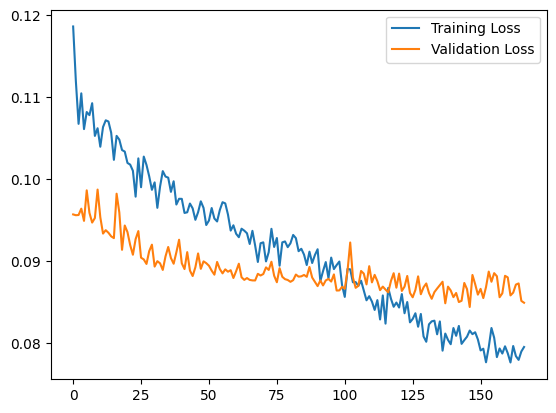

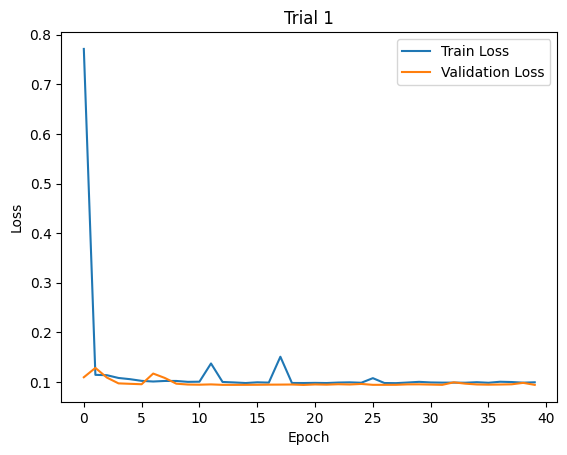

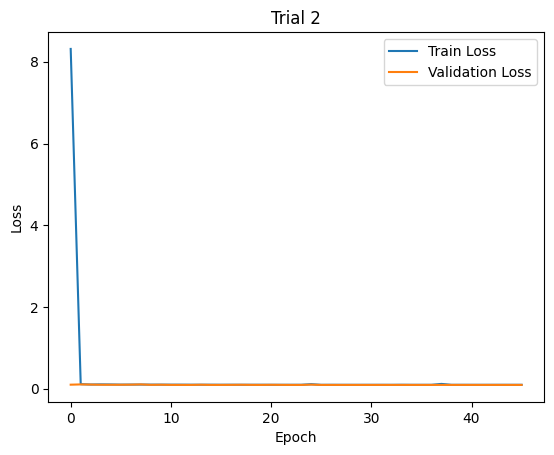

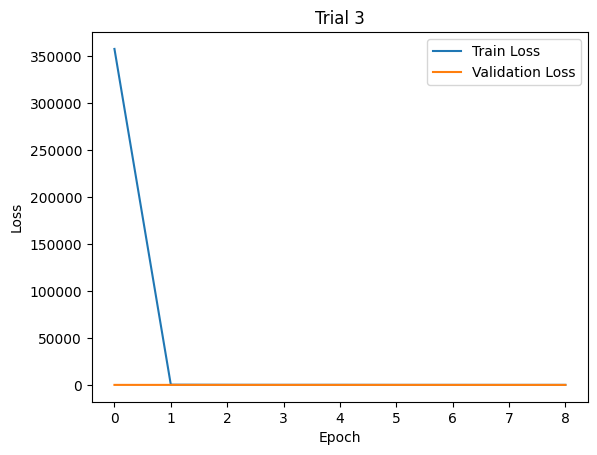

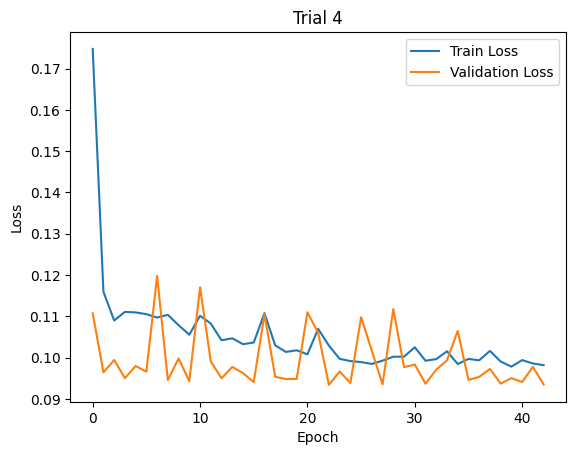

...

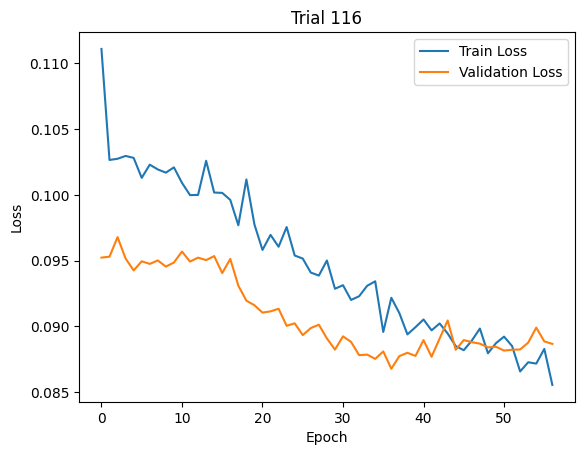

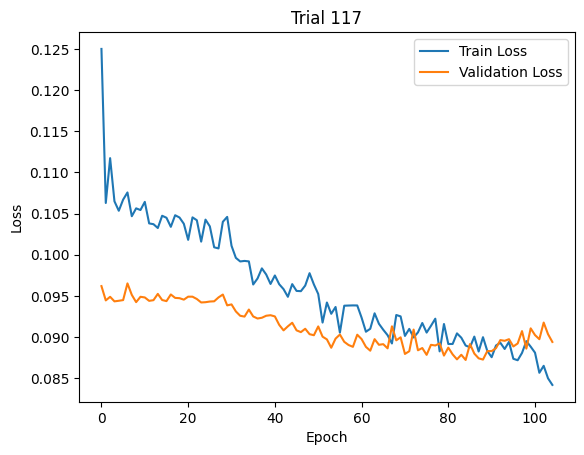

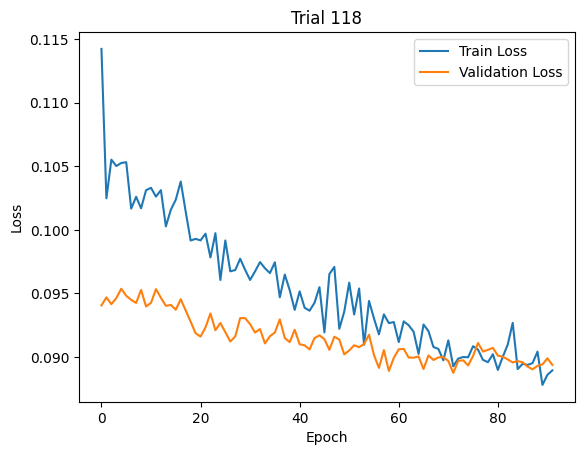

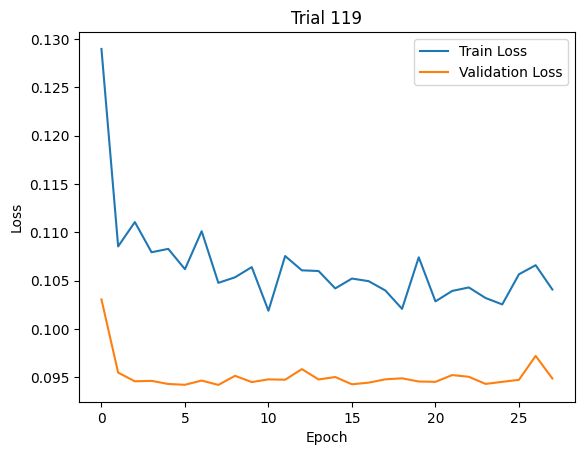

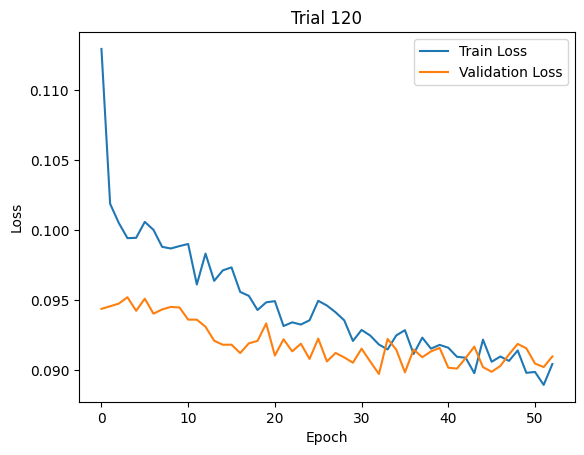

In [7]:
d_model_options = [16, 32, 64, 128, 256, 512, 1024]
nhead_options = [2, 4, 8,16]
num_layers_range = (1, 20)
dropout_range = (0.01, 0.5)
lr_range = (1e-5, 1e-2)
weight_decay = (1e-6, 1e-2)
num_hidden_layers_range=(1, 5)
hidden_dim_range=[64,128, 256, 512, 1024]
n_trials = 120
vocab_size = 300
max_seq_len = 50
output_dim = 2
num_epochs = 1000
patience = 20
train_losses = []
valid_losses = []
best_valid_loss = float('inf')
device = torch.device('cuda')
objective = Objective(train_loader, valid_loader, device, d_model_options, nhead_options, num_layers_range, dropout_range, lr_range, n_trials, vocab_size, max_seq_len, output_dim, num_epochs, patience, weight_decay,num_hidden_layers_range,hidden_dim_range)
best_value, best_params = objective.optimize()
objective.plot_losses()

In [8]:
print(f"Best trial:")
print(f"  Value: {best_value:.4f}")
print(f"  Params: {best_params}")

Best trial:
  Value: 0.0849
  Params: {'d_model': 128, 'nhead': 2, 'weight_decay': 0.00021695469999794207, 'num_layers': 7, 'dropout': 0.12083201115655015, 'lr': 2.197779988842485e-05, 'num_hidden_layers': 2, 'hidden_dim_0': 64, 'hidden_dim_1': 128, 'hidden_layers': [64, 128]}


In [31]:
processor1 = DataProcessor(data, output_data,seed1=42,seed2 = 17)
train_data1, val_data1, test_data1, train_indices1, val_indices1, test_indices1 = processor1.process_padded_data()
dataset1 = pd.read_excel(r'F:\junwei\dataset\_MASTER_MAFAI2023_456cases.xlsx')

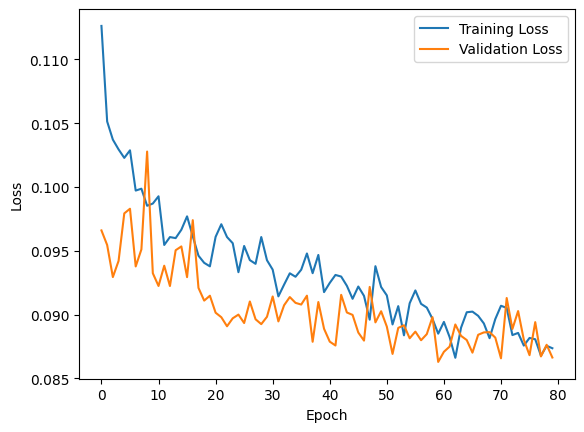

In [32]:
file_path = r'F:\junwei\transformer_fABBA\c\trial_86.pkl'
#file_path = r'F:\junwei\final_tranformer\best_model_C_R(10HZ-800)\trial_17(10HZ-800,800VOCAB).pkl'
vocab_size = 300
max_seq_len = 50
output_dim = 2
device = torch.device('cuda')
loader = BestModelLoader(file_path, vocab_size, max_seq_len, output_dim, device)
model, best_train_losses, best_valid_losses = loader.load_best_model()
model.eval()
loader.plot_loss(best_train_losses, best_valid_losses)
preds, targets = loader.test_model(model, test_loader)
R_pre = denormalize_data(preds[:,1],min_resistance, max_resistance)
C_pre = denormalize_data(preds[:,0],min_compliance, max_compliance)
R_true = denormalize_data(targets[:,1],min_resistance, max_resistance)
C_true = denormalize_data(targets[:,0],min_compliance, max_compliance)

In [33]:
evaluator_c = Evaluator(C_true, C_pre)
evaluator_r = Evaluator(R_true, R_pre)

mse1, mae1, nmse1, mape1,r2_1 = evaluator_c.evaluate()

mse2, mae2, nmse2, mape2,r2_2 = evaluator_r.evaluate()

evl = {'Metric': ['MSE','MAE', 'NMSE', 'MAPE'],
        'C': [mse1,mae1, nmse1, mape1],
        'R': [mse2,mae2, nmse2, mape2]
        }

results_df = pd.DataFrame(evl)

results_df.set_index('Metric', inplace=True)

print(results_df)


                 C          R
Metric                       
MSE     155.039444  25.183947
MAE       9.428799   2.935346
NMSE      1.078623   0.940904
MAPE     21.569410  20.081381


In [37]:
with open(loader.path, 'rb') as f:
    _, best_params, _, _ = pickle.load(f)

print("Best parameters:")
for key, value in best_params.items():
    print(f"    {key}: {value}")

Best parameters:
    d_model: 32
    nhead: 2
    weight_decay: 6.823442037661943e-05
    num_layers: 9
    dropout: 0.09960514069143443
    lr: 2.760894371322191e-05
    num_hidden_layers: 2
    hidden_dim_0: 64
    hidden_dim_1: 1024
    hidden_layers: [64, 1024]


In [34]:
import numpy as np
import matplotlib.pyplot as plt

class BlandAltman2:
    def __init__(self, output_data_unscaled, pre_data_unscaled):
        self.output_data_unscaled = output_data_unscaled
        self.pre_data_unscaled = pre_data_unscaled

    def plot(self, x_label, start, xlim_range,start_y,ylim_range):
        # Convert the values to numpy arrays
        output_data = np.asarray(self.output_data_unscaled)
        pre_data = np.asarray(self.pre_data_unscaled)

        # Calculate the difference and mean
        diff = output_data - pre_data
        mean = (output_data + pre_data) / 2

        # Calculate the percentage difference between predictions and targets
        percentage_diff = (diff / mean) * 100

        # Calculate the mean and standard deviation of the percentage difference
        mean_diff = np.mean(percentage_diff)
        std_diff = np.std(percentage_diff)

        overestimate_indices = []
        underestimate_indices = []
        # Find indices of outliers
        outlier_indices = []

        for i, percentage_error in enumerate(percentage_diff):
            if percentage_error > 20:  # overestimate
                outlier_indices.append(i)
                overestimate_indices.append(i)
            elif percentage_error < -20:  # underestimate
                outlier_indices.append(i)
                underestimate_indices.append(i)

        # Plot the Bland-Altman plot with percentage difference
        fig, ax = plt.subplots(figsize=(8, 5.5))
        for i in range(len(percentage_diff)):
            if i in outlier_indices:
                ax.scatter(output_data[i], percentage_diff[i], color='red', s=15)
            else:
                ax.scatter(output_data[i], percentage_diff[i], color='blue', s=15)
        ax.axhline(mean_diff, color='gray', linestyle='--',lw = 2)
        upper_limit = mean_diff + 1.96 * std_diff
        lower_limit = mean_diff - 1.96 * std_diff
        ax.axhline(mean_diff + 1.96 * std_diff, color='gray', linestyle='--',lw = 2)
        ax.axhline(mean_diff - 1.96 * std_diff, color='gray', linestyle='--',lw = 2)
        ax.axhline(20, color='green', linestyle='-',lw = 2.5)
        ax.axhline(-20, color='green', linestyle='-',lw = 2.5)
        ax.set_xlabel(x_label, fontsize=14)
        ax.set_ylabel('Percentage Difference between Predictions and Targets', fontsize=11)
        #ax.set_title('Bland-Altman Plot', fontsize=16)
        ax.tick_params(axis='both', which='major', labelsize=12)
        ax.set_xlim(start, xlim_range)
        ax.set_ylim(start_y, ylim_range)
        #yticks = np.arange(start_y, ylim_range + 1, 10)  
        #plt.yticks(yticks)
        ax.set_yticks([-60,-50,-40,-30,-20,-10, 0, 10,20,30,40,50,60])
        plt.show()
        print("The Y-coordinate for the upper gray line is: ", upper_limit)
        print("The Y-coordinate for the lower gray line is: ", lower_limit)
        print(f"Mean difference line Y-value: {mean_diff}")
        # Print indices of outliers
        #print("Indices of outliers: ", outlier_indices)
        #print("Indices of overestimations: ", overestimate_indices)
        #print("Indices of underestimations: ", underestimate_indices)
        return outlier_indices, overestimate_indices, underestimate_indices


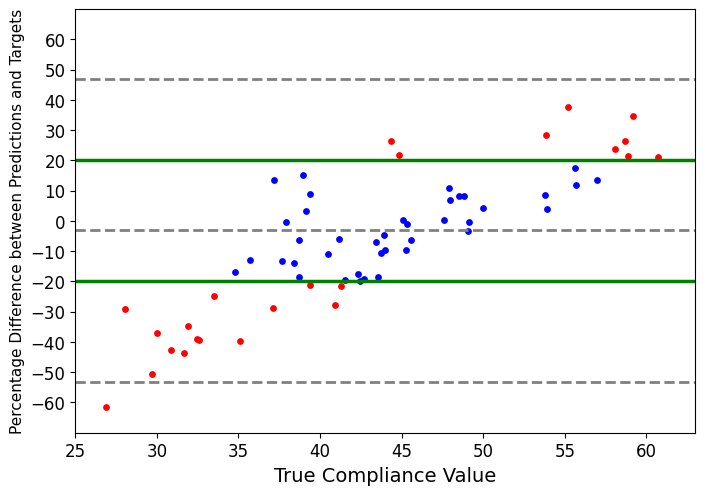

The Y-coordinate for the upper gray line is:  46.98574230194092
The Y-coordinate for the lower gray line is:  -53.18956729888916
Mean difference line Y-value: -3.101912498474121


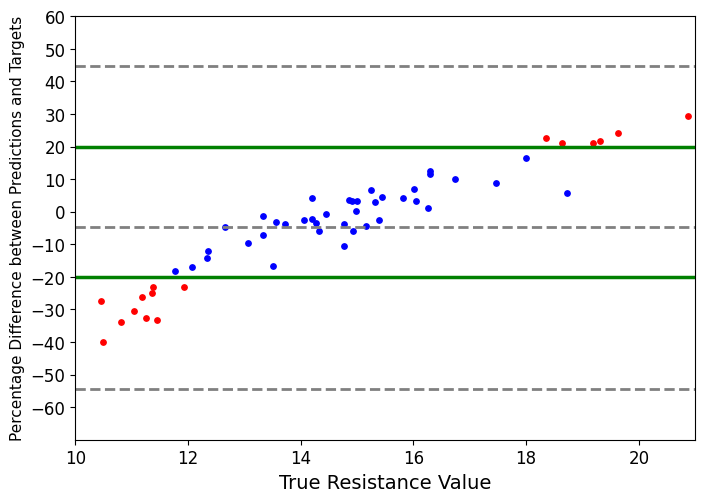

The Y-coordinate for the upper gray line is:  44.76810539245606
The Y-coordinate for the lower gray line is:  -54.45034492492676
Mean difference line Y-value: -4.841119766235352


In [35]:
bland_C = BlandAltman2(C_true, C_pre)
bland_R = BlandAltman2(R_true, R_pre)

outlier_indices_C = bland_C.plot('True Compliance Value',25,63,-70,70)
outlier_indices_R = bland_R.plot('True Resistance Value',10,21,-70,50) 

In [14]:
#index1 = 296
#plt.figure()
#plt.plot(flow[index1])
#plt.xlabel('Time')
#plt.ylabel('Flow')
#plt.title('Flow - Sample {}'.format(index1))
#plt.show()

# Plot for pressure
#plt.figure()
#plt.plot(pressure[index1])
#plt.xlabel('Time')
#plt.ylabel('Pressure')
#plt.title('Pressure - Sample {}'.format(index1))
#plt.show()

# Plot for volume
##plt.figure()
#plt.plot(volume[index1])
#plt.xlabel('Time')
#plt.ylabel('Volume')
#plt.title('Volume - Sample {}'.format(index1))
#plt.show()

In [15]:
#plt.scatter(C_true, C_pre)

# Add labels and title
##plt.xlabel('C_true')
#plt.ylabel('C_pre')
#plt.title('C_true vs C_pre')

# Display the plot
#plt.show()

In [16]:
#sequence_tokenizer = WordPiece(vocab_size=2000,max_seq_len=60)
#sequence_tokenizer.train_tokenizer(data)
#directory = r'F:\junwei\final_tranformer\transformer_C _R\wordpiece'

#file_path = os.path.join(directory, 'sequence_tokenizer.pkl')

#with open(file_path, 'wb') as f:
#   pickle.dump(sequence_tokenizer, f)

In [17]:
#train_data.to_pickle(r'F:\junwei\final_tranformer\train_test_val\train_data.pickle')
#test_data.to_pickle(r'F:\junwei\final_tranformer\train_test_val\test_data.pickle')
#val_data.to_pickle(r'F:\junwei\final_tranformer\train_test_val\val_data.pickle')

In [18]:
import numpy as np

def count_lengths(data):
    lengths_dict = {
        '70-80': 0,
        '80-90': 0,
        '90-100': 0,
        '100-110': 0,
        '110-120': 0,
        '120-130': 0,
        '130-140': 0,
        '140-150': 0,
        '150-160': 0,
        '160-170': 0,
        '170-180': 0,
        '180-190': 0,
        '190-200': 0,
        '200-210': 0,
        '210-220': 0,
        '220-230': 0,
        '230-240': 0,
        '250-260': 0
    }

    for sentence in data:
        # Remove padding
        sentence = sentence[sentence != 0]
        
        # Count length
        length = len(sentence)

        # Classify length
        if 70 <= length < 80:
            lengths_dict['70-80'] += 1
        elif 80 <= length < 90:
            lengths_dict['80-90'] += 1
        elif 90 <= length < 100:
            lengths_dict['90-100'] += 1
        elif 100 <= length < 110:
            lengths_dict['100-110'] += 1
        elif 110 <= length < 120:
            lengths_dict['110-120'] += 1
        elif 120 <= length < 130:
            lengths_dict['120-130'] += 1
        elif 130 <= length < 140:
            lengths_dict['130-140'] += 1
        elif 140 <= length < 150:
            lengths_dict['140-150'] += 1
        elif 150 <= length < 160:
            lengths_dict['150-160'] += 1
        elif 160 <= length < 170:
            lengths_dict['160-170'] += 1
        elif 170 <= length < 180:
            lengths_dict['170-180'] += 1
        elif 180 <= length < 190:
            lengths_dict['180-190'] += 1
        elif 190 <= length < 200:
            lengths_dict['190-200'] += 1
        elif 200 <= length < 210:
            lengths_dict['200-210'] += 1
        elif 210 <= length < 220:
            lengths_dict['210-220'] += 1
        elif 220 <= length < 230:
            lengths_dict['220-230'] += 1
        elif 230 <= length < 240:
            lengths_dict['230-240'] += 1
        elif 240 <= length < 250:
            lengths_dict['240-250'] += 1

    return lengths_dict

# Call the function
lengths_dict = count_lengths(padded_data)

# Print the result
for k, v in lengths_dict.items():
    print(f"Number of samples with length {k}: {v}")


Number of samples with length 70-80: 28
Number of samples with length 80-90: 22
Number of samples with length 90-100: 7
Number of samples with length 100-110: 5
Number of samples with length 110-120: 5
Number of samples with length 120-130: 2
Number of samples with length 130-140: 0
Number of samples with length 140-150: 2
Number of samples with length 150-160: 1
Number of samples with length 160-170: 1
Number of samples with length 170-180: 1
Number of samples with length 180-190: 0
Number of samples with length 190-200: 1
Number of samples with length 200-210: 0
Number of samples with length 210-220: 0
Number of samples with length 220-230: 0
Number of samples with length 230-240: 0
Number of samples with length 250-260: 0
